# Softmax exercise

*Complete and hand in this completed worksheet (including its outputs and any supporting code outside of the worksheet) with your assignment submission. For more details see the [assignments page](http://vision.stanford.edu/teaching/cs231n/assignments.html) on the course website.*

This exercise is analogous to the SVM exercise. You will:

- implement a fully-vectorized **loss function** for the Softmax classifier
- implement the fully-vectorized expression for its **analytic gradient**
- **check your implementation** with numerical gradient
- use a validation set to **tune the learning rate and regularization** strength
- **optimize** the loss function with **SGD**
- **visualize** the final learned weights


In [1]:
from __future__ import print_function

import random
import numpy as np
from cs231n.data_utils import load_CIFAR10
import matplotlib.pyplot as plt


%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# for auto-reloading extenrnal modules
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

In [2]:
def get_CIFAR10_data(num_training=49000, num_validation=1000, num_test=1000, num_dev=500):
    """
    Load the CIFAR-10 dataset from disk and perform preprocessing to prepare
    it for the linear classifier. These are the same steps as we used for the
    SVM, but condensed to a single function.  
    """
    # Load the raw CIFAR-10 data
    cifar10_dir = 'cs231n/datasets/cifar-10-batches-py'
    X_train, y_train, X_test, y_test = load_CIFAR10(cifar10_dir)
    
    # subsample the data
    mask = list(range(num_training, num_training + num_validation))
    X_val = X_train[mask]
    y_val = y_train[mask]
    mask = list(range(num_training))
    X_train = X_train[mask]
    y_train = y_train[mask]
    mask = list(range(num_test))
    X_test = X_test[mask]
    y_test = y_test[mask]
    mask = np.random.choice(num_training, num_dev, replace=False)
    X_dev = X_train[mask]
    y_dev = y_train[mask]
    
    # Preprocessing: reshape the image data into rows
    X_train = np.reshape(X_train, (X_train.shape[0], -1))
    X_val = np.reshape(X_val, (X_val.shape[0], -1))
    X_test = np.reshape(X_test, (X_test.shape[0], -1))
    X_dev = np.reshape(X_dev, (X_dev.shape[0], -1))
    
    # Normalize the data: subtract the mean image
    mean_image = np.mean(X_train, axis = 0)
    X_train -= mean_image
    X_val -= mean_image
    X_test -= mean_image
    X_dev -= mean_image
    
    # add bias dimension and transform into columns
    X_train = np.hstack([X_train, np.ones((X_train.shape[0], 1))])
    X_val = np.hstack([X_val, np.ones((X_val.shape[0], 1))])
    X_test = np.hstack([X_test, np.ones((X_test.shape[0], 1))])
    X_dev = np.hstack([X_dev, np.ones((X_dev.shape[0], 1))])
    
    return X_train, y_train, X_val, y_val, X_test, y_test, X_dev, y_dev


# Invoke the above function to get our data.
X_train, y_train, X_val, y_val, X_test, y_test, X_dev, y_dev = get_CIFAR10_data()
print('Train data shape: ', X_train.shape)
print('Train labels shape: ', y_train.shape)
print('Validation data shape: ', X_val.shape)
print('Validation labels shape: ', y_val.shape)
print('Test data shape: ', X_test.shape)
print('Test labels shape: ', y_test.shape)
print('dev data shape: ', X_dev.shape)
print('dev labels shape: ', y_dev.shape)

Train data shape:  (49000, 3073)
Train labels shape:  (49000,)
Validation data shape:  (1000, 3073)
Validation labels shape:  (1000,)
Test data shape:  (1000, 3073)
Test labels shape:  (1000,)
dev data shape:  (500, 3073)
dev labels shape:  (500,)


## Softmax Classifier

Your code for this section will all be written inside **cs231n/classifiers/softmax.py**. 


In [3]:
# First implement the naive softmax loss function with nested loops.
# Open the file cs231n/classifiers/softmax.py and implement the
# softmax_loss_naive function.

from cs231n.classifiers.softmax import softmax_loss_naive
import time

# Generate a random softmax weight matrix and use it to compute the loss.
W = np.random.randn(3073, 10) * 0.0001
loss, grad = softmax_loss_naive(W, X_dev, y_dev, 0.0)

# As a rough sanity check, our loss should be something close to -log(0.1).
print('loss: %f' % loss)
print('sanity check: %f' % (-np.log(0.1)))

loss: 2.394146
sanity check: 2.302585


## Inline Question 1:
Why do we expect our loss to be close to -log(0.1)? Explain briefly.**

**Your answer:** *Fill this in*


In [4]:
# Complete the implementation of softmax_loss_naive and implement a (naive)
# version of the gradient that uses nested loops.
loss, grad = softmax_loss_naive(W, X_dev, y_dev, 0.0)

# As we did for the SVM, use numeric gradient checking as a debugging tool.
# The numeric gradient should be close to the analytic gradient.
from cs231n.gradient_check import grad_check_sparse
f = lambda w: softmax_loss_naive(w, X_dev, y_dev, 0.0)[0]
grad_numerical = grad_check_sparse(f, W, grad, 10)

# similar to SVM case, do another gradient check with regularization
loss, grad = softmax_loss_naive(W, X_dev, y_dev, 5e1)
f = lambda w: softmax_loss_naive(w, X_dev, y_dev, 5e1)[0]
grad_numerical = grad_check_sparse(f, W, grad, 10)

numerical: -0.104275 analytic: -0.104275, relative error: 7.884431e-08
numerical: -0.100544 analytic: -0.100544, relative error: 5.869264e-09
numerical: 1.726376 analytic: 1.726376, relative error: 7.528648e-09
numerical: 0.174476 analytic: 0.174476, relative error: 1.484798e-07
numerical: 0.097243 analytic: 0.097243, relative error: 7.508378e-07
numerical: 1.108887 analytic: 1.108887, relative error: 2.728149e-08
numerical: -2.227506 analytic: -2.227506, relative error: 8.529756e-09
numerical: -6.637247 analytic: -6.637247, relative error: 7.953110e-09
numerical: -2.645812 analytic: -2.645812, relative error: 2.807057e-09
numerical: 1.454792 analytic: 1.454792, relative error: 2.043789e-08
numerical: 5.443693 analytic: 5.443693, relative error: 1.716714e-08
numerical: -4.435358 analytic: -4.435357, relative error: 1.068837e-08
numerical: -0.685800 analytic: -0.685799, relative error: 6.392614e-08
numerical: 1.386839 analytic: 1.386839, relative error: 6.850840e-09
numerical: 2.000738 

In [15]:
# Now that we have a naive implementation of the softmax loss function and its gradient,
# implement a vectorized version in softmax_loss_vectorized.
# The two versions should compute the same results, but the vectorized version should be
# much faster.
tic = time.time()
loss_naive, grad_naive = softmax_loss_naive(W, X_dev, y_dev, 0.000005)
toc = time.time()
print('naive loss: %e computed in %fs' % (loss_naive, toc - tic))

from cs231n.classifiers.softmax import softmax_loss_vectorized
tic = time.time()
loss_vectorized, grad_vectorized = softmax_loss_vectorized(W, X_dev, y_dev, 0.000005)
toc = time.time()
print('vectorized loss: %e computed in %fs' % (loss_vectorized, toc - tic))

# As we did for the SVM, we use the Frobenius norm to compare the two versions
# of the gradient.
grad_difference = np.linalg.norm(grad_naive - grad_vectorized, ord='fro')
print('Loss difference: %f' % np.abs(loss_naive - loss_vectorized))
print('Gradient difference: %f' % grad_difference)

naive loss: 2.394146e+00 computed in 0.144395s
(3073, 10)
vectorized loss: 2.394146e+00 computed in 0.005167s
Loss difference: 0.000000
Gradient difference: 0.000000


In [6]:
# Use the validation set to tune hyperparameters (regularization strength and
# learning rate). You should experiment with different ranges for the learning
# rates and regularization strengths; if you are careful you should be able to
# get a classification accuracy of over 0.35 on the validation set.
from cs231n.classifiers import Softmax
results = {}
best_val = -1
best_softmax = None
learning_rates = [1e-7, 5e-7]
regularization_strengths = [2.5e4, 5e4]

################################################################################
# TODO:                                                                        #
# Use the validation set to set the learning rate and regularization strength. #
# This should be identical to the validation that you did for the SVM; save    #
# the best trained softmax classifer in best_softmax.                          #
################################################################################

def function(lr, reg, best_val, best_softmax):
    
    softmax = Softmax()    
    softmax.train(X_train, y_train, lr, reg, 1500)
    
    y_train_predict = softmax.predict(X_train)
    train_accuracy = np.mean(y_train_predict == y_train)
    
    y_val_predict = softmax.predict(X_val)
    val_accuracy = np.mean(y_val_predict == y_val)
    
    if val_accuracy > best_val:
        best_softmax = softmax
        best_val = val_accuracy
        
    return (train_accuracy, val_accuracy), best_val, best_softmax


for lr in learning_rates:
    for reg in regularization_strengths:
        results[(lr, reg)], best_val, best_softmax = function(lr, reg, best_val, best_softmax)

################################################################################
#                              END OF YOUR CODE                                #
################################################################################
    
# Print out results.
for lr, reg in sorted(results):
    train_accuracy, val_accuracy = results[(lr, reg)]
    print('lr %e reg %e train accuracy: %f val accuracy: %f' % (
                lr, reg, train_accuracy, val_accuracy))
    
print('best validation accuracy achieved during cross-validation: %f' % best_val)

[3.33307882e-06 3.93954801e-04 1.68131762e-06 1.16819580e-05
 5.50695621e-05 7.43076129e-06 9.77788399e-05 3.61004466e-06
 8.92730515e-06 2.28243789e-05 9.66197200e-04 8.91274942e-06
 2.11699756e-05 7.66958319e-04 1.06436550e-06 4.73889805e-06
 3.28558214e-06 3.43356193e-05 8.32735260e-06 5.60049981e-05
 5.51996527e-06 6.56613618e-07 6.44783442e-04 1.77473209e-05
 2.32332883e-01 7.42959743e-05 4.27607791e-06 4.30201678e-05
 3.62360328e-04 7.43485942e-06 3.82081630e-05 3.38055649e-04
 2.06662012e-05 1.72865360e-05 8.79331087e-06 8.98408997e-05
 4.39878328e-05 2.11477628e-04 4.85990222e-05 5.20872926e-06
 5.53588428e-05 4.04265926e-06 5.71409473e-07 7.67105656e-04
 4.84077044e-05 1.70841444e-05 2.50488793e-05 1.25046800e-06
 9.26907330e-04 4.26706791e-05 4.15388633e-06 8.44240252e-06
 2.18944857e-05 5.56501816e-06 1.02608999e-05 2.61353456e-06
 1.75016256e-06 2.56341874e-05 9.25293848e-07 4.88568857e-06
 9.24489438e-06 6.54319485e-07 1.53604830e-04 3.68531817e-06
 7.62141336e-06 6.392787

[1.91329132e-02 2.83290359e-04 1.09494249e-03 6.77189822e-04
 1.41571788e-04 1.57379285e-04 3.63629160e-03 5.50079627e-04
 4.29853710e-05 4.48652478e-03 1.17331553e-03 2.29006674e-03
 2.84978377e-03 8.28464442e-05 9.66376433e-04 5.40961423e-05
 1.00178031e+00 8.13416093e-04 2.10397421e-04 1.90918647e-03
 4.41433174e-04 1.33639680e-04 1.39900970e-04 5.98417718e-06
 1.11769162e-02 1.79660334e-01 1.45673451e-03 1.88059189e-04
 8.68217976e-05 2.95528525e-05 1.93259507e-04 2.97446702e-03
 2.65013415e-04 2.72806883e-05 8.43248092e-06 3.36509925e-04
 1.46392598e-04 7.12442423e-04 3.77068830e-02 6.85985160e-04
 3.92411866e-04 5.13340471e-05 1.85293043e-04 1.06005529e-04
 1.54752417e-04 1.00694082e-02 9.73889478e-05 4.92914818e-04
 2.33986759e-04 6.50330464e-05 1.38119474e-05 2.40740956e-04
 7.83362950e-05 3.73798331e-04 3.36549399e-04 5.10428119e-04
 9.71226699e-05 2.45195008e-04 6.12525832e-03 1.71641657e-03
 5.98222537e-04 5.43997709e-04 3.95606188e-04 8.74510476e-05
 1.48721614e-04 4.383647

[4.38839043e-03 2.23515025e-04 3.30621567e-03 7.92209219e-04
 3.18958937e-03 1.64156633e-03 2.46243773e-03 4.64913616e-03
 3.49503800e-03 2.71325218e-04 1.74357926e-04 4.36667247e-04
 2.60066955e-04 2.87976556e-03 6.00531483e-03 6.43406481e-05
 6.02379832e-05 5.47695586e-04 3.76389897e-03 2.01271745e-02
 1.70189382e-04 7.98979365e-03 4.07269342e-04 1.96726980e-04
 2.89404807e-02 5.77437734e-04 1.07899778e-03 1.82556437e-02
 5.57132115e-04 9.06305572e-04 1.78608092e-03 7.60595503e-04
 2.35444486e-04 8.99767668e-05 6.71773940e-05 1.88509999e-04
 1.01998403e-03 1.60002951e-03 1.10234923e-02 1.00634340e-03
 5.24567177e-04 9.66116851e-04 5.25672165e-04 3.05466420e-04
 4.81064994e-04 2.80108765e-04 1.82055059e-04 3.14255788e-02
 2.67642643e-04 1.04433885e-03 1.76458830e-02 7.40741876e-03
 3.28423055e-03 2.63722619e-03 8.61576766e-04 2.30156957e-03
 1.04506722e-03 4.67767637e-03 1.04896804e-03 1.07866664e-04
 3.15495268e-04 1.20363921e-02 4.53368345e-03 1.15693551e-04
 1.10285517e-03 2.509336

[3.53885938e-04 5.11410452e-03 9.95774902e-03 1.70282053e-02
 4.92409527e-04 9.88656893e-04 8.92286032e-04 8.44548530e-03
 1.24015688e-04 2.27315351e-02 6.91777368e-04 2.18787005e-04
 1.71703054e-03 9.71954085e-03 9.82226914e-04 8.76553482e-04
 6.42931469e-03 1.85467160e-02 5.64668886e-03 2.90091629e-03
 1.04589868e-03 2.56352195e-02 1.18457129e-03 1.71565031e-02
 4.84144274e-03 2.18506300e-03 4.03336108e-04 1.28881352e-03
 1.04297814e-02 1.45162297e-03 1.74539762e-02 4.42653536e-04
 4.10097314e-04 1.07583483e-03 4.55547342e-02 1.13699431e-03
 1.31654999e-01 1.64285341e-03 1.84264129e-03 8.53242800e-04
 1.74315889e-03 6.96170761e-03 2.53359742e-03 2.24293211e-04
 2.15892089e-03 3.18148819e-04 3.47660699e-03 3.43020638e-03
 3.08379384e-03 4.08500536e-04 3.32293170e-04 2.53779150e-03
 8.35536579e-04 3.08004121e-04 3.33300347e-03 5.23165473e-04
 1.53393857e-02 1.23823002e-01 3.21794246e-04 5.29126950e-02
 2.05663004e-02 7.16960790e-04 3.07309346e-03 9.96659862e-04
 1.04547805e-02 1.390537

[1.71553689e-04 7.30836801e-05 3.35345441e-04 2.78447190e-03
 3.91752780e-04 1.38551096e-04 1.75514975e-03 2.06173728e-04
 2.52690115e-04 2.96516167e-03 1.50544870e-03 1.18015091e-02
 2.25380139e-05 2.33429377e-04 5.26348058e-03 2.82341651e-05
 1.13382914e-03 3.29169901e-04 2.94582846e-04 2.50374483e-02
 2.08036428e-04 3.95230909e-04 8.38602051e-05 9.39119302e-04
 1.00033906e+00 3.56559192e-04 1.72715815e-03 3.13547598e-04
 8.96479956e-04 1.44683486e-04 1.95084288e-02 1.33514536e-04
 1.03875386e-04 3.18701644e-05 4.85894565e-04 3.18306126e-04
 1.32557786e-03 1.72324294e-04 6.95338566e-04 1.33514536e-04
 9.66382653e-05 9.37458165e-05 1.64617172e-04 1.40878924e-03
 1.39403706e-03 1.67736788e-04 6.02537320e-04 5.90205489e-05
 7.59491847e-03 7.43588220e-04 1.23724783e-04 1.49309309e-03
 1.08873185e-03 2.49767396e-03 4.21333743e-03 1.60956584e-04
 1.33398133e-03 2.44009405e-03 4.58312728e-05 4.68334625e-05
 1.29524362e-04 4.79235735e-04 1.88252540e-03 1.76980423e-03
 7.18631940e-05 1.825351

[0.1516535  0.01313527 0.30134118 0.01020177 0.0420521  0.01103574
 0.00827803 0.01035259 0.28108168 0.1022609  0.00899464 0.02664905
 0.01415827 0.01541143 0.00375373 0.06823289 0.00159044 0.01008984
 0.00976005 0.04238411 0.02857884 0.02744084 0.57145255 0.03020647
 0.00693677 0.15263931 0.05920427 0.01102118 0.0257318  0.0106124
 0.06036965 0.00347052 0.06708058 0.00450053 0.0213022  0.01594296
 0.11863662 0.0156655  0.00966907 0.02621932 1.01217909 0.05416465
 0.02538921 0.03046828 0.01388762 0.26017868 0.00454394 0.0044829
 0.00909753 0.01083232 0.00460498 0.07271273 0.02861453 0.01271622
 0.04999465 0.05103713 0.02224377 0.03853967 0.05198961 0.03495746
 0.32395559 0.01045843 0.01675734 0.03845985 0.00910447 0.00757217
 0.04492619 0.01357581 0.0325468  0.01125587 0.00684333 0.15243994
 0.0097205  0.10374748 0.22114168 0.05052585 0.01971518 0.01805294
 0.07313417 0.02585537 0.12317509 0.01206594 0.09029882 0.00500579
 0.02418901 0.01145878 0.007858   0.29931652 0.01143324 0.009585

[0.02321833 0.00487194 0.03341578 0.060361   0.01323432 0.02974437
 0.03732829 0.12194374 0.01099934 0.02386814 0.03042859 0.03216259
 0.01099797 0.04802871 0.07158142 0.03121549 0.00645286 0.015511
 0.07438463 0.0056702  0.06579799 0.26498585 0.01254425 0.02098426
 0.2025586  0.35367854 0.01106108 0.02966108 0.07989981 0.0015554
 0.00533148 0.01479938 0.1209891  0.09271732 0.03206487 0.07197165
 0.0521977  0.27309445 0.02930699 0.09002042 0.04971671 0.00938067
 0.04604063 0.06358088 0.10891426 0.01687194 0.03324705 0.03187215
 0.13295803 0.00171911 0.06760568 0.01043306 0.01760685 0.01924983
 0.98512854 0.00912226 0.02867261 0.02794603 0.09450372 0.00640093
 0.07709797 0.0666671  0.26358923 0.05534499 0.06569906 0.00236155
 0.00927351 0.01482647 0.03171176 0.00646995 0.00277824 0.05792815
 0.02096318 0.00793951 0.03903494 0.02598096 0.0326821  0.11394002
 0.08880265 0.01312156 0.02083374 0.02560726 0.05214429 0.17440971
 0.04811079 0.01666892 0.08975169 1.20965271 0.00534467 0.0957112

[4.77010587e-03 1.49893596e-03 7.65764654e-02 2.23671608e-03
 6.13100422e-03 1.38172865e-03 9.20134282e-03 3.62327611e-03
 3.83993378e-03 4.94231928e-02 3.13174610e-03 5.11698385e-03
 1.57466626e-03 1.92987094e-03 3.73035735e-03 3.02792024e-03
 2.39913044e-04 9.71074273e-03 3.62330106e-03 1.30065335e-02
 2.47512569e-02 1.32996522e-03 1.19014744e-03 9.96085092e-04
 9.42900956e-03 1.69352509e-02 1.91239946e-02 1.03603221e-02
 1.06069932e-03 1.85481346e-02 6.30849544e-03 2.00535095e-03
 4.01506732e-03 1.82408438e-02 8.84976838e-03 3.40000621e-03
 1.02262332e-02 3.89057483e-02 7.90104714e-03 9.32666074e-03
 2.62900855e-03 6.90843440e-03 1.34186636e-02 3.48408885e-03
 1.01494369e+00 3.07950146e-03 2.12796360e-03 1.38545677e-03
 3.99981732e-03 1.15861902e-03 3.66616771e-03 2.63526644e-03
 8.20752145e-04 4.64424135e-02 3.82663239e-02 1.13999383e-02
 8.30873121e-03 4.48962866e-02 8.94222183e-04 5.24950889e-04
 6.25966656e-04 1.58747294e-02 4.52374839e-03 6.38206777e-03
 3.99637170e-03 4.436003

[0.00906254 0.01919931 0.02911695 0.00623995 0.00831272 0.00577955
 0.01173857 0.00874767 0.00314811 0.00954671 0.03293076 0.00618455
 0.02643272 0.00365249 0.00826751 0.02754851 0.00959133 0.01403792
 0.06968359 0.0200423  0.00974843 0.09049227 0.01044045 0.0040496
 0.01066836 0.00889506 0.00849436 0.08602626 0.04084166 0.0035572
 0.01165781 0.02425292 0.08264736 0.00667756 0.01015548 0.00942103
 0.03489682 0.00455018 0.0570648  0.04400471 0.00556697 0.00434591
 0.00528784 0.13043604 0.00579397 0.0085617  0.01895747 0.08126545
 0.01421111 0.00591796 0.00308618 0.05820305 0.00709633 0.00802796
 0.02009125 0.01002266 0.00949781 0.02203638 0.01312367 0.06081537
 0.00814194 0.02887055 0.02382148 0.00652608 0.03136381 0.02350405
 0.01205437 0.00452731 0.07652246 0.03990307 0.00977018 0.00295705
 0.0063835  0.00411961 0.01363449 0.01708825 0.00870763 0.0412278
 0.00397752 0.01051247 0.01160775 0.00875428 0.00877223 0.02038588
 0.02406852 0.06192637 0.03459589 0.00810259 0.00855502 0.0187596

[0.0109483  0.00972155 0.00699836 0.0324458  0.0226821  0.00227415
 0.01022485 0.05449069 0.01949132 0.01857508 0.0138503  0.01640612
 0.00598016 0.00313678 0.01666833 0.01098839 0.017117   0.01956052
 0.02192223 0.26637521 0.007072   0.01044591 0.00560763 0.07570821
 0.01027358 0.01246535 0.01305887 0.03015739 0.02568855 0.01398229
 0.00431091 0.02867507 0.02233208 0.0437393  0.03067944 0.00346966
 0.01166283 0.03038713 0.01022226 0.0177714  0.01547403 0.00823883
 0.01584997 0.02665269 0.02436466 0.03954673 0.01579123 0.03823888
 0.02447381 0.06801316 0.01237642 0.03392613 0.01656988 0.02058131
 0.01398079 0.0108865  0.01745948 0.04128622 0.05695238 0.02903162
 0.0147856  0.00516384 0.00996673 0.01467185 0.02184971 0.07063259
 0.13273913 0.00755691 0.04489025 0.03136772 0.04240157 0.00556717
 0.00606005 0.03457622 0.1613798  0.01606573 0.02657621 0.00944854
 0.16235637 0.12069259 0.03988927 0.02296995 0.08295799 0.03159216
 0.07440779 0.00523665 0.00346192 1.00453374 0.01212144 0.0075

[0.05820174 0.27169472 0.02967585 0.09543926 0.12023876 0.56550057
 0.08767935 0.04484173 1.08973634 0.13270515 0.10054459 0.50646675
 0.27092821 0.05068601 0.10984149 0.08660923 0.27570783 0.09508992
 0.10248615 0.0634675  0.11708457 0.19746743 0.56411897 0.05450938
 0.31111424 0.45252173 0.19125222 0.23064221 0.13117472 0.33820979
 0.24649736 0.0703564  0.10122308 0.2014749  0.05603936 1.14797153
 0.30959682 0.06904039 0.1071039  0.13102754 0.10692662 0.16987201
 0.33499032 0.85624802 0.05833212 0.14358092 0.24651007 0.11299815
 0.38876603 0.04568666 0.16127607 0.19419076 0.26556886 0.29342013
 0.04120108 0.14034539 0.15857827 0.35850585 0.19135738 0.06925412
 0.24282669 0.10562123 0.78072074 0.59837385 0.22599598 0.20029466
 0.5454758  0.13837483 0.07576207 0.15378966 0.3652375  0.18668323
 0.30039377 0.09041656 0.17266346 0.09368588 0.25492439 0.20376154
 0.09186129 0.15675023 0.12297359 0.04464103 0.44312671 0.04796101
 0.14473482 0.40649315 0.04512303 0.09791658 0.20035732 0.1284

 0.46303335 0.27985515]
[0.11466775 0.31477686 0.11408779 0.06912046 0.25026717 0.13135287
 0.02174046 0.26672184 0.05357035 0.10700463 0.09481457 0.07056255
 0.11414523 0.09491626 0.18365425 0.1313589  0.04909724 0.03778738
 0.1566394  0.21603832 0.28133507 0.04566595 0.07353675 0.13041374
 0.09486367 0.04143572 0.2695574  0.23357535 0.04228404 0.09134429
 0.14169328 0.12405529 0.16015071 0.127627   0.38003715 0.09277344
 0.08688024 0.09390321 0.15884367 0.0487982  0.27255717 0.06234391
 0.19412607 0.2233883  0.09803791 0.47171015 0.22564657 0.04508781
 0.03609566 0.05330785 0.17312107 0.0649369  0.31001564 0.08466368
 0.07066669 0.05252048 0.09465336 0.44288043 0.10956434 0.21214371
 0.06656525 0.12154771 0.17993586 0.03934692 0.10606228 0.03313008
 0.05802276 0.06850631 0.09808578 0.17806821 0.03560887 0.10503752
 0.10324869 0.05806958 0.0993964  0.09090748 0.07027656 0.11998248
 0.2386238  0.07396769 0.13599129 0.05330928 0.13324611 0.13017501
 0.10539535 0.37544589 0.13262417 0.32

[1.2786316  1.32314877 0.66423688 0.91292599 0.43155863 0.19052676
 0.30419724 0.3672429  0.64269837 0.54625363 0.13871165 0.32570032
 0.10755387 0.25783844 1.42901287 0.99763494 0.28509364 1.61786988
 0.19961757 0.15593019 0.4102884  0.50794108 0.44261595 0.40562328
 0.11829172 0.44732496 1.40355275 0.15711093 0.37569407 0.35193216
 0.18764448 0.16953503 0.21287032 0.3449813  0.35431192 0.20757034
 0.35567459 0.74281652 0.21165879 0.71095658 0.46928217 0.86294803
 0.61550494 0.48169061 0.56188216 1.01427493 0.23530329 0.39121571
 0.23814794 0.29624799 0.1765443  0.40066974 0.54439512 0.10691014
 0.3198588  0.21854488 0.52948478 0.19542096 1.38499519 0.48160382
 0.52318304 0.25629671 0.19719872 0.3657888  0.28431129 0.2684939
 0.14347281 0.27921468 0.25803271 0.24149493 0.21554574 0.1778347
 0.23888076 1.52837387 0.3882371  0.22262411 0.23471832 0.14615339
 0.16092335 0.24498973 0.30636244 1.15425603 0.15382351 0.4254148
 0.39422886 0.17099595 0.26556495 0.58832208 0.28024148 0.4850533

[0.0645975  0.26752765 0.30585482 0.07975684 0.25941805 0.1985828
 0.0270277  0.08055815 0.11856773 0.17761526 0.12528582 0.32162881
 0.16379367 0.05757336 0.12531098 0.11255101 0.13632851 0.10815597
 0.14499624 0.24869352 0.14167536 0.14971877 0.03544611 0.15182997
 0.17482651 0.19127685 1.37283585 0.21255538 0.14030618 0.1234379
 0.10781751 0.13083016 0.20540387 0.11730471 0.20330543 0.06087029
 0.33550948 0.22286863 0.13874227 0.21250904 0.11097572 0.3492378
 0.22332068 0.04630903 0.07658033 0.12620735 0.17953392 0.12539608
 0.07756301 0.10892671 0.13393118 0.08079769 0.23216964 0.09904086
 0.08515475 0.1781344  0.1636766  0.10175423 0.12047729 0.09168743
 0.14682664 0.10250523 0.07624653 0.14868685 0.23708532 0.10960129
 0.07342426 0.06509969 0.18146603 0.17832948 0.17819245 0.39795109
 0.14397675 0.08658945 0.24710779 0.07354337 0.13369529 0.42132523
 0.05504758 0.2510988  0.08663355 0.0866534  0.14902955 0.06092701
 0.17259031 0.34174245 0.11113669 0.14936785 0.15168247 0.2010838

[0.13307083 0.35716449 0.14546947 0.29234726 0.10808533 0.17010105
 0.24378246 0.20053026 0.08167597 0.35951956 0.64507387 0.38901852
 0.10823929 0.69185667 1.03720506 0.57763508 0.16809234 0.23048639
 0.16572354 0.21464954 0.46000822 0.18990573 0.45457441 0.23937615
 0.65599832 0.33569188 0.16072074 0.39853097 0.73174119 0.19633745
 0.4408344  0.25598956 0.34398287 0.17102321 0.20756055 0.36895023
 0.19956829 0.20261697 0.18084165 0.57290379 0.2808321  0.45027323
 0.2822365  0.17417945 0.28087784 0.5240778  0.23850711 0.37334651
 0.8124093  0.14298791 0.30103441 0.10313031 0.75982212 0.16199318
 0.28097875 0.1882643  0.12905118 0.08593132 0.31409107 0.36845388
 0.28761315 0.29396713 0.26349257 0.13391401 0.29183348 0.20824309
 0.55801195 0.16122094 0.1721794  0.58554141 0.48751296 0.31428671
 0.98597053 0.14033755 0.44997202 0.69857189 0.14416447 0.21489116
 0.43536132 0.43857363 0.1766208  0.49873853 0.47632881 0.13948577
 0.2218075  0.14563381 0.1666701  0.15680891 0.74011524 0.0621

[0.36011554 0.49766469 0.39103189 0.52947704 0.69007105 0.20288988
 0.2400628  0.4711274  0.64945076 0.18465724 0.29660481 0.53861719
 0.38299185 0.27125349 0.47848247 0.49525041 0.42523135 0.31020591
 0.31898208 0.56461766 0.84121863 0.30837118 0.31745078 0.46621945
 0.22944327 0.15506176 0.48837939 0.17795094 0.47643774 0.44799126
 0.32858273 0.28330137 0.34588272 0.19740734 0.68925286 0.21255259
 0.51233709 0.19395552 0.24758093 0.46546677 0.34154414 0.2887026
 0.40829052 0.60918307 0.19996403 0.30101572 0.58931787 0.15279069
 0.17555217 0.19127359 0.35899634 0.2685082  1.15698713 0.30214872
 0.30233419 0.27043566 0.22005947 0.32777224 0.35018443 1.2935544
 0.28988732 0.27315497 0.31999922 0.23777839 0.32970395 0.51100925
 0.34928652 0.19043307 0.57730548 0.28215422 0.40003905 0.32557453
 0.26969877 0.39762776 0.35870064 0.52339051 0.49493448 0.42335777
 0.98485788 0.38113344 0.31628546 0.19199059 0.39413121 0.32982673
 1.17586013 0.10199892 0.57005512 0.2585463  0.21233305 0.733510

[0.17593519 0.44423054 0.60640706 1.05999531 0.55263289 0.27428142
 0.26377395 1.27821867 0.28010401 1.7414702  0.38924545 0.63917233
 0.82272414 0.69972617 0.21275099 0.47918005 0.89007627 0.29526607
 0.64515587 0.90187958 0.5315375  0.40503985 1.17452138 0.29273619
 0.91070849 0.62088493 0.56455885 1.02211264 0.77854581 0.42378709
 0.2834656  0.36393192 0.34842236 0.36648098 0.40591409 0.34883315
 0.38485405 0.59815878 0.40766956 0.56917877 0.65339806 0.24742022
 0.73483022 0.99447511 0.45327174 0.42765801 0.92071696 0.40424565
 0.97020146 0.44601088 0.3308721  1.17400271 0.58432863 0.35552804
 1.27868154 0.5687006  0.33618784 0.79780587 0.35324506 0.3584582
 0.44814893 0.38771518 0.43763812 0.4176655  0.91386713 1.17606931
 0.63668263 0.29514085 0.57237543 0.51970279 0.58329434 0.53011859
 0.57709361 0.37805346 0.40509364 0.37390678 0.5140606  0.46692887
 0.40891626 0.44917688 0.6986223  0.45461371 0.34283967 0.52546086
 1.12804932 0.38318824 0.58148544 0.38659284 1.36151093 0.46573

[1.01990315 1.284363   1.20782816 0.44220942 0.79223718 0.4985312
 0.6340465  0.55508887 0.47551507 1.55042573 0.36164003 0.7039427
 0.71295099 0.62487874 0.46025293 0.71603842 0.6693178  0.6031702
 0.46139472 0.63770054 0.62537396 1.08571117 0.89994851 0.5153221
 0.79519195 0.58858481 0.42469134 0.82057146 0.41682641 0.55643054
 0.74766456 0.76656087 0.48097927 0.86056031 0.76323349 0.42306749
 0.40704691 0.54481687 0.37503864 0.95380846 0.61835691 0.46059983
 0.40082828 1.87654607 0.66648829 0.83220702 0.82648596 0.84840235
 1.17158185 1.51258983 0.524733   0.85616513 0.29361043 0.4670627
 0.33231842 1.13893137 0.82121241 0.63281325 1.32782479 0.63508727
 0.68003795 0.78367197 0.90918572 1.35161612 1.11553439 0.45961924
 0.85241567 0.57955598 0.85129802 0.4627148  0.75802418 0.39229072
 0.5874618  1.83605842 0.43398744 0.35132056 0.56529448 0.57744614
 0.8167454  0.47550918 1.51753138 0.54335561 0.67995059 1.31332331
 0.40810748 1.15467434 0.52755578 0.74891112 1.01260483 0.95180843


[1.20818918 0.65800792 0.52615847 0.66262053 0.67499875 1.0511885
 0.50082322 1.27857334 0.49534514 0.68117653 0.46271276 0.5091149
 0.8488711  0.76547376 0.81680247 1.06032388 0.44564757 0.42227346
 1.14188457 0.76865175 1.04152424 0.81852506 0.72134607 1.98467739
 0.43030879 0.67574133 1.24132228 0.50720773 0.80894329 0.69669066
 1.13019304 0.47624368 0.69336458 0.87011165 0.6026765  0.97865031
 0.67857689 0.84718311 0.40518449 0.42073067 0.8161504  0.61981513
 0.91731147 1.24718943 0.57664136 0.86644663 1.13682135 0.58441488
 1.11445999 0.38714092 0.45737477 1.26245413 0.5378446  0.85935057
 0.87060099 0.77576758 0.56095804 0.78471591 2.27320157 0.56131896
 1.24132228 0.50721172 1.41309642 0.54280759 0.4468063  0.41201501
 1.11725804 0.73170407 0.64665448 0.9149654  0.58857782 0.53713933
 1.99858826 0.52780716 1.11224466 0.99765615 0.61066779 0.65551418
 0.78074892 0.75843682 0.62787979 0.70916568 0.48473091 0.85317834
 0.77709273 0.73785716 0.67696811 1.18297432 1.17103095 0.812008

[0.89736567 1.30630376 0.7999525  1.4088292  1.12059932 0.78961391
 0.90194422 1.33914995 1.20083091 1.29065816 1.17791767 0.86187677
 2.33349966 1.48116281 1.28392221 0.7832484  1.49125825 0.92849451
 1.81930593 1.62772298 0.84333571 1.64056732 0.72037201 3.48062323
 1.43685678 0.89613173 1.19382457 1.18829504 1.76322347 1.15085042
 1.18654381 1.85153815 0.92520919 1.73025081 1.52851566 1.06347362
 1.03183481 1.94214888 0.9876156  1.74188809 1.74065067 1.00567762
 1.30786072 1.44208543 2.14727044 1.64022733 1.19438217 1.95979562
 1.51247422 1.44136692 1.11309418 1.56617833 1.14757962 0.90333716
 1.11618694 1.47403539 1.30751826 1.4721886  1.16376559 1.8001497
 0.81688933 1.17073891 1.13361762 0.94222572 1.095011   1.07948073
 1.01262507 1.16544113 1.16467822 0.8194175  1.39602353 1.31049987
 0.72687953 0.8641141  1.6420868  1.52650445 1.69242777 1.58664194
 1.32892915 0.85360988 2.70210912 1.8908583  0.88617516 1.56332236
 1.54809022 1.26684117 0.65273027 1.5190997  1.28214218 1.62850

[0.73014132 1.47887438 1.98312762 0.78433427 0.86126804 1.20182183
 2.0215256  0.84394014 1.0545791  0.91472006 1.20093019 1.70060254
 1.00963536 1.14598718 0.81007635 1.23805965 1.19934684 1.23831551
 1.39047099 1.77521953 0.86636904 1.21100493 1.08428897 1.87848757
 0.74493718 0.9978924  2.03287593 1.20703891 1.26626265 1.07115012
 1.03002555 0.63218161 0.82980557 0.83322138 1.35913256 1.19080504
 0.79166357 0.95328437 1.02523492 1.57931616 0.93908981 0.60124167
 0.5694091  1.19212051 0.86812385 1.01003332 0.7405689  1.02434674
 0.87042382 0.7130521  0.8551132  1.39181369 1.48546199 1.45137018
 1.87125452 0.95883031 1.09761193 1.12019425 1.27759095 1.01560392
 1.43246443 1.04579391 0.91648198 0.82588402 0.96087531 1.40375382
 1.46577867 0.89102407 1.59011265 0.77268182 1.06086323 0.93321827
 0.85050426 1.13218779 0.81337583 0.77735067 0.62375322 0.93625082
 1.07133853 0.86668298 1.25049898 1.06090094 0.92466128 1.27996541
 1.39908256 0.98524909 1.2378673  1.30208262 0.8232424  0.9098

 0.96526432 1.82984458]
[1.23452655 2.15623288 1.21994499 1.95713433 1.9492945  1.24411816
 1.68503918 1.34960408 0.91085898 1.26234973 2.69087099 0.99351354
 1.1040699  1.18355312 1.58798783 1.19302471 1.03401789 1.50381557
 1.95005686 1.47950125 1.90806503 1.39892775 1.90149096 1.63398551
 1.68168385 1.21140405 1.52447269 1.21595909 1.37224927 1.71631643
 1.61607455 1.10098881 1.15777075 0.87485307 1.31095909 1.40690873
 1.253853   2.25136791 1.60317639 1.56104931 1.22696558 1.25517744
 1.22780763 1.90515756 1.3492564  1.03224888 1.84366297 1.72622684
 1.06193714 0.88978063 1.45023046 1.18242832 2.06377701 1.48405935
 1.25725787 1.25805453 0.88914062 1.10351171 1.72871121 1.93283576
 1.29883339 1.3396231  1.10760541 1.64914407 1.56395484 1.40391845
 1.55595143 1.44845919 1.02539163 1.79472838 1.42522516 1.17625822
 1.46904515 1.72959902 1.7701277  1.45066278 1.59106725 1.0782559
 2.01196833 0.94406834 1.45101383 1.04553664 1.07906465 0.98912634
 1.1240538  0.97229403 1.43992504 1.239

[1.27748647 1.73118223 1.33294632 1.07489267 0.60591465 1.03148399
 1.10208776 1.08161654 0.98723385 1.11174555 0.70338166 1.23715648
 0.91237448 0.9861393  1.547032   1.03690475 1.44967242 1.01831624
 0.89866426 1.64767395 0.90321766 0.81883146 0.94484881 1.01936232
 1.25104004 1.43926068 1.77077292 1.15135119 1.09642521 0.89355141
 1.61422628 0.74235197 1.45604276 0.78114931 1.3654023  1.89840265
 1.29394603 0.78317079 1.78406883 1.06592802 0.98679742 1.09920009
 0.60279076 0.81282869 0.74752354 1.29134322 0.89942834 0.80559046
 0.80744256 0.95718396 1.19686262 1.05206789 2.02869762 1.27282372
 1.50078154 0.73743741 0.81952096 1.13171081 0.68499722 0.81724918
 0.91418972 1.03577095 1.32095748 1.23887303 1.72296263 1.48978931
 1.55511249 1.45468281 1.47118127 1.68162338 1.98008907 0.90713668
 1.06263932 1.25127447 1.4044457  1.20455295 1.20532538 0.92710132
 0.88635749 1.10101871 0.68831232 0.94535523 1.56115657 0.72667372
 0.98316655 1.15405081 1.21615463 0.81476385 1.29147438 1.4492

 1.3228964  0.74983265]
[0.79077831 0.49421612 0.9308553  0.81935484 0.89981533 1.17711111
 0.66606232 1.13026532 0.86607681 0.50257702 0.76631972 0.71096082
 0.65663346 0.4750165  0.78256762 0.66552897 0.832218   0.67190931
 0.71773643 0.77620074 0.94986798 0.71693469 0.77350198 0.70425242
 0.81233345 0.88934218 0.78863578 1.24098854 0.73525526 0.55959097
 0.72705288 0.49454159 1.05148015 0.8985651  0.84528114 0.83049039
 0.77183622 0.6136676  0.83707532 1.2133384  0.8188371  0.62330272
 0.90080786 1.04506499 1.23934868 0.52339555 0.75132683 1.01324824
 0.73649783 0.64005085 0.66927073 0.70442189 0.84219576 0.63447049
 0.82793665 0.76243512 0.68757584 0.61134696 0.63906583 0.51073685
 0.60454552 0.97560732 0.59519448 0.60986597 0.5509254  0.69105087
 0.57139628 0.64576593 0.99382149 0.60862778 0.68684828 0.69401196
 0.67022122 0.63392617 0.72337164 1.14410721 0.6969833  0.88366342
 0.63869266 0.6767783  0.9675033  0.60880115 0.75340424 0.63485566
 0.78840335 0.90493541 0.598752   0.77

[1.88286315 1.73221018 1.37398283 1.13877277 1.80185227 2.30959667
 0.97238265 1.39222231 2.004543   1.45847463 1.51680821 1.02179516
 1.11573715 1.47518617 1.4063527  1.23123031 1.2388296  1.73806131
 1.31160454 1.19633084 1.16663222 1.17125543 1.71070301 1.62913484
 1.57492532 1.80237703 1.97934698 1.25972269 1.75501774 1.14519853
 1.66512953 1.81183387 2.12261955 3.04454717 1.86277181 1.22061128
 1.06566545 1.98137345 1.77546915 2.18392273 1.18221884 1.85220002
 1.62567412 2.59236976 1.15975279 1.81876842 2.28113474 1.22192294
 1.71314643 1.32580452 1.10510373 1.98101765 2.07126754 1.47536794
 1.02007336 1.24436296 1.99645392 1.39157892 1.27883054 1.96005963
 1.26928588 1.3487453  1.82077306 1.95796704 1.57145285 2.0512927
 1.06399232 1.51007424 1.09636506 2.06760529 1.36925363 1.27993756
 1.14228281 1.16815222 1.86208718 1.1711151  1.35221433 1.64923857
 1.38620182 1.10548701 1.31120941 1.68207568 1.20758183 1.34060093
 1.45496772 1.5637001  1.34965502 1.30603731 1.81159883 1.70181

[1.802172   2.08188008 1.9429417  2.09097189 1.8560288  2.04281174
 1.50507513 1.40607436 1.75488933 1.14742388 1.26437739 1.29491841
 1.6525276  1.66640543 1.84260754 1.33614933 1.65921147 1.97559545
 2.55616998 2.21381691 2.06055936 2.445218   2.0707156  1.80699369
 1.7927204  1.56511563 1.67663154 1.55957373 2.6910095  1.87190435
 1.72374389 2.46393309 1.55627237 1.81961526 1.52789902 1.83650642
 1.65893969 1.49433728 1.58000049 2.17546161 1.40797147 1.61441166
 1.85823674 1.86270471 1.62525623 1.60313634 1.31263168 1.85468815
 1.38712144 2.21133003 1.37682208 2.05900172 2.42365928 1.98052668
 2.05561001 1.84320902 2.50651852 2.27436213 2.33249713 1.35462268
 1.87104755 1.44472806 1.85998101 2.72768849 1.35184978 1.66167211
 1.15042482 1.31380693 1.48185068 1.65355935 1.81318628 1.61751542
 1.43177095 1.57147261 2.29265677 1.35040035 1.78473754 1.54325595
 1.83072682 1.87079572 1.79244342 1.62256454 1.29368079 1.72098156
 1.8411528  1.98516369 1.31566905 1.58156977 2.23324895 1.3104

[1.33526134 2.19297127 1.31771772 1.06453843 1.84413774 1.89368772
 1.32738093 2.21544373 1.65643105 1.03900866 1.40329432 2.07223073
 1.35662528 0.95467174 1.1995124  1.576987   1.35134028 1.34008694
 1.36671837 1.24861112 1.24015157 1.33222462 1.04408301 1.65995607
 1.17532451 1.96103002 1.33275168 1.17950432 1.21473703 1.53490575
 1.63992794 1.50955642 1.80505658 1.05068116 0.98541567 1.51323822
 1.40991652 1.44605623 2.20498527 1.52999663 1.19826729 1.17623334
 1.18419841 1.61282587 1.35907043 1.19288152 1.30683282 1.80799176
 1.51165074 1.58741622 1.50678276 1.48961747 1.43903588 1.24240659
 1.0320023  1.26152006 1.49477262 1.19126815 1.02747444 1.68687901
 1.43398515 1.3769145  1.41854868 1.66777184 1.52140872 1.02132084
 1.32769665 1.60396408 1.30223522 1.84550045 1.4554605  1.4375789
 1.91318134 0.82048452 1.17031206 1.48290238 1.84231017 1.0940548
 1.16069217 1.47369367 1.30094225 1.56776711 1.73632543 1.67005236
 2.18237985 1.41409636 1.22144384 1.10480778 1.24663881 1.739756

[1.37111656 1.18916733 0.96598633 0.8593247  0.92303242 0.99157029
 0.85053714 1.0912261  1.06141759 0.90725519 0.93790959 0.84346628
 1.16119588 0.83967225 1.52862905 0.9083448  1.06085786 0.98867294
 0.87176593 0.80906561 0.97379453 1.10285852 2.25516351 0.92857039
 1.03722523 0.95982892 1.13199011 0.83496022 0.88947563 1.01161906
 1.53677667 0.75706836 0.94190214 1.0720598  0.96545156 1.30957444
 0.81178272 0.76044499 1.07160386 0.96519309 1.39901373 0.93907231
 1.15127045 1.14773078 1.33357041 0.85019691 0.9207483  1.14321732
 0.67360742 0.81806472 0.88289729 0.7156998  1.04764998 0.89608296
 1.22238806 1.25480177 1.0367208  0.86515098 1.27286246 0.7436397
 0.79024929 0.85738575 1.02708229 0.76668646 0.84825163 0.94450997
 1.08378153 0.68808384 0.83969344 1.21788887 0.86828211 1.03679846
 1.20848333 0.88440175 0.78938387 1.1550915  0.87493821 0.90008129
 1.00557359 0.83852328 0.89619862 0.93387125 0.83453626 1.44505847
 0.86842662 0.80171221 0.90185728 0.96414615 1.45324151 1.15397

[1.52986697 1.91770488 1.69526468 1.60797228 2.06742649 1.53773479
 1.95150051 1.56179016 1.40294733 1.44170752 1.42524748 1.58540464
 1.69843786 1.3313796  1.46930559 1.25710509 1.26927996 1.28205085
 1.84136478 1.48329041 1.59587093 1.70451086 1.20556016 2.18536276
 1.93097756 1.41956059 1.84788749 1.55092027 1.55982967 2.05511505
 1.47537688 1.98368455 1.18858643 2.04659838 1.73990077 1.47294668
 1.83929596 1.22422068 1.46597608 1.65857136 1.55205386 1.47965408
 1.72006171 1.57289553 1.50787547 1.7466054  1.44352212 1.26981961
 1.12422065 1.38056943 2.10718438 1.79823453 2.17155067 1.36428188
 1.39770633 1.12050145 1.2481669  1.51313452 1.81476304 2.17928737
 1.34586055 1.5876502  1.81768539 1.33641006 1.27376614 1.7384746
 1.30176782 2.41529314 1.33401561 1.43874656 1.45936589 1.87655058
 1.8759323  1.62444386 1.61057047 1.83755284 1.39847254 1.18434709
 1.72511956 1.22612033 1.00421026 1.56644872 1.7904995  1.46025601
 1.6844172  1.45727078 1.16831581 1.57693428 1.19863042 1.29373

[1.73589994 1.98978361 1.58929357 2.15277959 2.42265573 2.09122018
 1.60399368 1.85436522 1.63923321 2.0431788  1.65379942 2.08533317
 1.743171   2.10936133 1.5715432  1.62892901 1.82355524 1.58382426
 2.11449975 2.78238172 2.31541862 1.59560238 2.2053359  2.37325726
 1.57082262 2.04348097 2.06589653 1.62438925 1.64186611 1.8900295
 2.03296391 2.44304312 1.53522504 1.59574959 2.20538752 1.55685299
 1.65736013 1.31262313 1.94665865 1.59960337 2.33873924 1.62796668
 1.51074928 1.2976195  2.17288633 1.85656332 2.4846335  2.84310379
 1.64087412 1.73974432 1.60611452 1.87427434 1.55942726 1.82698612
 1.8625056  1.69934342 1.94257686 1.63574821 2.25353104 2.35642892
 1.64808844 1.62949287 1.78834032 1.96911235 1.60522682 1.53794426
 1.8579519  1.55807574 1.76389152 1.57581543 1.71739367 1.57092504
 1.79566814 1.88626789 1.6276727  1.78987841 2.22916624 1.61347738
 2.44941039 2.37612401 1.73232354 1.72411919 1.79386833 1.91806894
 2.42796105 1.42316624 2.12393148 1.88752193 1.84268413 1.91384

[1.66668898 1.44349656 1.22973877 1.24506499 1.18184963 1.26451098
 1.27129558 1.44678318 1.32938474 1.42744771 1.4092905  1.42642611
 1.21803042 1.79392196 1.24617838 1.5816599  1.22234816 1.41413353
 1.82009053 1.91752458 1.20244602 1.07689352 1.24595211 1.50750432
 1.45134666 1.45928182 1.69451514 1.82776121 1.37358658 1.5440405
 1.86360339 1.14369811 1.86853237 1.57906065 1.17032398 1.58499548
 1.40041188 1.2312324  1.78679697 1.56812764 1.30797709 1.49436711
 1.51710527 1.47906674 1.23425496 1.54632719 1.29127031 1.11526275
 1.18482616 1.45439107 1.56832498 1.21917046 1.54502394 1.18144352
 1.22518163 1.45026121 1.20732722 1.82054454 2.22402548 1.34251799
 1.77338615 1.20508683 1.58007249 1.94192965 1.21240907 1.31840937
 1.56881322 1.64559495 1.64149953 1.30184298 1.376677   1.25303673
 1.41575406 2.73177659 1.3116251  1.05122969 1.6767158  1.25250161
 1.24484424 1.40054174 1.67534584 1.53398755 1.9431413  1.69696966
 1.39271017 1.5510684  1.87820468 1.11258008 1.4982404  1.33983

[1.64210699 1.11366619 1.17136108 1.09037391 1.37459708 1.26118941
 1.20688039 1.27546153 1.22196495 1.63932769 1.34255722 1.57276505
 1.20984234 1.48878039 1.13176866 1.47418885 1.61934871 1.64928936
 1.50577002 1.38649956 1.1005333  1.449183   1.61328937 1.18150172
 1.14728761 1.22224249 1.25984848 1.3660093  1.3020069  1.77465646
 1.22465391 1.12349306 1.23561969 1.80753218 1.83777492 1.25830262
 1.17519901 1.47380632 1.5585908  1.58355004 1.1892929  1.55782078
 1.495759   1.88621151 1.1872952  2.05123132 1.22713717 2.05197421
 1.57415846 1.78649634 1.58759975 1.66015589 1.21069958 1.41335329
 1.67086953 1.5084058  1.30351487 1.19425771 1.20583742 1.20136133
 1.3431654  1.35178164 1.42116851 1.75718015 1.89061012 1.49673025
 1.37471835 1.47197765 1.36926159 1.61342998 1.12774603 1.59880209
 1.38810839 1.26528807 1.35493608 1.08065027 1.70797966 1.51560342
 1.72673876 1.62264168 1.42314379 1.74405433 1.30375871 1.33567209
 1.50362866 1.59880209 1.53857123 1.1100793  1.25038203 1.6096

[2.24783091 1.68696843 2.08217165 1.66401287 1.53638021 2.31878367
 1.58660235 1.88450852 2.11858292 2.06036154 2.8879708  1.62886232
 1.77590031 1.65720848 1.46938006 1.733007   1.97362766 1.94959795
 1.68027596 1.49958278 1.56641962 1.80413303 1.82314069 1.87001104
 1.76261437 1.4703271  2.10606905 1.95508902 1.90263589 1.5969966
 1.66011582 1.83550938 1.99982165 1.69212574 1.92542674 1.61909954
 1.79202992 1.88482135 1.8896264  2.47081081 1.56809734 1.99730118
 1.53036864 2.62943566 1.80629049 1.93186178 1.69107144 2.22250889
 1.262959   1.65508759 1.83954348 1.62560511 2.12289978 2.22310401
 1.34651314 1.632465   1.51819587 1.71460197 2.19889418 1.86590923
 1.71223412 1.70630275 1.50595112 2.07135561 1.64129686 2.02053918
 1.8251642  1.60564995 1.48843953 1.67261513 1.46080499 1.94424876
 1.80807094 1.93151994 1.64829234 2.10433719 2.39434344 1.69613108
 1.561642   1.86052674 1.6495467  1.7854944  1.77877591 1.70438492
 2.28158131 1.90111879 2.11931518 1.47103799 1.8261608  1.63731

[1.25694848 1.18860968 1.96577015 1.46676279 1.55021263 1.56872293
 1.62971235 1.45163716 1.65958301 1.37991476 1.35029506 1.39314056
 1.56393515 1.55206758 1.26807658 1.44842938 1.3030861  1.76546704
 1.3743179  1.4856404  1.452797   1.4745494  1.26129678 1.10930228
 1.26042517 1.79756857 1.72636656 1.53714771 1.19960067 1.67566692
 1.2675121  1.44116982 1.44591689 1.61634748 1.90491144 2.1741592
 1.5299862  1.25093284 1.70385494 1.9057351  1.79831072 1.33170041
 1.59643239 1.81029362 2.0352384  1.22100284 1.52926159 1.22701151
 1.50551169 1.33487835 1.50224862 1.42267415 1.44929356 1.28833441
 1.62401371 1.77286068 1.25612021 1.31342633 1.41256368 1.62379569
 1.33890003 1.42063765 1.60752741 1.29943776 1.26771485 1.34203303
 1.39109331 1.65200277 1.55572084 1.42409052 1.29127672 1.46629555
 1.79189976 1.36298176 1.40963006 1.28041144 1.5270135  1.41104581
 1.72990823 1.52112697 1.41673958 1.61909698 1.37166694 1.32244241
 1.34745056 1.2311194  1.56922434 1.32153266 1.72078347 1.59475

[1.40343007 1.66935274 1.55760098 1.30561247 1.43528014 1.54468072
 1.87823665 1.45298442 1.78089973 1.70724246 1.47623446 1.6059696
 1.78444075 1.44162593 1.48735512 1.60240112 1.55506353 1.34263081
 1.47674064 1.77557544 2.29140875 1.97367228 1.58749832 1.39307829
 1.63480504 1.27790469 1.27676082 1.96490367 1.55336524 1.61811295
 1.35954809 1.43024988 2.07737455 1.42427127 1.80078917 1.53707894
 1.69498066 1.61597857 1.60403286 1.80799769 1.7870194  1.41992939
 1.52616017 1.53355362 2.00486179 1.96870385 1.94993304 1.60764834
 1.45309899 1.47739727 1.68180946 1.49358627 1.74395318 1.51041523
 1.2299321  1.72119831 1.52171225 1.28182667 2.11193305 1.38552257
 1.58827556 1.53250693 1.52862514 1.70894656 1.42584525 1.56890415
 1.77719658 1.40828488 1.68180946 1.44944099 1.49992314 1.37949322
 1.46567398 1.55431579 1.39845888 1.67783843 1.44606889 1.91654608
 1.96737468 1.51537209 1.71579478 1.72105106 1.8274761  1.71849844
 1.87636057 2.13949721 1.48365079 1.45345367 2.2615074  1.68609

[1.11918774 1.25238989 1.39716997 1.18232807 1.31043098 1.27325865
 1.2100797  1.15410354 1.16301792 1.57300281 1.32270816 1.24623239
 1.23230194 1.2066595  1.35930826 1.52206597 1.49078733 1.33447326
 1.38643203 1.61336306 1.10160106 1.07953684 1.55946937 1.15443976
 1.15250525 1.33923501 1.67765539 1.29323902 1.22265045 1.1543888
 1.1506891  1.54901496 1.27823047 1.18732802 1.24338034 1.11359322
 1.50052424 1.58048189 1.41240052 1.30038057 1.53201711 1.10807361
 1.14557519 1.60342861 1.27243262 1.74145527 1.61672487 1.49570506
 1.34062495 1.2906491  1.15801533 1.28231874 1.43304979 1.34313141
 1.13721142 1.14624743 1.40645499 1.31722183 1.88489186 1.2987702
 1.53478051 1.59391839 1.39273886 1.53215924 1.25160731 1.33014218
 1.26380474 1.04945191 1.5190779  1.11973065 1.16236018 1.31439403
 1.35252686 1.08071823 1.62612443 1.59856993 1.32969742 1.32838621
 1.27669195 1.12719694 1.40360683 1.11407971 1.63379715 1.62170817
 1.39526119 1.36185155 1.55147276 1.35803309 1.19968142 1.347090

[1.26162556 1.10803654 1.09863332 1.20095893 1.1817072  1.12239832
 1.16366284 1.62397399 1.49319589 1.17897357 1.40691906 1.23914987
 1.37111755 1.24766106 1.75837897 1.42282023 1.18669628 1.6022396
 1.17150764 1.2602704  1.36200277 1.3216643  1.12576562 1.4773123
 1.41754075 1.73379255 1.3581139  1.2574927  1.36415021 1.14349847
 1.06684723 1.73550304 1.14746086 1.10576068 1.10291349 1.09106097
 1.28874276 1.26608373 1.26270333 1.39816945 1.4686498  1.21555834
 1.22857536 1.28620349 1.30555208 1.3484646  1.19533603 1.22145963
 1.15674793 1.17011333 1.35025119 1.27372181 1.3235436  1.4195181
 1.06753652 1.19188744 1.79763254 1.59509218 1.56506094 1.44148542
 1.39042599 1.81094534 1.48311399 1.11662158 1.28115336 1.41037167
 1.24784179 1.36883238 1.51557223 0.95946179 1.42107679 1.23010285
 1.41598516 1.27811165 1.06760538 1.35681326 1.19257107 1.28193069
 1.19653464 1.29446066 1.34275475 1.31923189 1.14512704 1.28075712
 1.25676176 1.32161766 1.52287201 1.41037825 1.22376341 1.2928202

[1.6518018  1.49945113 1.34563687 1.60990282 1.50609993 1.4395958
 1.44630765 1.82038523 1.38005417 1.27898674 1.34065675 1.353083
 1.30631788 1.62305021 1.86542615 1.38716076 1.47161182 1.50625173
 1.78530471 1.58216319 1.62285327 1.35078367 1.49742124 1.45954768
 1.4590494  1.51770914 2.21402624 1.45280871 1.56644147 2.00253969
 1.67781234 1.46026023 1.81011261 1.74814671 1.61847068 1.52203561
 1.50098397 1.475253   1.61732046 1.43133271 1.37313306 1.72079455
 1.46386662 1.39905017 1.61762565 1.91163638 1.39657253 1.73961742
 2.1302945  1.46051022 1.48461766 1.40654951 1.54534886 1.90428482
 1.38151098 1.48457007 1.77572826 1.61688716 1.37739119 1.54368657
 1.58045606 1.46865685 1.42751837 1.49725679 1.3209951  1.7673851
 1.35573862 1.37421274 1.71612097 1.78050864 1.29931747 1.31072934
 1.60578208 1.45899886 1.70084499 1.6105456  1.39618994 1.83400339
 1.40302421 1.86741378 1.52095561 1.64574979 1.48762415 1.58773365
 1.57511396 1.66670697 1.53846948 1.63511669 1.49823375 1.7764896


[1.3533697  1.20254725 1.24671016 1.17046551 1.24733203 1.22619131
 1.37797425 1.2618465  1.23235573 1.26273613 1.1897323  1.5833492
 1.21075461 1.12976096 1.13096883 1.21281726 1.39244034 1.48860309
 1.81388315 1.25416145 1.30555659 1.25667717 2.09740976 1.55201607
 1.18168003 1.26047124 1.23749249 1.15888312 1.21575269 1.16574078
 2.4237076  1.07714241 1.14423829 1.12330091 1.46612281 1.25798193
 1.4712672  1.44634221 1.29115887 1.42637056 1.17198194 1.3787588
 1.25915925 1.26554283 1.09899257 1.1724681  1.35594104 1.32304255
 1.18045511 1.35680407 1.21049412 1.21112437 1.25534874 1.13313907
 1.29101837 1.23088742 1.34872281 1.30690875 1.27930327 1.30998434
 1.32341388 1.21440829 1.16299718 1.19679217 1.12600433 1.29960973
 1.36443718 1.32578119 1.54865445 1.35621668 1.40504095 1.33826658
 1.27972545 1.34633226 1.22848119 1.10371263 1.61260259 1.33872385
 1.47001653 1.110851   1.31046533 1.37025319 1.13183435 1.28858262
 1.33034868 1.22915269 1.18855692 1.24433473 1.222339   1.187777

[1.15938829 1.05474734 1.2491859  1.44208516 0.9642698  1.24014891
 1.29419404 1.27242071 1.07489941 1.22964721 1.05628985 1.29455152
 1.32689624 1.28123042 1.12335576 1.29839628 1.03089137 1.17104773
 1.03614758 1.10375033 1.29844412 1.0249987  1.31119631 1.3209886
 0.99942741 1.03256812 1.03298409 1.01516771 1.27485627 1.3777495
 1.05982532 0.94761848 1.21381834 1.18048559 1.06233764 0.98681944
 1.07927116 1.08698143 1.11016537 1.31588785 1.26394455 1.79349752
 1.06547366 1.13445606 1.02097852 1.34711209 1.09598066 0.98476283
 1.27431388 1.26167741 1.22601523 1.21973127 1.0897305  1.11483717
 1.00317036 1.08746235 1.19728511 1.14058765 1.10371041 1.15495583
 1.09301772 1.11289044 2.08020174 1.20285155 1.0806598  1.38309351
 1.3830739  1.21894299 1.2226745  1.14754903 0.99470532 1.10704431
 1.175815   0.98330566 1.1985639  1.14649971 1.03544308 1.01761382
 1.22799022 1.0460366  1.23036867 1.05677577 0.99211076 1.28848514
 1.05406562 1.14043291 1.26283002 1.30071586 1.14658252 1.227488

[1.3888798  1.41965735 1.41178683 1.47502079 1.35258773 1.62226822
 1.4266059  1.26336556 1.33787992 1.7025314  1.41738002 1.3227132
 1.32316482 1.21911148 1.41871263 1.51810225 1.73391487 1.45003134
 1.36531443 1.73844926 1.66229338 1.31458881 1.85924637 1.54819667
 1.47421641 1.37373896 1.65352963 1.39852212 1.38398032 1.4615291
 1.26174278 1.41819555 1.54501605 1.32013301 1.40681701 1.45238713
 1.43686539 1.81110334 1.44246002 1.6665979  1.54090731 1.52242633
 1.39322895 1.80762579 1.30820736 1.75025969 1.37293291 1.36093881
 1.60403538 1.44238262 1.25759677 1.8158866  1.564284   1.48802228
 1.35190424 1.30417887 1.68911794 2.44220001 1.43541402 1.55942344
 1.73230838 1.37388158 1.27095093 1.21415285 1.725132   1.60131833
 1.34055276 1.43664759 1.41224401 1.7066257  1.52103545 1.40940325
 1.29088037 1.46984764 1.42593345 1.49223484 1.24512485 1.36722374
 1.86020131 1.32558916 1.50188399 1.38081362 1.34584986 1.40389959
 1.45044211 1.57674738 1.56201294 1.24534354 1.4071554  1.416190

[1.25661313 1.18300223 1.24062687 1.03642668 1.42896887 1.1438679
 1.20288138 1.07119126 1.05195851 1.20025011 1.18239448 1.50325913
 1.03425132 1.1255293  1.0324456  1.09242103 1.04937463 1.39734954
 1.10800062 1.03932948 1.13017005 1.41628434 1.45174176 1.06466403
 1.00664266 1.11866916 1.47142482 1.12306053 1.04673508 1.10149771
 1.26041657 1.40257339 1.27910385 1.06664979 1.07763794 1.02207928
 1.1191323  1.10606443 1.13064052 1.48638023 1.10124149 1.73500117
 1.04999095 1.04226524 1.04221521 1.31506848 1.57063991 0.97089565
 1.16857652 1.11610945 1.60720088 1.92794316 1.1621476  1.56058914
 1.13187216 1.58103985 1.11753244 1.29504149 1.22214307 1.34643707
 1.52653656 1.6015205  1.38009462 1.18764408 1.27707487 1.1342702
 1.03587149 1.09981441 1.36621731 1.27273732 1.11808063 1.30662506
 1.22192001 1.13311026 1.28292301 1.27425282 1.29103943 1.4026237
 1.12626993 1.31379797 1.23067659 1.34430848 1.41095589 1.32986146
 1.18605305 1.07137259 1.0566165  1.10270559 1.35108419 1.1278453

[0.88563489 0.87369186 0.98560952 1.29007091 0.9254596  0.9993021
 0.88337007 1.02525524 0.9137074  0.98842273 0.87100291 0.87071915
 0.85308651 0.97979752 1.0689322  1.18632639 1.15529383 1.01298475
 1.17430252 0.893522   0.91730225 1.26827241 1.00817771 0.99395063
 0.96854037 0.87309764 0.90056691 1.14677216 0.88621192 1.02120341
 1.03389873 0.93694833 0.95819246 1.06212152 1.03544709 0.91796312
 0.96433687 0.93318394 1.0413222  1.09766965 0.97709519 1.12407776
 1.10780926 1.08709988 0.87719304 1.41481687 0.83658731 1.01319559
 1.1011795  0.86952699 0.98243123 1.14968224 1.09033001 0.93531994
 1.01423693 0.93335476 1.03451131 0.82672307 0.93699462 1.01920072
 0.93873423 1.0295156  0.95977846 1.18989629 0.87189961 0.94614481
 0.94625317 0.91619677 1.24492536 0.86951807 1.00902118 0.88714701
 1.1213852  1.03956377 0.98853627 0.92759185 0.86461392 0.98029726
 1.18416104 0.91948534 1.03469644 1.0425194  1.03712646 0.95692652
 1.07907293 0.84782324 0.91818781 0.90630008 0.99454923 1.05917

[1.10433215 1.09324612 1.64572427 1.14808428 1.13882316 1.1010679
 1.19636125 0.93291743 1.352434   1.38696407 0.9984115  1.13790062
 1.20467577 1.12930079 1.16173456 1.13726536 1.13313882 1.2552741
 1.28675372 1.16170725 1.11238489 1.14593048 1.10036527 1.30632318
 1.04845767 1.0823331  1.43958804 1.22496837 1.18836034 1.2709314
 1.41649771 1.06354309 1.03469137 1.13300796 1.39136308 1.02951762
 1.61126961 1.08904313 1.09316917 1.23314507 1.36418661 1.41224403
 1.10923369 1.2254819  1.19838693 1.16995728 1.53831796 1.06979208
 1.13179663 1.05198157 1.17455952 1.22786159 1.11989474 1.24422212
 1.21577281 1.54457109 1.14729475 1.03785107 1.0481816  1.09681502
 1.06330222 1.0285633  1.05184774 1.54964916 1.58916746 1.06239703
 1.10657647 1.05571343 1.15072798 1.13818565 1.35228511 1.25859858
 1.41649771 1.23515599 1.15369351 1.20870612 1.09278766 1.12042996
 1.50861553 1.32219628 1.15451673 1.15576213 1.39522946 1.23612183
 1.2201117  1.15780917 1.07480823 1.22088383 1.09824856 1.1074624

[1.0798846  1.22333822 1.11589963 1.10022397 1.52702982 1.20665825
 1.12825496 1.11932795 1.00988641 1.38036773 1.58096227 1.14727425
 1.46530466 1.01327592 1.16153808 1.05499957 1.01126916 1.00797394
 1.08825581 1.11775087 1.2748773  1.07496972 1.14666257 1.06514255
 1.26086616 1.14775093 1.15972631 1.45378487 1.06532995 1.17578828
 1.24488758 0.96871742 1.10834253 1.17839117 1.0454356  1.08962518
 1.12038885 1.39003258 1.22373271 1.07203189 1.20813951 1.38078326
 1.30729659 1.16258478 1.21374307 1.05650835 1.07263498 1.26654913
 1.02620399 1.03650422 1.09965179 1.0295795  1.14917862 1.01104185
 1.6532882  1.05735396 1.26654913 1.05702875 1.05469044 1.16451074
 1.03044532 1.32987089 1.2071318  1.09223472 1.05583867 1.3332046
 1.07263498 1.30209385 1.11136298 1.3514871  1.22113225 1.05671969
 1.20585198 1.21666868 1.10413812 1.41610016 1.07913293 1.3796688
 1.13076691 1.34621852 1.04732344 1.08201142 1.07899799 1.1733641
 1.60956452 1.21556527 1.2514922  1.05765281 1.36889206 1.0853534

[1.43326029 1.65107224 1.47295074 1.4836231  1.84861857 1.24331124
 1.28058775 1.88068231 1.54883791 1.42060704 1.50832754 1.38640042
 1.54683144 1.54597734 2.52737369 1.28829824 1.30840359 1.41838201
 1.45560218 1.48148409 1.59700614 1.39865756 1.4094412  2.21264408
 1.27648978 1.31223638 1.50660557 1.58447734 1.46207894 1.4845983
 1.21817615 1.28017075 1.19315297 1.23606517 1.40693029 1.25149127
 1.45931933 1.38725678 1.25463141 1.40089104 1.54823311 1.38971055
 1.51448797 1.61830105 1.29237219 1.29506793 1.80270511 1.3213924
 1.34477252 1.29682592 1.57714586 1.67673946 1.8407442  1.55481547
 1.2238304  1.2722308  1.31883867 1.30260959 1.39680314 1.23414549
 1.43776931 1.50236157 1.295286   1.49332947 1.27444216 1.45449403
 1.39741489 1.33455593 2.14493667 1.3942001  1.45122498 1.23199803
 1.50067254 1.23911082 1.39274699 1.56508998 1.40792847 1.783786
 2.07291389 1.31246257 1.35121272 1.25479743 1.18111517 1.22530343
 1.4845983  1.31606368 1.26834065 1.29517605 1.21481423 1.61965952

[1.2040001  1.21573712 1.63517629 1.40142574 1.41115294 1.30665186
 1.16190776 1.1433364  1.16550547 1.19202733 1.80346563 1.26885317
 1.3667743  1.42480082 1.29522194 1.23391638 1.33800465 1.3549101
 1.24369769 1.41936184 1.1475373  1.43376733 1.22527576 1.63068025
 1.2011133  1.47081772 1.18736819 1.68790394 1.36937854 1.12726945
 1.23316074 1.17635371 1.25982932 1.40615773 1.277849   1.46434504
 1.31838736 1.21201897 1.3108153  1.34450172 1.39804017 1.24423612
 1.45517592 1.19811592 1.26911514 1.40538023 1.31176786 1.21505921
 1.20752639 1.24598807 1.34186956 1.26645209 1.21694697 1.24079716
 1.67344038 1.32001478 1.16687682 1.23165763 1.463045   1.46065411
 1.30193152 1.28103323 1.28094498 1.28065434 1.35287538 1.23017838
 1.2475027  1.50741789 1.1828668  1.24610571 1.13057355 1.18118587
 1.57073504 1.39229326 1.37304861 1.17431055 1.13193582 1.21000913
 1.31674184 1.16680848 1.28723203 1.22582087 1.48090852 1.20487314
 1.24816624 1.18235962 1.27046414 1.17134757 1.42756828 1.51578

[0.9072091  0.92283511 1.0042599  1.51709765 0.95819461 1.26702853
 1.01748093 1.00918755 0.93502181 0.96531226 1.2613415  1.06806095
 0.93882748 0.92200898 0.89770069 0.88638234 0.99767175 0.97396897
 0.97396201 0.93759683 1.02800234 0.90994437 0.93581748 0.90397964
 0.91766855 0.96425845 0.98126357 0.97903225 0.97798604 1.01358488
 1.14119976 0.90637206 0.8879676  0.95902569 0.85504125 1.06513154
 0.91008169 0.92140719 1.02435297 0.96676804 1.05737244 0.92650736
 0.92922452 1.01671346 0.90412091 1.18650067 0.93867528 0.91154065
 1.06604815 0.98014414 0.86380556 1.07212082 0.898248   1.08848555
 1.04782242 1.54500019 0.8967016  0.92742561 1.02085766 0.9172458
 0.93867195 1.04159351 1.14995918 0.93623581 1.05149952 1.22667916
 1.1258796  0.8859856  0.94918858 1.18918231 1.1304762  0.9648504
 0.92255813 0.99404634 1.08733244 0.96429669 1.43903489 0.97421608
 0.9326896  1.29078291 0.94940045 0.96079462 0.91539092 0.92214692
 0.97180273 0.95953484 0.96308844 1.17896613 1.24150577 0.955020

[0.7390658  0.66299767 0.65453467 0.60993453 0.57831961 0.76260346
 0.58043681 0.76960831 0.79480266 0.72792343 0.69377387 0.62979924
 0.64383995 0.57193201 0.64825415 0.64393826 0.62477243 0.66484262
 0.75988844 0.6853972  0.69625526 0.78300233 0.58454254 0.86684038
 0.64472956 0.65108831 0.63825387 0.61919996 1.08943895 0.71086186
 0.59036925 0.79670903 0.70891255 0.59406536 0.66096353 0.73200298
 0.8327808  0.70173505 0.64426049 0.78252643 0.77350053 0.6352333
 0.77367168 0.6295306  0.76679706 0.69406707 0.72034592 0.60913926
 0.5961674  0.60906016 0.59372765 0.71076328 0.65836095 0.64655153
 0.58050548 0.63401877 0.72570956 0.59513956 0.71851115 0.75059915
 0.72261394 0.64346155 0.59271456 0.85568661 0.58824408 0.64352562
 0.83266087 0.61058292 0.75709448 0.59508228 0.65276892 0.60090651
 0.60467007 0.72284636 0.7001401  0.75290771 0.61657508 0.60381739
 0.81010493 0.6113897  0.68889975 0.60000863 0.61736135 0.59618141
 0.6505931  0.64823628 0.75777176 0.63717871 0.68839946 0.72496

[1.32644121 1.39952501 1.20710621 1.23778885 1.16525004 1.61350969
 1.25710712 1.30734285 1.31786543 1.48128092 1.30894054 1.27587941
 1.16114247 1.39479851 1.47630215 1.39284992 1.32224533 1.22879979
 1.70544732 1.25614114 1.34945645 1.31935303 1.4472876  1.25514904
 1.53809705 1.18393373 1.18192741 1.23180296 1.35629182 1.45680969
 1.31990059 1.25934673 1.73974292 1.37780997 1.25963714 1.24720157
 1.38186977 1.55659372 1.16654808 1.16084087 1.46105396 1.23793764
 1.4602101  1.60798082 1.29247146 1.77544705 1.18478457 1.27679816
 1.21530896 1.18726697 1.38438326 1.23787537 1.95680584 1.26690363
 1.31928515 1.66622264 1.31166161 1.72612577 1.17019036 1.19678681
 1.46926166 1.30914164 1.18220634 1.34230186 1.19290481 1.78236544
 1.26101881 1.15084721 1.51300154 1.36259682 1.28203034 1.17281146
 1.25562982 1.29938748 1.52471542 1.17845055 1.25062467 1.38194359
 1.96929846 1.24447267 1.52691556 1.20372805 1.29976598 1.21991271
 1.15474256 1.65822485 1.17524964 1.39322413 1.20638267 1.3047

[1.0346679  1.04718804 0.96785957 1.11901766 0.9817755  1.23476353
 1.61618145 1.25638765 1.01296515 1.0413665  1.06659272 1.00187419
 0.96639773 1.08789286 0.99416484 1.08819696 0.95022889 1.21650547
 1.11908309 0.96728724 0.97126688 1.03324636 0.97979514 1.12866
 1.34498616 1.13065945 0.98898183 1.03159061 0.96054064 1.1455958
 1.23270729 1.49331057 1.07753546 1.0599628  0.93764114 1.00986808
 1.11177825 0.92940408 1.04344935 1.0210057  1.20860211 1.08320783
 0.99836843 1.05155287 1.22758808 0.99514727 1.08548308 1.17531504
 0.94525209 1.06424559 1.16091404 1.03881929 1.27259755 1.342862
 1.17020168 1.18620431 1.03664974 1.01349492 0.94784827 1.74425213
 1.09907077 1.08188463 1.02210497 1.84370295 1.02226847 1.20507109
 1.06422713 1.10717913 0.99868049 1.00466345 0.97884807 0.95350876
 0.97110162 1.1614327  1.02119326 1.03058922 0.94440265 1.06325862
 1.01303091 1.05045702 1.0269033  1.01852714 0.98403562 1.04761464
 1.22354618 1.35241605 1.01758968 0.99895162 1.07925025 1.21600739
 

[1.5435751  1.87223409 1.42188043 1.54144343 1.43993221 1.58665839
 2.25421126 1.91763469 2.00923712 1.81177838 1.49589477 1.5479291
 1.44023948 1.4066927  1.57046356 1.4400197  1.49311932 1.38839601
 1.45974626 1.399965   1.91658414 1.51806926 1.37498645 1.54099086
 1.54948347 1.47271504 1.4829286  1.72642456 1.58276254 1.76008007
 1.57570001 1.51948043 1.42495005 1.54155047 1.54603998 1.38539722
 1.39832201 1.58787237 1.37866843 1.47765327 1.51644043 1.55413217
 1.58670409 1.42805075 1.44547255 1.59398147 1.62116535 1.47653214
 1.48267914 1.50506903 1.84151373 1.60726342 1.446931   1.74928804
 1.70293512 1.5125516  1.71221334 1.62126087 1.64995672 1.50689015
 1.53212137 2.37856022 1.43166723 1.4796715  1.71736277 1.38350565
 1.5465982  1.49920705 1.76480844 1.45240735 1.88228692 1.37536954
 1.39941767 1.52815504 1.97338502 1.63963296 1.51354117 1.50668334
 1.46622385 1.52147831 1.45733324 1.65384916 1.57157126 1.46340046
 1.70175392 1.43933394 2.29147187 1.38765631 1.48837374 1.51016

[1.45532311 1.38157252 1.37543945 1.2966888  1.34218375 1.43627666
 1.30921452 1.73585744 1.52554758 1.43674824 1.38397457 1.41871866
 1.30926247 1.26777116 1.29024816 1.23206753 1.32899434 1.33047492
 1.66307162 1.30882696 1.32563742 1.37043432 1.41742035 1.31569858
 1.39900034 1.23141034 1.75206856 1.28192385 1.52747618 1.26002314
 1.32010858 1.42917368 1.31085684 1.48586097 1.72712675 1.33686007
 1.49668623 1.44247203 1.32424458 1.49720125 1.35316436 1.40919427
 1.23067156 1.31456418 1.83507029 1.77586031 1.34443076 1.27064254
 1.2711028  1.35486299 1.33351691 1.37274496 1.57564418 1.52962254
 1.83672278 1.28514922 1.23870793 1.42889893 1.27861905 1.86811792
 1.333662   1.33230775 1.33328689 1.29327498 1.33862556 2.83914412
 1.69661255 1.58296419 1.4947033  1.4101326  1.24938377 1.21511488
 1.54529992 1.24507912 1.24753722 1.66457165 1.44336814 1.39774364
 1.2921777  1.28106909 1.24775653 1.55261985 1.50039732 1.31385083
 1.34307974 1.54102466 1.44130007 1.45732498 1.25048673 1.4074

[1.28415187 1.23299918 1.51384302 1.54692455 1.54648668 1.38277392
 2.00029239 1.31498211 1.53853961 1.28979653 1.43015479 1.31027907
 1.46901858 1.52365707 1.23539557 1.57461867 1.60965586 1.31501275
 1.27903875 1.60350765 1.45962703 1.3817261  1.46741809 1.43323087
 1.35104701 1.25397363 1.3191061  1.4287928  1.28463076 1.34347367
 1.50728496 1.29314224 1.41605308 1.51123282 1.39535445 1.72037124
 1.40928158 1.25889455 1.47880581 1.36790292 1.31380144 1.42637372
 1.24582599 1.40374818 1.35655798 1.43723628 1.64135096 1.49982591
 1.63424284 1.40942074 1.56369484 1.52638762 1.79973661 1.48093393
 1.23738874 1.28154633 1.33872641 1.49955359 1.33678604 1.27836214
 1.43414812 1.81557582 1.96690914 1.39329029 1.33321342 1.33397972
 1.32685245 1.47475969 1.99438538 1.38333213 1.39828106 1.2702515
 1.32516444 1.55865683 1.30870894 1.33417321 1.42961118 1.40125295
 1.66920168 1.90470375 1.37077404 1.34879405 1.51093529 1.78384134
 1.37692929 1.49223429 1.23647751 1.25201492 1.24005237 1.27372

[1.33842458 1.73900044 1.39960383 1.56991451 1.6671197  1.48887525
 1.68869438 1.66330499 1.34701896 1.59166627 1.31533662 1.39193611
 1.42333581 1.48282696 1.40878502 1.39940265 1.37273237 1.90368183
 1.62637072 1.39712885 2.22215756 1.74392289 1.74774434 1.5370951
 1.48599075 1.38845556 1.3869088  1.41397797 1.67831723 1.45248624
 1.57576693 1.46594704 1.60340877 1.37791876 1.44143499 1.37310351
 1.87099491 2.0630393  1.76043387 1.60436344 1.4167285  1.387506
 1.67441581 1.4720262  1.51449229 1.44739335 1.45959043 1.53668574
 1.4806311  1.54549334 1.67890988 1.50318786 1.43948045 1.45954232
 1.43012561 1.47299359 1.49744593 1.40952317 1.54494537 1.4604408
 1.47347744 1.46065423 1.53120143 1.4299503  1.3232846  1.54489603
 1.54181627 1.39611518 1.48281521 1.92176142 1.50078462 1.49798314
 1.40495352 1.48545945 1.55122082 1.65660991 1.63136811 1.56765649
 1.42854698 1.46585105 1.48752113 1.39063618 1.84317161 1.4669764
 1.41975983 1.37363912 1.57010038 1.52340515 1.57237882 1.94855449


[1.01141792 0.90770129 0.86889622 1.18076979 0.88344796 0.91492053
 0.8078154  0.92443778 0.94206861 0.94175997 0.93627162 0.90103268
 0.94271772 0.93682526 0.89789596 0.86632509 1.06385481 0.88725291
 0.85445697 0.80721519 0.95748305 0.83162132 1.17792393 1.05277055
 0.96420214 0.99238136 0.9899943  0.87480228 0.9016519  0.85961818
 0.92748859 0.96254882 0.8119927  1.01968687 0.81437265 0.84301395
 0.99593095 0.87729945 0.81234003 0.85035834 0.88471093 0.83628053
 0.82535036 0.87591621 0.84870118 1.41299161 0.81451298 0.86271354
 1.08798732 0.85863167 0.81820771 0.85787433 0.86650492 0.79708003
 0.92160305 0.9184216  0.81940264 0.97535417 0.86329522 0.97009421
 0.7954401  1.04720919 0.87390049 1.03830031 1.01415885 0.87431247
 0.91995725 1.04326644 0.84747059 0.88055733 1.48294815 0.82239453
 0.88261601 0.8414217  1.11517485 0.89015397 1.22699216 0.85427676
 0.8813408  0.89052293 0.97326243 1.07394759 0.82382358 0.96236781
 0.86819776 0.86717964 0.86808924 0.9208983  0.93260035 0.9751

[0.91637285 0.91687908 0.90560353 1.12807875 1.00590879 1.08007695
 0.91252003 0.92640384 1.046263   0.9527837  0.94160525 0.91871182
 0.89727274 0.99910152 0.91485048 0.92475425 0.88397505 0.94666371
 1.08035197 0.92386053 1.01874324 0.93094695 0.88609396 0.90147537
 1.57428298 0.94757316 1.24824654 0.97805451 1.05718551 1.03746916
 1.01918209 0.91125812 0.92341938 0.88716938 0.93746634 0.92068155
 1.24180913 1.96167122 0.92629641 0.91707723 0.9237503  0.90566623
 0.88233479 1.06475787 1.06436004 0.9867723  0.99307548 1.10086713
 0.98237275 0.8719406  0.97103403 1.29883721 1.02340455 0.93167031
 1.10672559 0.9760837  0.94306895 0.9304179  1.09794872 1.30989618
 1.03948209 1.06040554 1.29109897 0.94117754 0.92725379 0.89463198
 0.87002513 0.9882939  0.97743632 0.92123071 0.93163976 1.11204839
 0.93057276 1.05087317 0.87622262 0.94572559 0.97874571 0.93817242
 0.94371405 0.91341648 0.90580541 0.98472416 1.17074849 0.99732334
 0.99997319 1.20166628 1.13449955 0.88843935 0.92380998 1.1472

[1.3424343  1.35320216 1.50781691 2.19779229 1.45207506 1.53800033
 1.31636576 1.49227797 1.33295828 1.57342428 1.41286358 1.75188292
 1.3996098  1.36418924 1.4063489  1.33842123 1.37524179 1.38960121
 1.32421298 1.35910095 1.44246557 1.34556852 1.33557569 1.65491569
 1.39799878 1.7119774  1.50713722 1.45946493 1.52949194 1.36540625
 1.77960086 1.37798896 1.37362177 1.58982533 1.48398028 1.31229247
 1.55403345 1.50230475 1.44568716 1.81353219 1.77904849 1.413092
 1.40757619 1.46715965 1.56483815 1.35668219 1.44283074 2.2943975
 1.3647184  1.39747903 1.33879969 1.57919539 2.23316603 1.55597082
 1.64887283 1.82058108 1.42984183 1.49119889 1.48104237 1.72354293
 1.33512414 1.4632573  1.4138961  1.38833833 1.65472165 1.34714069
 1.57668846 1.35703113 1.34179504 1.36013174 1.40235127 1.70643318
 1.42571456 1.68204958 1.47387891 1.5910263  1.3421151  1.5309997
 1.33126008 1.90603546 1.3665495  1.46137627 1.80437493 1.54451895
 1.98559552 1.44407002 1.36433757 1.38500141 1.50197233 1.33377247

[1.63779058 2.029791   1.91716924 1.50153251 1.6919664  1.68739047
 1.64358743 1.60731217 1.91217583 1.59722231 1.96262616 1.60009022
 1.60452184 1.9152496  1.43236997 1.51789575 1.50127008 1.56627888
 1.60052013 1.52293441 1.72717968 1.48407259 2.01361233 1.7141628
 1.4561496  1.85726401 1.48680243 1.58423844 1.54667107 1.44466375
 1.46354868 1.61906355 1.5087161  1.58945186 1.55104879 1.77320153
 1.44974126 1.70625754 1.61051009 2.1609375  2.1202346  1.4810021
 1.5551716  1.57546026 1.47175785 1.52731958 1.46488283 1.54403723
 1.89267612 1.47892011 1.75035247 1.51224635 1.59725475 1.48445161
 1.7928226  1.58489162 1.49604254 1.7748166  1.50980131 1.55867695
 1.50392759 1.71238926 1.58327556 1.51106217 2.18635806 1.81842583
 1.51983226 1.4992011  1.52102405 1.66114567 1.69193091 1.46760638
 1.62682743 2.20244999 1.66020116 1.48819627 1.51540531 1.72819504
 1.60628687 1.65066023 1.61339472 1.69102975 1.55477602 1.48053842
 1.55055646 1.53975403 1.7376092  1.61214678 1.48423745 1.568954

[1.40921716 1.42434833 2.3064578  1.44733326 1.42435077 1.46558683
 1.53184849 1.58680016 1.64276086 1.81068513 1.50761181 1.38984435
 1.60339913 1.41030113 1.39264834 1.98077848 1.40057406 1.46237492
 1.42667312 1.69640345 1.59008328 1.60974719 1.42094313 1.41113518
 1.56041509 1.5600582  1.35652956 1.72725055 1.52927608 1.63669647
 1.56413097 1.47187518 1.39898985 1.62311532 1.38273556 1.43249038
 1.63757658 1.44369047 2.67556541 1.7411965  1.82710301 1.67172072
 1.43914495 1.394605   1.55749349 1.51067554 1.43468366 2.29893392
 2.07516463 1.59585859 1.38036467 1.64853444 1.51468323 1.46725963
 1.4550466  1.37612659 1.36732261 1.45810193 1.57961416 1.59519023
 1.44956084 1.58424339 1.3987688  1.39327247 1.58203556 1.49038169
 1.53656072 2.09536293 1.50085051 1.41665446 1.49948455 1.42758625
 1.52557744 1.66554228 1.44474733 1.43492971 1.56053414 1.44274903
 1.42297007 1.62408721 1.9428999  1.4089953  1.51833426 1.42535511
 1.51046144 1.42460315 1.58400248 1.42896857 1.49691599 1.8077

[1.06153546 1.09038618 1.22418821 1.11833412 1.05943601 1.13361588
 1.4378599  1.43765038 1.09347539 1.13766954 1.31000628 1.05579666
 1.21809238 1.20097859 1.18030557 1.18124013 1.16301264 1.29985478
 1.14639558 1.60740475 1.11500903 1.40251568 1.31795769 1.07932716
 1.28853272 1.15073678 1.14356392 1.16623271 1.2583446  1.2406821
 1.11903096 1.09762797 1.08976616 1.18315832 1.18396646 1.2151914
 1.13771745 1.1810422  1.09465527 1.30258888 1.17536815 1.27483322
 1.07728684 1.13877722 1.15674416 1.60971321 1.42093852 1.16897927
 1.15064407 1.07826648 1.24239286 1.19295358 1.06845953 1.11100144
 1.23643014 1.36080936 1.34144196 1.08896919 1.21802679 1.091564
 1.07245218 1.29878409 1.13507954 1.56790652 1.30035685 1.07075568
 1.33686786 1.36082013 1.17580663 1.18104353 1.42323628 1.14208234
 1.85902704 1.21557709 1.14408266 1.07745625 1.19767035 1.0961465
 1.21155677 1.15217635 1.12411648 1.09869871 1.12259537 1.27863824
 1.17357237 1.13033713 1.13017044 1.32499492 1.13452275 1.07056184


[1.78825663 1.45632029 1.36604109 1.23571731 1.33255055 1.30098964
 1.72870383 1.29096537 1.29724866 1.39729337 1.3730181  1.29794076
 1.57314928 1.86288224 1.47583058 1.45448172 1.24589089 1.36991469
 1.33796689 1.37481144 1.34774551 1.30929464 1.44128069 1.26732956
 1.59554117 1.29085616 2.56191613 1.38180012 1.27840761 1.25302289
 1.27134525 1.38229434 1.34601342 1.51026998 2.12489263 1.32246943
 1.43517581 1.48023404 1.24455295 1.39675718 1.42876899 1.33390914
 1.35726433 1.31789858 1.45019396 1.47341091 1.65565762 1.44350761
 1.26571101 1.33874805 1.41551283 1.39056612 1.27825191 1.36517162
 1.52071378 1.49884878 1.44357    1.44610167 1.35816195 1.34619135
 1.31326846 1.30960867 1.38721903 1.3616175  1.27407674 1.38847503
 1.32390123 1.26469159 1.26933176 1.28076932 1.27790879 1.5532325
 1.76048129 1.38974739 1.46571081 1.28460305 1.54458543 1.25252136
 1.2914263  1.56082749 1.45777848 1.42899752 1.35907395 1.33208763
 1.29412444 1.31098302 1.24828624 1.33397834 1.44361037 1.37974

[1.5621707  1.51652293 1.45769025 1.43530486 1.49775977 1.47180268
 1.52594215 1.47290101 1.49230397 1.57165656 1.60116112 1.86734721
 1.53557187 1.6992139  1.70081873 1.76173332 1.54131077 1.37336886
 1.51719945 1.36925692 1.36539298 1.46789859 1.46006103 1.40355019
 1.53561177 1.44458702 1.57012896 1.48786965 1.59448964 2.08779589
 1.38316207 1.36735895 1.62207204 1.47303778 1.53717341 1.39078416
 1.40604838 1.65422573 1.73608291 1.5009919  1.45534148 1.44173573
 1.70858528 1.44537898 1.47792206 1.62708187 1.85861218 1.59399115
 1.90639872 1.38320516 1.66296253 2.05949596 1.46734536 1.46999427
 1.89451311 1.39685425 1.40479168 1.4977178  1.61531378 1.41832352
 1.40164933 1.4831879  1.37033857 1.36154941 1.45006709 1.50924058
 1.76881231 1.92490061 1.73878347 1.66631559 1.45796173 1.6656285
 1.70712394 1.47279622 1.70079207 1.67059047 1.39423269 1.44479424
 1.52740336 1.61802151 1.42437281 1.89365445 1.49970263 1.45740811
 1.43958056 1.99428085 1.43002187 1.37897253 1.49522454 1.52533

[1.45065373 1.42859207 1.69564478 1.45223187 1.50827049 1.439081
 1.36082762 1.41968003 2.01443587 1.36778367 1.37339476 1.36918554
 1.4684578  1.65109174 1.53561256 1.47332937 1.34749671 1.49026472
 1.63078554 1.56361265 1.80494393 1.60210357 1.3935289  1.51891866
 1.40707696 1.60400645 1.77878534 1.4488186  1.53708629 1.39941372
 1.62701427 1.53261018 1.41133885 1.39805113 1.48421867 2.28260491
 1.84786001 1.42452163 1.49258307 1.52630518 1.50345111 1.3307862
 1.82615763 1.401421   1.50590015 1.54003247 1.62807828 1.48012572
 1.42899103 2.01567569 1.56084716 1.82712421 1.98001706 1.45318864
 1.52987721 1.37208654 1.44539387 1.50350507 1.71493697 1.38151976
 1.78663386 1.37848489 1.91459321 1.55228733 1.48341652 1.39624709
 1.46453526 1.47558577 1.39516633 1.58552092 1.65117902 1.47183342
 1.5527023  1.4285655  1.45188651 1.41203449 1.55177988 1.43122417
 1.53962055 1.41815001 1.43883554 1.37087649 1.53300588 1.47105373
 1.47541637 1.56372253 1.53091929 1.63222974 1.58452167 1.4504211

[1.12651935 1.12222849 1.29338056 1.12885184 1.0826823  1.07378776
 1.09668171 1.08532308 1.1693193  1.16160315 1.20835241 1.13163525
 1.17156275 1.41253347 1.25247711 1.13192808 1.12675835 1.28098713
 1.09964274 1.09932472 1.32375398 1.05949561 1.18126272 1.12054213
 1.21031242 1.07088172 1.06024741 1.15232844 1.06293144 1.23817523
 1.10014651 1.13397604 1.06804264 1.22653186 1.07186989 1.06718739
 1.06884161 1.19185326 1.25009731 1.49771445 1.14539664 1.12692098
 1.36370144 1.29205782 1.16882434 1.16558144 1.56922866 1.25782395
 1.12366347 1.33104824 1.20951239 1.15736758 1.13520247 1.52886254
 1.20491954 1.06648809 1.14198436 1.08527703 1.19079811 1.38737578
 1.14073232 1.09637152 1.26633295 1.06006779 1.12149137 1.17233976
 1.23341001 1.11292104 1.57419076 1.10751043 1.09911543 1.24460223
 1.1771963  1.06266483 1.08669529 1.21795862 1.47395302 1.36914353
 1.12096565 1.09110911 1.05116172 1.06055548 1.45638595 1.09302322
 1.08844155 1.09054944 1.20647338 1.13906343 1.24296497 1.0599

[1.02721381 1.08323223 1.05017032 1.10409056 1.07150155 1.10674447
 1.13599748 1.32449782 1.08904445 1.04978443 1.05044093 1.52354911
 1.03535442 1.02078319 1.07179488 1.02064642 1.33390775 1.06261488
 1.63069726 1.11372595 1.1438906  1.23007196 1.33338305 1.16153244
 1.20895534 1.18645823 1.05916453 1.15754935 1.05718222 1.32294772
 1.13670673 1.03610572 1.0681648  1.22845121 1.0908425  1.55024463
 1.47166203 1.07955494 1.19893434 1.07510647 1.03187212 1.051577
 1.21535909 1.05200972 1.10526047 1.14833165 1.23013996 1.18829508
 1.03126576 1.04713209 1.11683421 1.0757186  1.1334727  1.20099229
 1.20630776 1.28133384 1.40464792 1.14004828 1.41511301 1.07210822
 1.11693825 1.09412315 1.25429628 1.32888026 1.07085404 1.04499521
 1.0449447  1.07804176 1.13478229 1.06775726 1.02089897 1.09690308
 1.119493   1.56339669 1.30654537 1.52682334 1.03850552 1.27720478
 1.03743198 1.03528354 1.05799052 1.07567344 1.0309357  1.18500043
 1.11694309 1.26673879 1.2795288  1.11719816 1.06642546 1.115778

[1.63683006 1.36668533 1.29270394 1.24891909 1.3496605  1.49018821
 1.37423594 2.18158106 1.88182108 1.64277525 1.379639   1.56740749
 1.41772123 1.78636252 1.38812351 1.37489489 1.52725444 1.46720832
 1.49608459 1.31523735 1.25113015 2.30209013 1.38777945 1.55484602
 1.61810768 1.26947962 1.37840632 1.50764818 1.35414889 1.3335471
 1.50353518 1.6193329  1.28163637 1.29709448 1.30225548 1.37926016
 1.36902827 1.38748475 1.32112857 1.30936791 1.51744409 1.29009328
 1.35095869 1.37120139 1.48025594 1.49217385 1.52922394 1.42102192
 1.37010126 1.45094982 1.48301201 1.31868372 1.37554219 1.48448993
 1.30412865 1.252121   1.31428082 1.4059253  1.31684503 1.47695073
 1.30436331 1.49160827 1.38516159 1.49655393 1.55980105 1.2543611
 1.75435882 1.26755895 1.44287974 1.66618808 1.41111111 1.49122743
 1.53055606 1.32378953 1.66770829 1.58766401 1.55629377 2.03583704
 1.39958569 1.38569458 1.37592289 1.48950109 1.38758537 1.27879627
 1.36028513 1.4448255  1.28222677 1.28987434 1.50622905 1.279257

[0.87009222 0.87739909 1.1529944  0.9590528  0.83500425 0.88135369
 0.90212861 1.02370218 0.93103583 0.8612176  1.08453786 0.86954464
 0.95052589 0.89254438 1.08897042 1.00315654 0.84399638 1.07956185
 0.88742263 1.14434633 0.93026569 0.94324083 0.97007306 0.84582907
 0.90780113 1.23180343 1.12641474 0.8774856  0.99847059 0.86287154
 0.88600161 0.92271554 0.91756649 0.95359998 1.19543905 1.04283652
 1.00762728 0.89763484 0.90695937 0.86633946 1.01407489 1.24601805
 0.85519459 0.87226049 0.9325473  1.16384154 0.97803419 0.92968519
 0.89449112 0.87711254 0.87198581 0.9269151  0.86616366 0.87166228
 0.86069841 0.93450339 0.86252682 0.95640807 1.21445649 0.90961095
 1.05326131 1.33424232 0.9342504  0.92036398 1.01511818 0.84121901
 0.90349972 0.89086858 0.89143029 1.5940959  0.85531344 0.95502867
 0.83996382 0.84285103 0.88114188 0.88702413 0.85053616 0.97953036
 1.24223535 0.87424278 1.12307484 1.10651253 1.00189025 0.95882649
 1.00940351 0.96230262 0.9789303  0.88609078 0.95623345 1.0315

[1.50697977 1.35798521 1.573223   1.54467367 1.38739123 1.29333629
 1.32163296 1.29121716 1.30810874 1.35039179 1.32661001 1.32698886
 1.36056829 1.35387486 1.55334827 1.29829839 1.31510389 1.42117629
 1.52476834 1.4529914  1.51052903 1.3230258  1.28048134 1.34637668
 1.64662786 1.30931756 1.64330248 1.38167857 1.87358987 1.28039841
 1.34876209 1.26895667 1.4172955  1.36303639 1.72704614 1.3840581
 1.43908424 1.33276745 1.40918806 2.01449309 1.28615775 1.47383955
 1.40198216 1.40290484 1.38027884 1.47694382 1.35276761 1.76936347
 1.79582483 1.35435921 1.34271371 1.38953333 1.54398067 1.36350625
 1.34709087 1.30361112 1.31061826 1.30700426 1.34383768 1.60750238
 1.27489952 1.27823987 1.43580944 1.35655151 1.33289192 1.28534997
 1.44642883 2.01449309 1.30309664 1.83921274 1.36799226 1.58286851
 1.47568329 1.43367911 1.31694371 1.28962658 1.29886887 1.36066361
 1.33255687 1.38005628 1.29496491 1.28575401 1.29597519 1.39675942
 1.68945722 1.62914263 1.37903734 1.31380313 1.3806086  1.31199

[1.58191773 1.49607908 1.44302798 1.34974543 1.43529181 1.37896041
 1.72475022 1.73001752 1.45849603 1.40131419 1.7258089  1.3511962
 1.34679852 1.47163084 1.43815675 1.48993284 1.46871715 1.49973827
 1.51486629 1.53515272 1.54139512 1.77757584 2.17572314 1.67381819
 1.39649868 2.19236556 1.3564372  1.37348985 1.34827431 1.51843893
 1.39724698 1.37658241 1.43809543 1.59551511 1.52213085 1.6846426
 1.38636639 1.35011627 1.44947327 1.51015655 1.3731845  1.42431568
 1.37886353 1.90738415 1.40800615 1.40305262 1.48409304 1.39093174
 1.53047466 2.08903275 1.48662848 1.44645819 1.48544331 1.43337152
 1.34589892 1.34377155 1.62443576 1.43698261 1.37900129 2.05290311
 1.79783764 2.01367123 1.47823264 1.83773782 1.71838308 1.97555196
 1.41721893 1.38084688 1.67575375 2.01025905 1.34481283 1.41035166
 1.68341099 1.56687173 1.46370736 1.38995631 1.51474297 2.0371976
 1.44571875 1.43108125 1.58478915 1.63298168 1.3838959  1.60276161
 1.5120115  1.52061392 1.52402346 1.43456165 1.42111592 2.2231714

[1.32937386 0.91670267 0.85260504 0.88608785 1.13683875 1.5362221
 1.07088037 0.87296893 0.87913183 1.03912365 0.89344861 0.99609981
 0.92739522 0.9137505  0.8548607  0.85547735 0.95714112 1.28390401
 0.90613884 0.94425908 0.8694052  0.85487211 0.94418967 0.90469122
 0.87384722 0.86624309 1.01950099 0.91085355 0.84449289 1.3937514
 0.88515757 0.88845169 1.18695728 0.85749371 0.87276444 0.91635663
 0.85622579 0.89170273 0.8849973  1.05622482 1.02068817 0.84412272
 0.83833632 0.87006172 1.1249851  0.8842985  1.0832207  1.16558268
 0.94277804 0.93591894 0.98791857 0.88948332 0.8498183  0.92159353
 0.84609438 0.95413751 0.849626   0.9533748  0.95668899 1.20092189
 0.92707534 0.86338554 0.85598948 1.00912633 0.84762994 1.14950661
 0.82142221 0.98429198 0.8998167  0.88946491 0.8603566  0.88012305
 0.89226369 0.88235973 0.97262501 1.1145938  0.89901008 0.87067242
 0.8650098  0.84512371 0.83604284 1.07257391 1.02082731 0.93620898
 0.92814324 0.87926189 0.95383174 0.92910581 0.88011215 0.881021

[1.1779259  0.84016844 0.88972688 0.86209446 0.93164372 0.93704815
 0.8965098  1.69377225 1.08348543 0.93938425 1.06514788 0.99066316
 1.0909773  0.87157649 0.87874291 0.92144681 0.88405121 0.87957662
 0.8559892  0.9013207  0.84774245 1.08424952 1.02763966 0.89166749
 1.03512673 0.86046855 0.86802079 1.04528501 1.04735233 0.85652219
 0.88713697 1.01362425 0.97048034 1.02393803 0.91841815 0.83869958
 0.91933896 0.88940146 1.3123727  0.9012754  0.8558262  0.91434006
 0.9044252  0.86133337 0.92407842 0.99451974 0.88759477 0.89381915
 0.94182296 1.11943783 0.84899127 0.89670352 0.90838948 0.83774166
 0.85303074 0.96629469 1.21358885 0.87838582 1.02709872 0.90374259
 0.83903665 0.88853373 0.88651173 0.93994842 1.04375746 0.90024251
 0.92543446 0.84971433 1.02719644 0.86534807 1.09186172 0.97013303
 0.9707005  0.8493548  0.85520242 1.139519   0.91853089 0.87646451
 0.85455581 1.10461881 0.96239547 0.94767942 0.95139635 0.83483255
 0.86788939 1.04762702 0.89207204 1.03617346 1.16171787 0.9694

[1.84590161 1.70814185 1.89975423 1.57374675 1.70019979 1.85952891
 1.88038397 1.65350569 1.79241797 1.59853283 1.76642347 2.14394223
 2.21305538 1.76756687 1.61997177 1.59965709 2.70068129 1.71151362
 1.7597095  1.6226819  1.70208468 2.43519642 1.66004693 1.95831613
 1.56231218 1.9933668  1.629876   1.74888978 1.92041072 1.62844464
 1.67271781 2.06750331 1.58943202 1.79692301 2.12049597 1.58685286
 1.70117202 1.67573776 1.62422206 1.60563655 1.62221637 1.61293684
 2.06634588 1.66299339 1.56437431 1.65575811 1.56606112 1.78972369
 1.69181568 1.5850743  1.87023726 2.0144797  2.38351696 2.21509094
 1.73506154 1.79886306 1.70139635 1.74408274 1.70685144 1.92093544
 1.86391911 1.9088403  2.49282986 1.75228984 1.61026273 1.75136818
 1.83338125 1.71082384 1.61973079 1.6574648  1.7684309  1.64365566
 1.67109781 1.6900052  1.63381293 1.75938    1.67634048 1.67536156
 1.590272   1.63506977 1.71777883 1.61535304 1.75118618 2.28060823
 1.79642148 1.55983282 1.56984981 1.60726384 1.71994763 1.8273

[0.68236397 0.71409274 0.88057061 0.74769333 0.76616808 0.69560579
 0.72294297 0.83378451 0.79069283 0.7895945  0.69248315 0.77440346
 1.07187362 1.12647231 0.706167   0.73246779 0.70199154 0.70044277
 0.75379672 0.75552866 0.68763556 0.70606991 0.73402291 0.8399045
 0.82511756 0.68549956 0.7079026  0.89020088 0.88447689 1.05274541
 0.91864555 0.69024997 0.8146228  0.75108095 0.72079898 0.75926962
 0.72582321 0.86824232 0.86383707 0.8546927  0.69733387 1.01530485
 0.73795593 0.77122249 0.70809642 0.77562234 0.96838052 0.79935818
 0.81340071 0.80491487 1.78803363 0.93467751 0.84087522 0.7022455
 0.73510189 0.70216862 1.06912046 1.58949185 0.69467542 0.69532216
 0.75667871 0.78924586 0.74736949 0.73092363 0.8110091  0.94244802
 0.82991603 0.79583539 0.70710681 0.80747477 0.72937724 0.74741908
 0.70042587 0.68703576 0.70850494 0.71483197 0.73229769 0.741958
 0.69833597 0.7121816  0.73020925 0.76816313 0.71700939 0.8013308
 0.71380901 0.70673873 0.7606021  0.70321965 0.75697519 0.75347749


[1.16441223 1.0595766  1.05917107 1.33532661 1.049722   1.14463215
 1.37843845 1.03222918 1.28726426 1.1149114  1.16690555 1.57244668
 1.06547837 1.26116282 1.03161518 1.41566033 1.44277744 1.40927586
 1.114876   1.31719152 1.068952   1.05021968 1.204395   1.07300527
 1.10058726 1.31410255 1.03799268 1.14568389 1.05068782 1.08632123
 1.17728156 1.06796133 1.19467899 1.53893336 1.04840656 1.06888321
 1.15363495 1.08780979 1.08369034 1.14786999 1.17807992 1.17492009
 1.09920853 1.31839987 1.06805677 1.09068226 1.03174935 1.04146844
 1.51903611 1.12679001 1.10848571 1.15227355 1.15100743 1.37431869
 1.04026449 1.48352991 1.04715738 1.16920334 1.14486168 1.09041667
 1.17395538 1.12411718 1.0879608  1.04802828 1.49024223 1.08342421
 1.41588909 1.19779513 1.0883193  1.27082469 1.09213011 1.35471471
 1.04094506 1.22182231 1.06876467 1.13519054 1.48716179 1.09097178
 1.06930699 1.06613253 1.09213735 1.05488483 1.07420539 1.09251203
 1.24190595 1.03906263 1.06426847 1.13031677 1.11344888 1.0692

[1.39889089 1.48833634 1.26075951 1.2016821  1.35235232 1.28120199
 1.37769865 1.4013417  1.27443677 1.23278387 1.311315   1.23411601
 1.39867705 1.23647654 1.2319007  1.39018318 1.21624391 1.24238042
 1.29865015 1.2086018  1.65688881 1.51555839 1.36913489 1.34243918
 1.4669378  1.31593322 1.61131781 1.23905236 1.21908575 1.22647317
 1.24597075 1.39540123 1.34895363 1.45935939 1.50557483 1.19211823
 1.25620606 1.22233479 1.20916335 1.35964674 1.19983711 1.77217324
 1.24026236 1.23320783 1.21897274 1.23555256 1.38943017 1.41320112
 1.2008505  1.34738173 1.30616782 1.63704314 1.29957192 1.24459947
 1.22131521 1.23690027 1.45763071 1.19687549 1.26571948 1.32168531
 1.37353179 1.43516595 1.31454843 1.67351436 1.24080621 1.55910225
 1.22167231 1.35958738 1.47257173 1.28425547 1.33638987 1.36329739
 1.20241851 1.24068002 1.39474268 1.25783749 1.45958371 1.2936242
 1.29979511 1.3273294  1.43703311 1.29694601 1.32319748 1.31179288
 1.31489374 1.3537232  1.28243959 1.39377758 1.20407634 1.20229

[1.2343392  1.4741758  1.20367485 1.33290606 1.50849215 1.33699309
 1.79158468 1.21787158 1.28753991 1.31606014 1.25267588 1.32252345
 1.2969996  1.38869733 1.68820752 1.24106826 1.27365081 1.24205534
 1.28504437 1.32986162 2.15403098 1.2523683  2.07677373 1.21574621
 1.27300816 1.35075061 1.42389041 1.2655741  1.21610702 1.25043721
 1.60832008 1.44894275 1.38048359 1.23073893 1.61741017 1.27591777
 1.2333623  1.38744757 1.25590769 1.22297325 1.48061848 1.44884609
 1.28775383 1.37880204 1.43836128 1.31937912 1.37619876 1.36598748
 1.35911113 1.33853796 1.47014762 1.2781476  1.41186089 1.26698865
 1.29870848 1.28316572 1.24069011 1.2468579  1.46912052 1.37519834
 1.49894753 1.34499773 1.23526512 1.54525831 1.27659681 1.35807013
 1.73691609 1.38683115 1.26769483 1.2911281  1.24659036 1.27512448
 1.23787858 1.28567457 1.34068127 1.27162171 1.29968759 1.26357096
 1.72582489 1.28825634 1.23187956 1.43418644 1.38919695 1.61949604
 1.35385387 1.21554412 1.47895574 1.31904091 1.22581868 1.3018

[1.28368801 1.52996562 1.22912414 1.40894656 1.42283428 1.31169208
 1.4320228  1.51578256 1.35144766 1.29485508 1.55205202 1.25233423
 1.26401118 1.30373244 1.302976   1.37858214 1.31363987 1.29362083
 1.30634688 1.3766526  1.35689176 1.33391579 1.25225937 1.33646042
 1.33724074 1.56573919 1.65093757 1.3642665  1.22179251 1.32503916
 1.47199923 1.26930997 1.26522209 1.68007243 1.42648064 1.87747067
 1.52521368 1.27280381 1.2800894  1.23086657 1.25930816 1.21579006
 1.28933731 1.70847231 1.34260523 1.53354414 1.79999948 1.41080545
 1.34163721 1.54855972 1.4582654  1.26621035 1.32136047 1.8054329
 1.31922256 1.26914013 1.29203588 1.31480383 1.27353257 1.63690927
 1.44904018 1.21647517 1.41605136 1.44092251 1.31956809 1.28023968
 1.43806544 1.29235411 1.27339413 1.97058708 1.29313873 1.47853134
 1.55348346 1.33444323 1.22303019 1.30243931 1.31759639 1.52303438
 1.48043828 1.35283907 1.35651795 1.50695718 1.26405754 1.29417068
 1.35925922 1.80141633 1.24078399 1.56367235 1.2240214  2.57648

[0.8661623  0.72381098 0.74001573 0.72489965 2.060873   0.80779898
 0.71135565 0.76562179 0.75089328 0.80162852 0.69999579 0.72710187
 0.81887348 0.73290674 0.71549481 0.73610486 0.78049717 0.83784523
 0.70500012 0.71885801 0.78449481 0.73819918 0.81173045 0.8490521
 0.76978814 0.711433   1.05122624 0.70065053 0.78470082 0.71759397
 0.72838344 0.76895944 0.74317007 0.77063548 0.74086407 0.78857199
 0.71161577 0.70763977 0.7425103  0.73590834 0.70798434 0.75889038
 0.76687688 0.80093789 0.71789316 0.86932846 0.8699317  0.79658848
 0.77284257 0.98221802 0.841431   0.85649449 0.72246258 0.69807757
 0.73782646 0.78294008 0.87156908 0.76352744 0.76034742 0.72818579
 0.78304817 0.94336809 0.77469281 0.77005361 0.73192027 0.76450315
 0.72436097 1.43812045 1.08281809 0.79033601 0.7561352  0.87724576
 0.72921958 0.73080731 0.71239051 0.87955127 0.70745132 0.74167538
 0.73440543 0.7140811  0.70937586 0.70803406 0.71055488 0.7046588
 1.06723616 0.78479971 1.01079432 0.7090925  0.99966448 0.730330

[2.14421788 1.86704481 1.95574453 1.93533    1.63962593 1.80116515
 1.88950426 1.63193292 2.43298759 2.31333032 1.74364055 2.04256979
 1.779869   1.91688284 1.98814152 1.74149446 1.61804986 1.68433347
 1.8066208  1.86068684 1.93147875 1.63402075 1.81643938 1.63531298
 1.99186672 1.99288208 2.01624577 1.85667918 1.72718597 1.69108018
 1.91283769 1.99726788 1.74628474 1.75645588 1.73247647 1.78214743
 1.84415162 1.66296949 1.82584147 1.64525595 1.76974241 1.69099756
 1.98365057 1.709689   1.63863369 1.64553893 1.75441082 1.62901727
 1.68568869 1.94787678 1.65855122 1.92408049 1.92082095 2.21311278
 2.00216718 1.81012996 1.66094135 1.78785257 2.29714087 1.67978476
 2.44531213 1.74109551 1.90262756 2.40766081 1.75782861 1.67245734
 2.05192799 1.88652886 1.71992182 1.90169171 1.61513697 1.64954356
 2.15230612 2.07315671 2.0441484  1.90420021 1.85960292 1.86364628
 1.82933367 2.19873341 1.62620235 1.84861646 1.75200157 1.94986703
 1.66084243 1.77216881 1.90854469 2.07812407 1.64311086 1.7064

[1.50019951 1.35924469 1.25441278 1.34954491 1.6538537  1.2701247
 1.24482004 1.22096699 1.22081394 1.32514467 1.25893088 1.40345914
 1.74376633 1.25245362 1.20612418 1.51687825 1.326975   1.23802134
 1.47365934 1.35074386 1.41599278 1.27095488 1.31409994 1.41804389
 1.3626978  1.19451758 1.19366811 1.32957075 1.43199442 1.23041455
 1.26812872 1.26612768 1.25533336 1.26430553 1.50947696 1.2345076
 1.29713464 1.26054404 1.21605256 1.52152056 1.18174249 1.22155593
 1.30099931 1.3074316  2.04959732 1.52627592 1.24203347 1.3193368
 1.21120473 1.46264163 1.91600053 1.53608701 1.22142922 1.30498257
 1.6632638  1.22743245 1.42520422 1.27413674 1.24096536 1.88193912
 1.31173968 1.71106597 1.81444178 1.29839037 1.20071091 1.22451821
 1.2843725  1.29891674 1.35270991 1.39916856 1.19798108 1.31256388
 1.29605785 1.3791328  1.46880302 1.32677192 1.50905691 1.22160164
 1.27770572 1.39432999 1.64357524 1.25553644 1.75995503 1.31972693
 1.17931774 1.52300231 1.25809446 1.30819417 1.29647081 1.6965162

[1.34554354 1.07518252 1.08893712 1.04120278 1.15672897 1.00048491
 1.05199148 1.26584061 1.04513676 1.08925375 1.31910373 1.00491747
 1.05258569 1.08389835 1.10408458 1.06383233 1.00619062 1.14254985
 1.02396608 1.16096913 1.0756983  1.67544532 1.37536274 1.10319187
 1.16265535 1.11468215 1.11685401 1.05121167 1.14434514 1.1479289
 1.03376939 1.07474544 1.13349322 1.47661133 1.25479728 1.10206002
 1.00776097 1.04030908 1.0870507  1.04464754 1.29334387 1.10643658
 1.16034718 1.27037951 1.12383669 1.08139213 1.1168963  1.23292752
 1.06784717 1.07073051 1.08218626 1.38846874 1.12418025 1.75167724
 1.42017611 1.10729754 1.19158472 1.65362512 1.11895706 1.15283318
 1.02011603 1.72863616 1.04794893 1.22699411 1.05253411 1.12604948
 1.02770829 1.44889192 1.03011846 1.17368195 1.42641144 1.04062917
 1.08619835 1.14901967 1.29252198 1.17172234 1.22032468 1.21892938
 1.19479925 1.0069823  0.99557655 1.06233393 1.02671966 1.08596263
 1.15979457 1.07462241 1.17739307 1.03252461 1.04465136 1.09075

[1.13356516 1.28323989 1.18907726 1.21356576 1.1577579  2.30287505
 1.1786878  1.45521174 1.09063696 1.12671874 1.22255387 1.08337352
 1.46081262 1.22858811 1.15260739 1.09156621 1.15436279 1.16976651
 1.16264992 1.14142856 1.24830547 1.38966193 1.15830673 1.82237563
 1.08727092 1.13444114 1.08146169 1.33884534 1.14673299 1.19046235
 1.48952233 1.51954245 1.19805082 1.42508802 1.3764829  1.09336874
 1.1657866  1.09218915 1.44765599 1.18011513 1.08138517 1.11082653
 1.21501297 1.11721575 1.19669401 1.17909174 1.13640976 1.10526459
 1.15045196 1.19311063 1.21285241 1.2012484  1.4242073  1.35145832
 1.3112078  1.40320856 2.16549856 1.11158432 1.3376889  1.12329644
 1.09567173 1.38147525 1.36406886 1.56044819 1.15631553 1.27393667
 1.12571276 1.14019815 1.18730176 1.13527201 1.19517177 1.1632333
 1.18284408 1.24570122 1.56855924 1.36960682 1.31626654 1.82818985
 1.29334486 1.40223598 1.13926784 1.09530501 1.46226304 1.27278528
 1.25209784 1.08095168 1.06881823 1.08958123 1.12039206 1.10638

[2.19257569 1.68120039 1.6869091  1.87789294 1.63188598 2.18798828
 1.87564852 2.19783445 1.5952084  1.81876725 1.76065379 1.60443432
 1.74473709 1.62227184 1.58513646 2.03523675 1.58082033 1.75081155
 2.26048832 1.59085412 1.86960777 1.6083782  1.61081182 1.70642402
 1.69773429 1.84015949 1.64137715 1.67470134 1.90164829 1.59778351
 1.58966203 1.74929848 1.60659808 1.60415913 2.35550359 2.19430527
 1.71372658 1.70417248 2.07638936 1.66231684 1.9722729  1.66853669
 1.56930503 1.60904462 1.61969816 1.67117973 1.58906204 1.64037278
 1.60979093 1.71158918 1.56825239 1.57748953 1.59948586 1.69345354
 2.03522814 2.03156769 1.71850374 2.75257012 1.61668299 1.56655132
 1.58144577 1.68768575 1.84376049 1.56251792 2.16787635 2.34411504
 1.64326052 1.65684224 1.62628855 1.55021498 2.43880896 1.6196859
 1.99009983 1.63040285 1.92670176 1.79053346 1.76589828 1.57273463
 1.60861964 1.64100416 2.78002482 1.8155272  1.6451474  1.7921717
 1.62112458 1.82606677 1.59917277 1.76700693 1.63735159 1.664609

[1.64582411 1.35635226 1.55319336 1.28705282 1.27170043 1.43927413
 1.21772969 1.39807933 1.27265992 1.99402277 1.31761283 1.22396362
 1.39003215 1.22066079 1.30293172 1.59600788 1.22395387 1.55348386
 1.27099348 1.5650168  1.5750079  1.35718417 1.36541993 1.25157752
 1.60529304 1.60158337 1.35690401 1.42550981 1.24694273 1.23587137
 1.23499622 1.45899512 1.29810015 1.37758101 1.26280469 1.32151326
 1.39300796 1.22812079 1.26673902 1.48067774 1.23331967 1.45675248
 1.23783412 1.7493408  1.41888702 1.43689467 1.35160469 1.23763534
 1.50843154 1.22967513 1.32097452 1.26017236 1.3125761  1.33397799
 1.24556564 1.4313107  1.23302358 1.81551132 1.56493725 2.22255745
 1.32164564 1.24580014 1.53626007 1.28384474 1.26985341 1.27074804
 1.57549862 1.26696615 1.67286566 1.24513837 1.59374889 1.41306229
 1.2086162  1.57529893 1.22685229 1.65590831 1.24340426 1.28747393
 1.34749126 1.40622024 1.24076708 1.31890867 1.4169161  1.24559574
 1.28186679 1.23736212 1.76307857 1.31479723 1.33652498 1.2783

[1.36376887 1.77666921 1.33659834 1.1959722  1.20421894 1.15077312
 1.19289993 1.42323859 1.42509153 1.13421586 1.27272362 1.38059212
 1.35222063 1.24890609 1.16381614 1.2294333  1.25670422 1.14930868
 1.33145952 1.16500262 1.44163076 1.39098856 1.14161487 1.20376959
 1.13934808 1.2253827  1.39535416 1.24654758 1.15690169 1.58788737
 1.19450761 1.14108127 1.15960682 1.28343258 1.23952087 1.39559801
 1.13997678 1.17483124 1.12966803 1.39685073 1.13371307 1.13080474
 1.17338111 1.4946625  1.24850607 1.23724364 1.13320021 1.16780569
 1.58344477 1.18042772 1.21846145 1.18941129 1.212535   1.1970129
 1.36615218 1.15124299 1.2855026  1.22632001 2.22793127 1.19536428
 1.28781289 1.14269712 1.90983965 1.15644118 1.36342542 1.14071258
 1.17346252 1.39155634 1.18300443 1.13167904 1.29495332 1.64058409
 1.26826852 1.62690091 1.32163108 1.13779259 1.21124607 1.38289273
 1.38883136 1.17604838 1.51326828 1.16739865 1.18565929 1.23394458
 1.22763388 1.23884818 1.14832235 1.20035623 1.20899759 1.19303

[1.50340201 1.67898081 1.6505656  1.49295607 1.56030555 1.52381113
 1.53243612 1.49454365 1.48456908 1.74479459 1.41195072 2.00571295
 1.45488891 1.45372755 1.75745376 1.79109636 1.44142973 1.56712419
 1.46093727 2.070161   1.38600083 1.40251048 1.62407479 1.4250992
 2.0994408  1.41660798 1.54358232 1.37174641 1.41392498 1.47113169
 1.47424752 1.68872272 1.41278187 1.51296016 1.3977408  1.64018964
 1.48563248 1.61421952 2.28233507 2.54395564 1.48403908 1.42319449
 1.66978966 1.556736   1.52993766 1.4814892  1.42191558 1.47405198
 1.51723799 1.42374154 1.4460145  1.96522619 1.9835285  1.5226702
 1.40111418 1.48464857 1.41259995 1.69143021 1.38850453 1.58142433
 1.50075952 1.74171683 2.35312577 1.41840922 1.45893305 1.46711463
 1.4808304  2.07169152 1.36940625 1.79026374 2.02071285 1.40284079
 1.39466807 1.91745156 1.70368144 1.47764936 1.47541886 1.82253837
 1.78831959 1.46567927 2.05687635 1.40385844 1.44204919 1.52526417
 1.40144672 1.41385162 1.4186541  2.12523106 1.54946033 2.629980

 1.51619593 1.90581124]
[0.98037581 1.00838846 1.04218186 0.95148111 0.94093939 1.0733991
 0.9856227  1.04143761 1.24971926 0.93374743 1.04456733 1.01696466
 1.21774802 0.94028893 1.03627513 0.92874715 0.95961139 0.96153166
 0.96336336 0.96311388 1.06677749 2.30457356 1.03298132 0.96108524
 0.99412689 1.01850111 1.03624515 0.99481382 1.09000027 1.2546784
 1.01353274 0.94283181 0.99303351 1.07547632 0.98515393 1.0412723
 1.03910053 0.97413148 0.93578837 1.02027508 0.98505435 1.07608846
 0.93745515 1.1646738  0.97595718 1.03930623 0.98898674 1.01165254
 1.03714351 1.13797485 0.96980242 0.95358798 1.20059336 0.97217069
 1.1152281  0.98027672 0.98808142 0.9377985  0.94516704 0.93610031
 0.9742098  0.97319574 0.96716635 1.00591915 1.15629947 0.95426068
 0.93858739 1.30898855 1.20765131 1.18055029 0.944963   1.6531651
 1.02261541 1.07758374 0.97942802 0.95422786 0.9728854  1.12321965
 0.98430653 1.15685827 1.34169154 1.0240637  0.94496822 1.11639144
 0.98747116 0.96920624 0.98833822 1.152740

[1.05969502 0.97026818 1.1679885  1.20540994 1.13306156 1.07031148
 1.01473387 0.96993931 0.96256997 0.99036716 1.02815286 0.95977596
 1.09966015 0.98936023 0.9957908  0.98866439 1.04464921 0.97173374
 1.10254682 1.09457094 0.99073923 1.1708291  1.20870759 1.01089042
 0.96941176 1.05781824 1.01971721 1.08381981 0.99658416 0.98786979
 1.08542776 1.02473435 0.97185337 1.04643482 1.18569625 2.32201123
 1.09667201 1.08509175 1.03325601 1.02231985 0.96111218 0.97134503
 1.0001661  1.01016867 1.44057943 0.99644962 1.05820046 1.04224053
 1.31140313 0.97177475 0.95339633 1.00364146 1.02690723 1.1543578
 0.95270651 1.04481501 1.17046723 0.96067845 1.19240002 0.97080093
 0.98259662 1.27533339 1.01824865 0.98975613 1.05246722 1.19388798
 1.04952747 1.20234353 1.59086446 0.97820291 0.97910848 0.98785529
 0.99304415 1.10613805 1.06395947 0.96312615 1.03591964 1.14154081
 0.99071571 0.97157247 0.97873019 0.99340841 1.02730521 1.0744546
 1.00465016 1.06739559 1.07711596 1.01793788 1.23124156 1.122900

[1.08656931 1.03251524 0.93844275 0.94017517 0.94402888 0.95665522
 0.98180561 0.98275846 1.55537747 1.18597436 0.94540094 1.17724086
 1.80267296 0.98899406 1.0199375  1.19774056 0.96534892 0.93490142
 1.06544107 1.00403185 0.96833358 0.97785443 1.0262447  1.02438391
 1.05656617 0.99277217 0.99792054 0.95003034 0.95658336 0.97614174
 1.14169841 0.95698922 0.9643782  0.96164239 0.92069319 1.07552133
 0.97472648 1.14070066 0.96476213 2.02981361 0.95484523 1.11008705
 0.97597519 0.99904479 1.0391868  1.00614569 1.020345   0.92347056
 1.04699497 0.93118895 0.9724376  0.93573146 1.46377227 1.17940388
 1.28347546 1.02182498 1.07009752 1.21807979 1.11202311 0.95451667
 0.94803065 0.97484492 1.02136549 1.00518574 1.03878335 0.93392925
 1.02980149 1.19843552 1.14381853 1.39598701 0.94095163 1.05140677
 1.17236786 0.93472472 1.04364744 1.17344751 0.93459878 0.95662777
 0.96917002 1.24348235 0.98814899 0.99822618 0.98922157 1.1637119
 1.1309533  0.99364112 0.94049703 1.05796128 0.92778734 1.03348

[1.37983172 1.32256161 1.32859125 1.44384647 1.34710989 1.68729314
 1.32908864 1.40620448 1.67179793 1.74392184 1.26438376 1.43373453
 1.33977504 1.28387094 1.39810543 1.26583421 1.2913795  1.51660823
 1.39953922 1.30227064 1.33025565 1.44511118 1.27381449 1.3925758
 1.37043474 1.28773942 1.32252996 1.44403754 1.29042534 1.34666952
 1.53723736 1.26702378 1.26286959 1.31871765 1.39556854 1.30371535
 1.83006051 1.62502923 1.42986301 1.83894386 1.35136875 1.30381103
 2.14323548 1.7549344  1.31929987 1.40675443 1.35812032 1.45085624
 1.52493448 1.3559268  1.43207761 1.36399892 1.30046026 1.2966591
 1.79691925 1.75173133 1.56703774 1.39645425 1.57672879 1.44741361
 1.74989736 1.41158306 1.32346053 1.46883206 1.30622853 1.61702405
 1.32172542 1.33044414 1.35928063 1.33347585 1.35472262 1.37908895
 1.38934523 1.31773209 1.40751321 1.36075531 1.38271481 1.32866193
 1.32825522 1.50328911 1.38045271 1.55928829 1.87422807 1.3361032
 1.48058448 1.4482705  1.46712232 1.83444628 1.34188525 1.2749935

[1.71255919 1.17619975 1.10739525 1.26535202 1.28381736 1.10408828
 1.14644273 1.10016696 1.08286062 1.16246295 1.10645424 1.31520599
 1.06785756 1.113143   1.14594037 1.29214008 1.07364799 1.07128992
 1.11384576 1.38701157 1.08951351 1.08832655 1.24448933 1.15054382
 1.25029471 1.21752876 1.30469313 1.21796226 1.25442071 1.4209089
 1.72132221 1.12919457 1.17525821 1.12250434 1.09916411 1.17292626
 1.12660794 1.11033931 1.20876527 1.13908906 1.66471548 1.17037367
 1.17993596 1.26778933 1.34211976 1.30156077 1.31559011 1.578438
 1.22131459 1.11825262 1.3803892  1.90900271 1.2143369  1.42500358
 1.08995417 1.145877   1.14980859 1.09675923 1.25565363 1.17884785
 1.10461044 1.09515314 1.09799333 1.06180711 1.09249783 1.08277253
 1.13481731 1.27406381 1.713799   1.33085144 1.2174433  1.08275223
 1.18570498 1.3472218  1.08863492 1.18861987 1.09464989 1.08928268
 1.28807538 1.08150053 1.1809437  1.17832026 1.07717129 1.17715814
 1.21637856 1.07391116 1.3145446  1.32423735 1.19749105 1.0776288

[1.19855675 0.93227824 0.93942788 1.3702892  0.96220231 0.93780878
 0.94451653 1.03696547 1.34845017 0.95708285 1.06077659 1.0053971
 1.00143472 1.054609   0.97516358 0.91293047 0.96197996 1.01185366
 1.00994374 1.09344955 0.93806146 1.32833612 1.06185753 0.93783359
 0.98277431 1.14337815 0.96877806 1.11993273 0.93587076 1.05429663
 1.04036017 1.10962642 0.99268553 1.02153938 1.0071734  1.30738019
 1.2449775  1.16194371 0.96173159 0.91470878 0.99121314 1.37272196
 0.94334388 0.93374932 1.33866066 0.92736731 1.04769994 0.98548642
 1.10572075 1.51761733 1.30068398 0.94353574 1.01133094 1.27736197
 0.93228539 1.34855931 1.0360259  1.02643567 0.91242186 0.9845314
 1.40560219 1.15956038 1.02375139 1.12243294 1.16224154 0.9626858
 0.97348843 1.00399424 0.9169758  1.28339207 0.95704354 1.00313493
 1.1804515  0.93351135 0.94078474 0.98036137 0.93104751 1.13393653
 0.94772507 0.9653211  1.04343384 0.92169138 1.78469525 1.09844017
 0.96367787 0.99740861 1.97966002 1.0449268  0.98034216 0.9842532

[1.29045912 1.74212607 1.14480709 1.15267983 1.61013232 1.12172549
 1.21528105 1.14376583 1.09936352 1.91400793 1.57131222 1.66528035
 1.09963252 1.26195714 1.20033907 1.09504636 1.16380322 1.28722031
 1.30624963 1.08008192 1.13140978 1.21484631 1.08383228 1.12876715
 1.1635721  1.11625189 1.19791916 1.31879165 1.14963058 1.16388708
 1.25549172 1.14915146 1.18805962 1.26060041 1.70099986 1.15068576
 1.15702594 1.21850798 1.16262921 1.13160345 1.26419173 1.17907823
 1.18115898 1.34241512 1.23568697 1.09169222 1.17964258 1.29936352
 1.27899528 1.19493744 1.13210488 1.17981284 1.88627446 1.23202648
 1.58142279 1.24087783 1.10246324 1.11252783 1.15236403 1.40732814
 1.15549958 1.17937755 1.16921869 1.14623398 1.3741544  1.11715687
 1.18004179 1.26349775 1.20939786 1.1662751  1.15151843 1.10956631
 1.14185414 1.34914189 1.27076069 1.09916606 1.14758741 1.13574786
 1.16539311 1.30646245 1.49653966 1.12146957 1.14925813 1.09133489
 1.21316221 1.37881971 1.30757585 1.26141478 1.48323795 1.0914

[1.047597   1.00211146 1.26474307 0.97984952 1.05429577 1.0427669
 0.98015308 1.15878255 1.09493336 1.11219918 1.15458158 1.07697768
 1.0303849  0.96587443 1.04156103 1.01097044 1.2721685  1.12270254
 1.12950746 1.01170673 1.11119086 1.0253348  1.18454958 1.31198193
 1.08746268 1.03102545 0.99487763 1.16581744 0.97587877 1.13449729
 0.98784219 1.04442141 1.1585063  1.17012259 0.96398165 1.34397903
 1.44811649 0.96087288 1.28571813 1.07149087 0.99681644 1.49003047
 1.20228246 1.23416331 1.08837986 1.1191328  1.08182572 1.01808755
 1.23446508 1.10142892 1.35024281 1.32208698 1.00376528 1.21761393
 1.00407756 1.06122872 1.09189476 0.96989006 0.9893952  0.96109473
 1.03950881 1.07036396 0.98415706 1.01999733 1.16542803 1.07446558
 1.02839669 1.01634316 0.97051905 1.00466548 1.24312405 1.5045754
 1.54288628 0.97863317 0.96023553 0.97906431 1.01893862 1.10576296
 0.99337346 1.90804584 1.06375465 1.10721264 1.05350755 1.02614793
 1.82407991 1.02065551 1.14330108 0.98053883 1.10466546 1.052675

[0.9933937  0.92422084 1.01525898 1.09183494 0.92157928 0.9638617
 1.11261521 0.92997381 0.95076514 0.92175558 0.90339284 1.09132359
 1.01073731 1.02120967 1.05801198 2.17099631 0.93956358 0.98555982
 0.90949474 1.00084875 1.28689212 1.01939746 1.12227507 1.04964574
 0.97757582 1.04340052 0.96342299 0.95288949 1.10498444 1.40387349
 1.00366108 0.92419467 1.18414194 1.04960577 1.21236001 0.98708603
 0.90166605 1.2034292  0.91033778 0.94022286 0.99283806 1.68125273
 0.90723262 1.15454834 1.05333312 1.03067275 1.05974588 0.96609385
 1.01972882 1.00081544 0.96162113 1.07583471 1.87516989 0.91924971
 1.48245172 1.20646389 0.93793321 0.94946752 1.03819337 1.29705198
 1.00024874 1.02764289 1.09991052 0.93372165 0.90325244 0.93447189
 1.18925469 1.12879818 0.98277035 0.98362328 0.95568805 0.93977118
 1.0287392  0.90301726 0.91695459 1.32500393 1.15928041 1.02574158
 1.01335751 0.91228222 0.94309693 1.04626541 1.18631481 0.95743878
 0.93323508 0.98692654 1.4008625  0.98638386 1.03343967 1.20802

[4.04725931e-05 8.50959716e-05 2.98383803e-02 6.46700902e-03
 2.49856457e-04 2.65862475e-05 5.87703106e-05 1.19512128e-04
 1.73926942e-03 1.36663656e-03 3.48715499e-05 1.53329210e-05
 3.88877627e-05 9.01912469e-06 1.33602985e-04 7.67371483e-03
 1.26010813e-04 3.71499861e-02 1.03887459e-04 1.03452952e-04
 1.57742897e-05 3.98166634e-05 5.51427282e-05 1.45178496e-03
 1.21182827e-05 3.47171992e-04 4.03134532e-04 1.27785681e-03
 5.28198793e-04 4.92370044e-04 2.96650874e-04 2.67401333e-05
 1.00675859e-04 3.31982981e-05 1.69415086e-02 2.47150912e-03
 6.50922240e-04 1.42489726e-04 8.00942860e-04 4.52475064e-03
 1.78618491e-02 6.24994385e-04 4.04728646e-05 1.48885407e-04
 1.45829348e-04 1.03427197e-05 1.59447641e-04 5.05647978e-05
 1.22068924e-04 1.70067153e-05 8.25647678e-06 3.71214795e-04
 4.85917066e-04 3.00887974e-05 3.83494452e-02 4.94633139e-05
 2.45828818e-05 2.93345369e-04 1.22966426e-04 1.15568479e-04
 3.12064829e-04 4.18464708e-04 1.54903676e-04 3.10811777e-05
 1.13930277e-04 4.819677

 0.00964484 0.003004  ]
[0.0168452  0.02082734 0.09639699 0.05248848 0.40912774 0.02806554
 0.02033611 0.02606296 0.0583921  0.03968661 0.02046753 0.02351873
 0.02280058 0.02090381 0.09431948 0.12451524 0.11145915 0.13598443
 0.02306122 0.01821195 0.01956371 0.01426422 0.03131245 0.10094397
 0.13676832 0.12116337 0.00286767 0.02333804 0.14108481 0.01172455
 0.16463919 0.04205338 0.01841139 0.03744979 0.00826509 0.04802592
 0.0166913  0.34629117 0.06816694 0.01310441 0.15510016 0.03811952
 0.09075828 0.04662715 0.08738557 0.08017015 0.03904278 0.01545061
 0.02341858 0.02541513 0.08322525 0.05818035 0.01410636 0.02264839
 0.04109405 0.0500735  0.00684827 1.08316625 0.11697031 0.02051442
 0.02692379 0.1333323  0.01670605 0.04048582 0.00698592 0.0158282
 0.01984348 0.04031607 0.07586257 0.39348956 0.10125065 0.01834461
 0.0907614  0.03349362 0.01765545 0.04214005 0.02865743 0.02912371
 0.01372387 0.03337278 0.03048652 0.0223938  0.13135441 0.01236948
 0.22705229 0.02442074 0.02187513 0.029

[0.25301424 0.14909003 0.17708112 0.19063372 0.21989551 0.09534344
 0.08160321 0.13505712 0.09203753 0.27740106 0.31112298 0.12223581
 0.16775302 0.16868088 0.17288765 0.11048644 0.09517121 0.37703671
 0.11801888 0.18056443 0.08063307 1.107461   0.12435843 0.31144956
 0.13804847 0.20780866 0.21737462 0.24491684 0.58288636 0.0491992
 0.12540159 0.21322353 0.08441506 0.17613105 0.10373917 0.75025935
 0.07083402 0.17370009 0.16808932 0.10936505 0.12542081 0.11729651
 0.46292498 0.1271446  0.29193995 0.06304722 0.69004137 0.13233418
 0.20601128 0.45558516 0.08540765 0.10247253 0.11684932 0.27660829
 0.10946685 0.12144566 0.1540352  0.13114608 0.18671572 0.46506803
 0.11405363 0.16067861 0.25793987 0.1590309  0.34614658 0.24363721
 0.3473765  0.37451097 0.17783215 0.47013079 0.10893065 0.25338784
 0.15907904 0.15539773 0.15515326 0.20749628 0.2323807  0.2910213
 0.19594473 0.19268387 0.13675093 0.23788331 0.08335462 0.13066366
 0.18599472 0.10266809 0.24454932 0.22117107 0.19561921 0.098071

[0.13074079 0.15150887 0.35786329 0.23329598 0.31921991 0.15482929
 0.23776542 0.37487597 0.10071524 0.37417645 0.20556422 0.26267325
 0.26872675 0.25406932 0.16772959 0.29410258 0.12601991 0.13635739
 0.36417611 0.21542846 0.13360815 0.12971817 0.15129085 0.19273654
 0.19459223 0.48700824 0.16144321 0.35619583 0.52307659 0.299003
 0.1633784  0.1348668  0.23551366 0.12919383 0.18581142 0.36287691
 0.21086112 0.23001627 0.26184058 0.20531606 0.25368309 0.17745434
 0.48545787 0.36625702 0.09183959 0.20524224 0.62645705 0.11688524
 0.32633834 0.16392527 0.13558774 0.12392751 0.18677459 0.12164071
 0.08360045 0.20582741 0.19275176 0.28822435 0.10842685 0.30812398
 0.27826047 0.20832393 0.39608947 0.39201758 0.22852792 0.10073228
 0.22385168 0.16447266 0.2540183  0.1837321  0.52228309 0.2531879
 0.1740493  0.35356805 1.47179019 0.17833118 0.15485101 0.0921928
 0.34863035 0.20405783 0.17957166 0.19815344 0.18346798 0.27647323
 0.56959601 0.16470106 0.17195117 0.21386302 0.33454884 0.75792037

 0.253968   0.18929611]
[0.617088   0.51807981 0.74320468 0.55605713 0.45054837 0.28897417
 0.38162468 0.42441697 0.38493271 0.42523095 0.36133419 0.65481998
 0.53642877 0.71523479 0.35202303 0.42769369 0.39347337 0.38615021
 0.30930286 0.33352318 0.52412398 0.30202138 0.43067241 0.56722512
 0.31791212 0.32076188 0.78977733 0.61688673 0.59553282 0.3842557
 0.27379874 0.47614731 0.35008912 0.51007884 0.4255139  0.32385319
 0.43117893 0.29170626 0.45329657 0.29796531 0.58523539 0.25686978
 0.53715855 0.41786983 0.70241962 0.3442855  0.39608893 0.42830344
 0.27337864 0.45913576 0.50657255 0.35055626 0.45413262 0.29961907
 0.54765393 0.33658105 0.40804544 0.30923985 0.21377371 0.50761279
 0.95040753 0.22504221 0.29729219 0.28009346 0.27617667 0.41415755
 0.3734824  0.45676111 0.57031046 0.39254925 0.39751143 0.78729131
 0.63420888 0.60176226 0.51266912 0.22388604 0.65788818 0.37143032
 0.35207192 0.29334663 0.69316975 0.50642807 1.18853495 0.58401388
 0.4281266  0.43307219 0.38418814 0.435

 0.83459776 0.82754587]
[1.30289058 0.81614859 1.97290153 0.76473813 0.83884278 0.90210367
 1.20193738 0.67528079 1.0370466  0.72610651 0.88882896 1.11977327
 1.32171199 0.92786206 0.63428541 0.6129139  1.23791127 1.0528732
 2.10499114 1.27442319 2.35160913 0.81812165 0.88805859 0.80453201
 0.67047344 1.03284108 1.79454619 1.30486819 0.7132094  0.85693541
 0.83238672 0.93452106 0.9921126  1.20546192 0.90343037 0.94555842
 0.7132951  0.9514084  1.36556111 1.04653799 1.71996384 1.74884825
 0.98405653 1.52207588 0.97205792 0.83219837 1.20432127 0.9535404
 0.83510252 1.82615502 0.6058159  0.82114792 1.51308622 0.8432596
 0.90867487 1.20326208 0.81941256 1.09295929 0.92621766 1.20847444
 1.25726373 1.53150003 1.01828188 0.79872259 0.91282638 1.0982826
 0.78233196 0.83893267 1.40499199 0.6776948  0.72097919 1.11160295
 1.02497749 1.31192055 1.79600918 1.09427174 0.7767145  0.74105284
 0.64467689 0.77433605 0.95036632 0.89431657 1.01965705 0.61864331
 1.1170563  0.79768833 1.39126215 0.920494

[1.43999854 1.37957801 1.30628094 1.57263078 1.86370627 1.26189031
 1.20083655 1.20440322 0.95111293 0.93882946 1.56060423 1.09779334
 1.98657418 1.01259791 2.31336868 1.37635254 2.02084609 1.32491532
 1.11266315 1.42366089 1.23062913 1.30207687 1.54988825 1.07638341
 1.54716125 1.20419927 1.25870188 0.86163839 1.0775523  1.22508252
 1.19769689 1.40247419 1.5464073  1.49809839 1.7625299  0.88649749
 1.06782781 1.34294343 1.17150985 1.34616166 1.19858618 1.69785063
 1.77062703 1.15027226 1.43371088 1.27231419 1.24314357 2.18436272
 1.38543618 1.55773198 1.3343994  1.69006114 1.67492825 1.84021963
 0.89541373 1.38090473 1.02383197 2.10423579 1.49551856 1.39074538
 1.37594154 1.68232585 1.49799503 1.5842069  1.01038552 1.33329027
 2.43319152 1.04287649 1.57910036 1.28701857 1.29511914 1.35248762
 1.58495101 1.11865888 1.26193114 1.61085985 1.23433819 1.24398076
 1.10360769 1.03515444 1.42787793 1.49883981 1.46792527 0.84609917
 1.40044965 1.34672294 1.37392561 1.35789753 1.43476039 1.5843

[1.8627816  1.37515274 1.41619033 1.56233583 1.40636328 1.73690214
 1.3229411  1.34444999 1.49795765 1.50192898 1.72056352 1.36111699
 1.44543786 1.72383674 2.03007165 1.70239636 1.4492592  1.62591963
 1.19358226 1.75344088 1.50127816 1.82499885 1.45952118 1.74749788
 1.85784951 1.52204455 1.10545275 2.22004316 1.35531485 1.56820055
 1.81036823 1.3108696  1.48328326 2.17051    1.67294583 1.53290187
 1.63878236 1.33176076 1.51017193 1.88727573 1.62513547 1.61770026
 1.27575271 1.62182659 1.57850037 1.6675686  1.9651059  1.99398009
 1.6232246  1.43341933 1.55811669 1.42242461 1.4959879  1.67361333
 1.06516986 1.10310932 1.38456433 1.24719072 1.5370053  1.8285512
 1.53125438 1.23985804 1.33138927 2.02505303 1.88133258 1.41126783
 1.82039474 1.24866411 1.34946746 1.21905851 1.60174152 1.40409409
 1.48286941 1.82799687 1.44139332 1.61080998 1.68565805 1.32057243
 1.550351   1.67213683 2.06561096 1.5833163  1.12060811 2.16261612
 1.63241636 1.25094677 1.81885332 1.39129242 1.35247504 1.71078

[1.80856101 1.7893054  2.00765836 1.74068928 2.02565081 1.49784185
 1.86856735 1.48347013 1.47276453 2.05219684 1.69986233 1.82662896
 1.72392192 2.2827905  1.71534492 2.2880791  1.69831274 1.80905077
 2.00654789 1.7882734  2.55490543 2.17426445 2.24168429 1.92373403
 1.83625177 1.59436602 1.83458293 1.7889492  1.86100049 1.64787465
 1.76485561 1.69904325 2.28209348 1.86808948 1.75182806 2.30820034
 2.04067241 2.02196152 2.15106022 1.74064197 1.67768689 1.57658224
 1.84818609 2.08184058 1.76178432 2.18222042 1.62395225 1.4698431
 1.85179835 1.65931616 2.00367795 1.76757298 1.98467006 2.17585781
 1.8435316  1.94282648 1.90826293 2.5407261  1.76637186 1.32336461
 1.75046436 2.11377504 1.57909721 1.76573852 1.98905663 2.17013299
 1.67550491 2.44366051 1.65529616 2.36846289 1.49957941 2.08106158
 1.64784222 1.90919269 1.85484738 1.70011969 1.68104346 1.75190142
 1.99233219 1.82467103 1.89220706 2.07424628 1.78084239 1.86027278
 1.7062042  2.04057118 2.21374442 1.73537522 1.77836465 1.76708

[1.93637962 1.91313776 1.96187162 2.07538977 1.89329948 1.98627115
 2.03037624 2.16090003 1.92350705 2.09571902 2.13367509 1.93184114
 1.83487953 2.30240105 2.20213549 2.32394144 2.29961388 2.34448311
 2.21039479 2.05694636 1.8757314  2.06722774 1.74855221 2.14192466
 2.10803118 1.78015417 2.40566294 2.12413944 2.15589532 2.16896682
 2.16524475 1.87552755 1.80949168 1.86723834 2.20479924 1.93760288
 1.9706294  2.00144892 1.90185445 2.69892375 1.98601622 2.10027459
 1.96440893 1.93486085 2.02203455 2.55756032 2.18680113 2.03830017
 2.06223789 1.81917809 1.94635938 2.0859868  2.10534512 2.27101183
 2.04828542 2.18294329 2.34829155 2.1596348  1.94764133 2.38723006
 2.33855057 1.868205   2.15218387 2.37135818 2.22325101 2.36030571
 1.9045222  2.02058727 1.88558175 1.8096566  2.15454303 1.91121309
 2.01012218 2.12968407 2.31055935 2.06201328 2.27427922 2.17999802
 2.05700345 2.12375262 2.3987427  1.97022659 2.36010503 1.84352907
 1.9425113  1.91804074 2.83337419 2.13439075 2.12368352 2.1315

[2.13889466 2.17338635 2.21027206 2.26209774 2.13473879 1.89942094
 2.11858101 2.15838983 2.05815296 2.05458805 2.24911957 2.30229496
 2.1991411  2.05173925 2.18157475 2.93832486 2.315147   2.18878788
 2.3620416  2.10259803 2.57777095 2.26357537 2.10832362 2.17398102
 2.07430015 2.10187853 2.18983589 2.31003344 2.0282683  2.20132252
 2.21216423 2.10232484 2.67187154 2.3016943  2.42950303 2.28028545
 2.10552581 1.94579499 2.48543582 2.23320573 2.29000707 2.22971232
 2.66396227 2.18944469 2.80011688 2.17350068 2.20688663 2.14401926
 3.14769143 1.9780422  2.70029507 2.23352817 2.13840087 2.21569074
 2.14818768 2.55533529 2.86184391 2.30824056 2.05558797 2.01455817
 2.32827126 2.45966331 2.32257638 2.1472174  1.9926304  2.15228542
 2.14828304 2.17035767 2.20708484 1.98056706 2.44031657 2.38868332
 2.5245461  2.1216793  2.84835071 2.10746009 2.08222489 2.47561571
 2.57045105 2.08447604 2.64085235 2.24795191 2.20510029 2.05205484
 2.12569682 1.85870539 2.40413875 2.37138449 2.08313159 2.2675

[1.39233422 1.53812749 1.57884813 1.48043882 1.55876476 1.47122884
 1.49071817 1.8836954  1.52006011 1.6940114  1.48025812 1.51290717
 1.56957157 1.51141594 1.65724118 1.67067406 1.50558456 1.83896365
 1.60193574 1.45291982 1.438491   1.47078339 1.53407015 1.86272621
 1.52704823 1.4800317  1.53212651 1.50635879 1.83993044 1.42454783
 1.45904915 1.4751936  1.70129464 1.53761125 1.93326096 1.83133949
 1.7631698  1.39143748 1.69215542 1.44488309 1.67832966 1.67306594
 1.50206631 1.74160148 1.47810991 1.53275397 1.48110895 1.5732903
 1.54593714 1.59886471 1.4613916  1.54122408 1.67150259 1.49686023
 1.72497126 1.43112317 1.52469521 1.50573666 1.51042157 1.7787751
 1.68585589 2.37147588 1.67386237 1.5995833  1.53531359 1.62598575
 2.2588139  2.04545574 1.90256464 1.51824735 1.55106054 1.83643025
 1.68503039 1.68288533 1.47990107 1.76807965 1.60300171 1.58990982
 1.51231451 1.77705117 1.74147106 1.51930901 1.62531184 1.54158465
 1.5404786  1.55734542 1.43609202 1.79084072 1.42391544 1.581429

[2.80132136 2.80756332 2.89856361 2.90642729 2.60606056 3.00920785
 2.71589611 2.65105978 2.69612479 2.70072069 2.79888993 2.7644285
 3.03997929 2.76490897 3.03407266 2.73316414 2.8000615  2.62539386
 2.61724243 2.71062882 2.86523947 2.98348958 2.51491371 2.73454368
 2.87442645 2.57008263 3.28079107 3.18321256 2.58749639 2.55124064
 3.11356841 2.78232608 3.44954173 2.57424417 2.5161675  2.65344788
 2.64013547 2.85770325 2.59301001 2.52590455 2.66562761 2.99513394
 2.75766514 2.53710781 2.6823255  2.60125648 3.33886938 2.9593046
 2.96065311 2.60408485 2.75246588 2.5177872  2.88156168 2.74595587
 2.69296822 2.70584386 2.66114724 2.54985333 2.9179217  2.87170046
 2.75392466 2.49540207 2.7099034  2.98724428 2.44630452 2.65061695
 2.59608115 2.62454225 2.52111139 2.58575605 2.93650379 2.65932567
 2.55405444 2.84837508 2.58249169 2.65959822 2.84544067 2.86896001
 2.7501217  2.79514725 2.8222026  2.46207621 3.07908743 3.47847556
 2.73153543 2.53308009 2.68390086 2.66270369 2.9705442  2.575824

[2.11769469 1.88875769 1.98674889 2.08092967 2.07307901 2.20116532
 2.05472362 2.05283259 2.02753223 1.99189582 2.28275346 2.31439153
 2.04080157 2.00799612 2.01614082 2.07727598 2.27132786 2.17575404
 2.33615725 2.47183573 2.4637222  2.14018419 2.00131449 1.94056754
 2.09809055 2.01335294 2.17769973 2.00187112 2.061127   1.97647156
 2.01029308 2.28672349 2.05056464 2.04084824 2.30290303 2.11663514
 2.7517907  2.05056009 1.9631147  1.9674506  2.26258718 2.08274736
 2.04879674 2.0193813  2.18301495 1.95303037 2.45895014 2.23688498
 2.27257798 2.12809016 2.47795254 1.96126208 2.0738295  2.42712978
 2.16192184 1.92366612 2.19025598 1.95098863 2.00393785 2.03791366
 1.99829006 1.99344842 1.94481979 1.97831255 2.2004757  1.96413883
 2.33729093 2.10386263 2.06097631 2.06367849 2.11917382 2.28242703
 2.01136409 1.91050225 2.06572771 2.13747365 2.24721834 1.94530815
 2.20877177 2.02467033 2.03878234 1.98034191 1.91642836 2.21588774
 1.98438789 1.98788484 2.10600828 2.17956793 2.28753562 2.1020

[2.15084497 2.1746913  2.14346052 2.15942835 1.95595903 2.13787416
 1.91193377 1.95834248 2.38282573 2.08310965 1.98414055 2.02248034
 2.10599392 2.10272584 2.12842985 1.85183441 1.89465043 1.89313839
 2.07044392 2.10391339 2.00297651 2.08322234 2.12139803 1.90676646
 2.06115904 1.99135116 1.96248953 2.24843159 2.02176716 2.00484273
 2.03492213 1.92695541 2.20983494 1.94974731 1.86487586 2.0507083
 1.95499991 2.16774022 2.08723437 1.95127058 2.03849532 1.9201734
 1.93289774 2.01155572 1.9806347  1.95274329 2.09942787 2.20716934
 2.03178683 2.11267377 1.89660572 1.94567999 2.03070662 2.08677105
 2.13961659 2.19976765 1.98762923 2.11096944 2.07044392 2.35550602
 2.05571248 2.24413198 1.94164093 2.5111653  2.13190287 2.30807101
 2.00207958 2.2029375  2.21900081 1.87426717 2.19755338 1.9180267
 1.94687177 1.96830061 1.92049925 2.08829308 1.96047282 1.98483884
 1.99955202 2.07758173 1.97532643 2.17390386 1.94575763 1.94004292
 1.88712585 2.34412536 1.98360278 2.06256853 2.13938755 2.0252663

[1.77150238 1.72738147 1.70952797 1.87499517 1.92040473 1.88806006
 2.28521255 1.70583254 1.73979313 1.84736849 1.75784699 1.86748261
 1.88178911 1.98360767 1.77060879 1.95993276 2.64345612 1.78247482
 1.82044367 1.71656728 1.92834602 1.83228205 1.75288285 1.9409642
 1.86550011 1.73632784 1.70972783 1.8108218  1.86217183 1.98527648
 1.67492068 1.82103085 1.80826032 1.7007845  1.79858635 2.03662556
 1.94487787 1.78610868 1.9896246  1.71727608 1.73368325 1.78280647
 1.70482883 1.89657565 1.73270132 1.72905739 1.69976469 1.78119177
 2.01859463 2.33641184 1.70109672 1.85848239 1.68738225 1.96195247
 1.77050084 2.03661948 1.74871957 1.74098985 1.7724828  1.80426725
 1.91876367 1.75941315 2.0625321  1.77120283 1.73325452 1.77971477
 1.70572724 1.89194377 1.77906738 1.84523279 1.88354187 1.85212236
 1.70587102 1.77268771 1.72498637 1.80673439 1.73852053 1.77834066
 1.87654175 1.74477739 1.72755724 1.8626219  1.75632927 1.96362936
 1.94060464 1.86567875 1.68462193 1.80383034 1.73425824 1.90820

[2.17595672 2.23284926 2.35746924 2.19051309 2.25556969 2.17589113
 2.40849476 2.40547834 2.25390179 2.13535928 2.17825339 2.18381657
 2.3255917  2.32748476 2.30654581 2.3183473  2.50310075 2.27241186
 2.3740832  2.28675736 2.31652087 2.15932496 2.60137248 2.15813403
 2.37354057 2.20709871 2.31698344 2.35305512 2.20657382 2.17990195
 2.30270434 2.19382029 2.45838351 2.40896172 2.26384731 2.20669675
 2.87415738 2.19506936 2.1689995  2.21902166 2.17959614 2.33240188
 2.15534467 2.20950845 2.29774705 2.24685508 2.17396083 2.33952496
 2.35864619 2.48455019 2.17726878 2.17672354 2.1729319  2.1933186
 2.24947968 2.45448579 2.39359618 2.24660632 2.23389436 2.34594268
 2.57395867 2.14321215 2.20965052 2.4712459  2.43251993 2.21406619
 2.16852244 2.79017152 2.19491713 2.4190139  2.14549657 2.13470908
 2.12047178 2.62223601 2.13489149 2.2138443  2.40828645 2.28290918
 2.50630388 2.19580823 2.1616939  2.22829737 2.6423678  2.29797295
 2.13826529 2.16515455 2.17264621 2.29375634 2.23948656 2.16565

[2.03986747 2.03924056 2.37243429 2.08922129 2.03360694 2.29381229
 2.0916263  2.03758924 2.3787908  2.09160314 2.25029305 2.06229337
 2.22824249 2.06888855 2.24236439 2.51413228 2.11841621 2.24355194
 2.25897017 2.03367208 2.14545549 2.12942975 2.08560923 2.04557149
 2.18376311 2.04305759 2.10022922 2.2942243  2.73170819 2.10042247
 2.08442309 2.13081363 2.23644875 2.03016692 2.02832926 2.07952945
 2.05811072 2.12870903 2.1024458  2.5122071  2.02430348 2.25533787
 2.42793404 2.65277067 2.19166822 2.44787053 2.10594328 2.06645528
 2.29279174 2.0400908  2.76449383 2.12964601 2.14891266 2.06699288
 2.46444653 2.30347149 2.08936257 2.16240845 2.01690948 2.05707311
 2.05374931 2.21492536 2.17408123 2.15078522 2.03636178 2.01938175
 2.03333852 2.06872057 2.10928555 2.18734652 2.13818145 2.20075766
 2.38717198 2.07139402 2.31330627 2.19325473 2.02449619 2.12499511
 2.80295928 2.59189949 2.17759766 2.11738602 2.10684247 2.09226081
 2.05955213 2.31096393 2.23167532 2.25434795 2.05570987 2.8665

[1.68441442 1.65133585 1.73893235 1.83544518 1.66058505 1.62194909
 1.61574761 1.64338572 1.9869897  1.61626772 1.71563785 1.83083001
 1.82787369 2.54926001 1.66025061 1.83424892 1.63086499 1.67558957
 1.76833437 1.63288824 1.66630337 1.68148242 1.66112601 1.75451506
 1.80455921 1.7444154  1.9334237  1.70442304 1.59746837 1.64169639
 1.59542701 1.6967115  1.63425015 1.7771536  1.6804927  1.60142584
 1.69765808 1.67442335 1.85929923 1.60263446 1.61529031 2.07273181
 1.6698924  1.69207891 1.85903812 1.88003208 1.64040794 1.62557228
 1.79178729 1.68646022 1.65671672 1.82547932 1.62110548 1.94453359
 1.62816007 1.62234596 1.65528454 1.61822753 1.67007486 1.97774298
 1.65687076 1.72925679 1.63208454 1.65492639 1.73484606 1.82745389
 1.60629764 1.63647552 1.76691123 1.70417254 1.61772445 1.87502401
 1.67366003 1.70891165 1.78258409 1.71393685 1.69149596 1.67052048
 1.93246204 1.69372404 1.90353427 1.82649015 1.62797182 1.77074996
 1.62242361 1.74573483 1.66481376 1.94250501 1.68603257 1.7103

[1.8647776  1.84206669 1.8856755  1.9361439  1.90108783 1.82318048
 2.08437273 2.46290705 1.86305571 1.94548818 1.97625489 1.79413799
 1.85906655 1.98332319 2.31043822 2.07533088 1.86544086 1.81101674
 1.93633314 1.93174492 2.15252205 2.32067993 1.79135811 1.98243642
 1.80718386 1.95596647 2.05004159 1.88964198 1.89049239 2.31572598
 1.87335887 1.88774906 1.89179504 1.91627724 1.8578639  1.91154075
 1.80215162 1.78243837 2.64423142 1.89782752 1.81254372 1.94526817
 1.85451569 2.04949738 2.33190679 2.11312175 2.43224145 1.86406589
 2.4947958  1.80628556 2.05872225 1.92732091 1.85503564 1.82558595
 1.83979535 1.84733641 1.96940911 2.0722978  1.85722911 1.82457272
 1.87288561 1.91736557 1.90204366 1.88575217 2.21797505 2.0018132
 1.81461956 1.99565092 2.15364255 1.90303381 1.84804933 2.02391616
 2.12215563 1.94627104 1.99363778 1.92958924 1.94586686 1.97623522
 1.88114014 1.9267778  2.08806438 2.1214225  1.95211952 1.91942187
 1.86863386 1.95769094 1.84506813 1.88514758 2.04197684 2.24844

[2.05002909 1.87104248 1.83274585 1.8640661  2.22772438 1.89639517
 1.83371887 1.91839271 1.77289592 2.19340319 1.80954663 1.7675836
 1.85364627 1.75146157 1.80055498 1.78315522 1.78135085 1.83200155
 2.32540255 1.78811838 1.82549465 1.84668252 1.85684945 1.78713276
 1.97860307 1.80750678 2.35855546 1.94019223 1.78725249 1.81082878
 1.7893292  2.03722447 2.13100551 1.91208596 1.94502737 1.78279201
 1.76219268 1.91221937 2.04202388 2.3696603  1.95359185 1.80435598
 1.76878707 1.78607126 2.12735993 2.11288554 1.78734772 2.01026668
 1.94965724 1.90002234 2.01142418 1.95900665 1.81935706 1.89242992
 2.09852315 1.99385076 2.06949694 1.91992202 1.89337309 1.92520207
 1.94191839 1.85117618 1.86179205 1.76984792 1.88119509 1.87857148
 1.79840035 1.89474613 1.82148563 1.91874868 1.77254997 2.41197488
 1.77818989 1.93462901 1.75590059 1.83880353 1.87633863 1.752703
 1.8754086  1.7751991  1.78291124 1.76705998 1.75482345 1.97356275
 1.75977273 1.93852031 1.7910612  1.78447339 1.80363514 2.0059299

[1.78365867 1.82947047 1.78803831 1.90668255 1.79164542 2.47578573
 2.08414396 1.90511486 1.96315617 1.96634969 2.05074335 1.86832364
 1.83939416 1.91958518 1.88012496 2.33807782 1.78792494 1.773399
 1.78826303 1.83452181 1.83734196 1.83225567 1.82940557 1.81148984
 2.21803301 1.82026604 2.28507755 1.9221743  1.96956612 1.88086533
 1.90671423 1.81071516 2.15770384 1.92983934 1.81051408 1.97419586
 2.1490395  1.88562713 1.95644312 1.87597713 1.94041802 1.86699097
 1.8911529  1.82834375 2.09854139 1.88186435 2.35160569 1.8408294
 2.27770397 2.09020446 1.94701271 1.89332484 1.92604052 1.9022569
 1.97880264 1.88388304 1.90831953 2.17205978 1.81631384 2.14616879
 1.89373744 1.81196693 2.14266706 1.926526   1.82518195 1.78142253
 1.8040807  1.87623971 1.7904928  1.85328275 1.78432287 2.06594538
 1.97500069 1.85191528 1.81822038 1.84227173 2.57542705 1.84294138
 1.87933415 1.80941459 1.96691288 2.07812268 1.9256662  1.86384202
 1.87878987 1.84550194 2.13704974 1.82860008 1.80058298 1.89219144

[1.8183562  1.95051691 1.93415505 1.75756685 1.71459631 1.74323757
 1.84100668 1.86735569 1.77025364 1.93342928 1.90346984 1.76002532
 1.88480802 1.77493743 2.38465031 1.76080033 1.76609567 1.7774102
 1.7981757  1.73988355 1.82103004 2.11926255 1.82024841 1.7681464
 1.78729926 1.96528188 1.840274   1.71837243 1.70964247 1.7377431
 1.79336128 1.70017363 1.82988806 1.84397647 1.75366364 1.98802184
 2.50784746 1.74327012 1.81286725 1.89224661 2.15640614 1.77095003
 1.92642596 1.80567746 1.91207965 1.77709141 1.72258045 1.7351183
 1.82166184 1.7246888  1.82034338 1.84403958 1.97266399 2.06648208
 1.76532631 1.7071989  1.95854471 1.74222344 1.97156793 1.81375082
 1.78568226 2.05498225 1.76912011 1.97122891 1.77953423 1.79609624
 1.76150445 1.80400716 1.76457488 2.18424129 2.1678226  1.87385891
 1.87718427 1.79830145 1.85789964 1.75560922 1.92888261 1.7409591
 1.72682286 1.7243445  1.81204679 1.71763435 1.70502255 1.70763619
 1.80229994 1.77669285 1.81295916 1.87375937 1.81726583 2.23108028


[2.1441846  1.86985623 1.86070861 1.89342901 1.88072132 1.97023033
 2.05139264 2.11471186 1.97097235 1.84664674 2.07673581 1.98505135
 1.81587615 1.85024585 2.04681708 2.14864556 2.12537841 2.05899932
 1.83067339 1.82652006 1.8522568  1.90806941 1.84697888 1.88302295
 1.99340573 1.81696286 1.94572475 1.85795236 1.9558716  1.83355373
 1.92603341 2.05971957 1.91627478 2.03660535 2.09408545 2.0679736
 1.95919127 1.83985196 1.80640101 2.45533392 1.83251918 1.81546972
 1.85430411 1.92300893 2.03711643 1.83325138 2.01132117 2.04858211
 1.886815   2.16689195 2.26882533 1.85912258 1.93110056 1.81027716
 2.26995066 1.9502235  1.90640448 1.87459296 1.94713314 1.85608876
 1.85082527 1.85969578 1.93066628 1.91792611 1.90739786 1.89639965
 2.02304574 2.04020888 2.38064566 2.13912588 1.99562938 2.13799957
 1.9077595  1.86934284 1.90232641 2.14006372 1.93617287 1.93202445
 1.83154287 2.22737796 1.88886325 1.87497864 2.06778711 1.96264952
 1.87070931 2.05261423 1.90568473 1.97711696 1.8451218  2.03891

[1.64297199 1.52480682 1.7148811  1.50672661 1.67062367 2.21778511
 1.55556365 1.53645426 1.95523537 1.60667186 1.71558422 1.57850737
 1.57816384 1.85587259 1.5465072  1.57274267 1.86840223 1.63066456
 1.50985319 1.58064226 2.26102239 1.4942468  1.5195825  1.49245476
 1.56598261 1.56442013 1.54288563 1.53554853 1.5653383  1.51381577
 1.61998118 1.57230666 1.75326467 1.55434609 1.73846874 1.54652596
 1.57594713 1.48589286 1.51795525 1.65388783 1.75913205 1.74185041
 1.63562268 1.65278705 1.49952256 1.63812492 1.54574593 1.51519882
 1.52335455 1.51660211 1.53828808 2.0996626  1.55084281 1.5243605
 1.56933289 1.51230655 1.69121325 1.61959322 1.5347933  1.55286108
 1.72977009 1.81197959 1.49852311 1.51535933 1.49882994 1.70352259
 1.85508034 1.56225535 1.56159997 1.55687574 1.82547981 1.63210812
 1.50486017 1.51119303 1.54582071 1.69979754 1.57268667 1.5828533
 1.51996236 1.59249387 1.77090161 1.7991859  1.60153964 1.53292752
 1.60764747 1.52237191 1.52108947 1.61589892 1.61592513 1.562463

[2.26804035 2.4207401  2.10748439 2.52530555 2.67464689 2.11874075
 2.15276405 2.59627065 2.46840726 2.07515982 2.13971131 2.18827481
 2.13947672 2.36279124 2.13205711 2.18849007 2.10288432 2.50086551
 2.08594723 2.05891271 2.07102682 2.14521428 2.14701603 2.04409596
 2.10222265 2.08933019 2.18739199 2.19305467 2.12159534 2.15510276
 2.24307934 2.26144287 2.3832265  2.31657363 2.14445475 2.14847012
 2.07580566 2.16664203 2.14560632 2.23684184 2.18278558 2.30519612
 2.22958688 2.06490362 2.09450218 2.08319644 2.27287136 2.08717674
 2.12689711 2.45843753 2.10852839 2.54015573 2.2469203  2.11565117
 2.04580655 2.08200788 2.12784153 2.06485653 2.32357721 2.10121362
 2.45708242 2.06214159 2.7251453  2.09098436 2.47800779 2.07544615
 2.28505988 2.17451082 2.22275179 2.1019066  2.06441458 2.5619508
 2.48001963 2.13241848 2.1750289  2.0597984  2.0604188  2.14173464
 2.15066418 2.09605382 2.22228435 2.16108972 2.05352297 2.08544777
 2.10076353 2.16960079 2.37218904 2.19465999 2.20057478 2.18114

[2.00315789 1.83527912 1.8115951  1.90002217 1.85488428 2.29209067
 1.91255819 1.99931244 1.80807562 1.81893573 2.01083391 1.88788027
 1.82367895 1.8669219  1.9709428  2.06001005 2.05112248 1.91620249
 1.84716933 1.99986146 1.87428472 1.88513259 1.99759891 1.95092717
 1.8945523  1.82259584 1.82142205 1.81864942 1.78872077 1.8966836
 1.8256765  1.87886007 1.88105093 1.87067943 1.91066483 1.90625865
 2.01807268 2.18254162 2.01733113 1.90059348 2.63305155 2.13248871
 1.85800684 1.9794611  2.05339335 2.14417259 2.03431381 1.97554343
 1.89451504 1.84469086 1.83840244 1.82960846 1.80915326 1.89667002
 1.88631384 1.96544922 1.82843354 1.82007848 1.85560243 1.866212
 2.18333335 2.76498698 1.80472161 2.34614693 1.83950228 2.08584986
 1.86053512 1.87736824 1.88428098 1.79395265 1.78819176 1.79076577
 1.85890056 2.01303759 2.07049849 1.88672325 2.00712701 1.78995141
 2.1059218  1.97016606 1.92494971 1.90098702 1.98204916 1.97277651
 2.02406896 1.8792128  1.88088601 2.10215958 1.98250071 1.8272104

[2.06201258 2.12520126 2.1035661  2.1307112  2.1730173  2.27599156
 2.01225254 2.045949   2.05480616 2.1491321  1.97461628 1.97650143
 2.04711748 2.08105929 2.50379449 2.29450995 2.02434718 2.04245643
 2.17121267 2.16454537 2.10043474 2.06202683 2.19211751 2.02296359
 2.00001542 1.96568634 2.38767776 2.14746929 1.9840278  2.14086821
 2.35985582 1.97835908 1.9903133  2.27295837 2.0796701  2.00277646
 2.07455573 2.05165597 2.00235278 2.33332453 2.11231959 2.08358236
 1.98689718 2.00987998 1.99766383 2.31547551 2.01663715 2.16255271
 2.22617857 2.08355608 2.42116715 2.01978807 2.49125076 2.35883162
 2.11658388 2.10311966 2.76712191 1.99013148 2.0313084  2.06608072
 2.03492877 2.08487455 2.1427115  2.04462094 2.02859684 2.10420549
 1.98767608 2.19592433 2.01868729 2.34857923 2.19570072 2.03960894
 2.46912256 2.00467569 2.04530307 1.99817348 2.06873048 1.97031811
 2.21938955 2.09622201 2.09078876 2.02480647 2.25768008 1.98725747
 1.98774335 2.0146376  1.97205291 2.08105929 2.03472507 2.4700

[2.11380936 2.06552088 1.95539125 2.24420272 1.91342575 1.91560217
 2.03507234 2.08400225 1.93797915 2.15686257 2.15222935 1.87580426
 2.13935667 1.99603441 2.34175087 2.41296333 1.88583175 2.07262133
 1.86477737 1.91926639 1.90370802 2.28947638 1.91058046 1.96423926
 1.93388252 2.20680308 2.17251055 2.04086549 1.91886019 1.97053573
 1.86892317 1.93022757 1.89465089 1.87564311 1.8876307  1.92652115
 2.07619773 1.88108244 1.95189691 1.87328563 2.52879714 2.03252656
 1.89839608 2.33830189 1.89401209 1.86934131 2.0446794  1.94911009
 2.07254202 1.9263825  2.21949207 2.15690545 1.87242193 1.88145579
 2.43785601 2.15378354 1.9055842  2.05458909 2.76334063 1.97850574
 1.94378809 1.89448926 1.90146586 2.02492698 1.96244352 2.22288783
 1.86630272 1.95455897 1.92355753 2.22915283 2.4060621  2.04116441
 2.17475861 2.43876113 2.06098603 2.03625671 2.14503718 1.90261934
 2.12451481 1.89202258 2.04930209 2.08860842 1.97759088 1.99134345
 1.92642589 1.95802284 2.28554353 1.88269424 2.05231529 1.8878

[1.39811549 1.52403815 1.6471318  1.41379341 1.3683298  1.41106643
 1.5598002  1.40601748 1.48727617 1.43221809 1.40613733 1.44745986
 1.47932916 1.39597038 1.39017724 1.48616225 1.43440904 1.37990287
 1.39003176 1.36098066 1.39458684 1.3807092  1.40483444 1.43387658
 1.40173715 1.95388129 1.42939678 1.58562776 1.37019718 1.37950714
 1.51812136 1.74875562 1.37814774 1.70074219 1.36721075 1.53049116
 1.57291668 1.4183952  1.39666915 1.37001644 1.46475114 1.49831491
 1.6662628  1.37905001 1.48455963 1.42566195 1.42433001 1.62650224
 1.6786045  1.3895627  1.47253878 1.53263645 1.53588332 1.39846636
 1.42057063 1.42660206 1.3822358  1.37437176 1.35905513 1.54571935
 1.4246611  1.4940994  1.40161955 1.44481552 1.42556723 1.42920693
 1.38015638 1.52342675 1.56254533 1.51580985 1.4385837  1.39669924
 1.69295791 1.36731297 1.37348838 1.38233672 1.35979332 1.38420199
 1.44744976 1.41633149 1.40240187 1.46678954 1.36315186 1.3920366
 1.37506029 1.4791928  1.38340486 1.47578657 1.52352154 1.42587

[1.77300608 1.80737626 2.17846409 2.14456277 1.932198   2.8003841
 1.78181983 1.9908827  1.94880792 1.84072917 1.89901136 1.80709216
 1.91881746 1.91161465 1.85966261 2.13437242 2.14910482 2.0832424
 1.7895976  2.23313591 2.03210132 1.83905343 1.81585159 2.08281536
 2.10914    1.78537407 1.81028908 1.76487271 1.89266603 1.78350867
 2.01822922 1.78472737 1.9642092  2.2883056  2.37952927 1.95327326
 1.85507904 1.79053656 1.88936335 1.79668623 1.86900867 1.89286174
 1.85339714 1.87080182 2.0655802  1.88185627 1.80135323 1.78258932
 1.96082367 2.06003338 1.80403732 2.2656069  1.83944406 2.00832511
 1.79790777 2.13044755 2.22502671 1.76771326 2.11763979 1.7762151
 1.84114076 2.10364086 1.86088749 2.21546409 2.70098062 1.99640191
 1.77701012 1.94208487 1.81345395 1.87405079 2.00233379 1.84018662
 1.80536645 2.17898855 1.95057948 2.18461682 1.87368026 1.94652684
 1.78349195 2.16271418 1.81597864 2.41006579 1.79365577 1.85034851
 1.83513169 1.95469148 1.86249463 1.80078676 1.83813686 1.8353700

[1.9098814  1.80437285 1.83429948 1.79243997 1.95303412 1.79200309
 1.98578206 1.89946298 1.82377326 2.21631514 1.79388592 1.82155278
 1.81516652 2.21839083 1.86434188 1.82460492 1.79331271 1.90089283
 1.85422851 1.76778376 1.80206864 1.80737328 1.89265861 2.07641694
 1.95104507 1.8814154  1.80825848 1.77879792 1.7637877  1.97304258
 1.85106196 1.85529528 1.77826439 1.97901833 1.82761719 1.7803981
 1.82633211 2.06900478 1.80770095 1.85948308 1.88226441 2.20863952
 1.80074626 2.09822408 1.79372268 1.87893791 1.78627816 1.81709715
 1.95935268 1.78536884 1.81851602 2.0175282  2.18409792 1.83355737
 1.80618847 1.86444755 1.85428228 1.8541905  1.76259944 1.82335054
 1.83471303 1.93068793 1.8119903  1.92319708 2.40162334 1.88876482
 2.05046764 1.79094108 1.86691484 1.77068865 1.89928429 2.49837344
 1.83875877 2.07731966 1.88951523 1.84668004 2.0668712  1.82507296
 1.95100092 1.94867721 1.83209197 1.77350915 1.88676437 2.07957839
 1.91845939 1.81347021 1.83096011 1.83469406 1.88094562 1.77873

[1.60672371 1.77358097 1.77394744 1.95262396 1.75660574 1.91360767
 1.6232911  1.81419765 1.66764505 1.90859702 1.72026989 1.76787805
 1.71986614 1.95556324 1.66577511 1.62517682 1.60310341 1.66629067
 1.82444688 1.64141498 1.76052799 2.46792381 1.61942532 1.71600298
 1.72537084 1.61930604 1.81204238 1.67719132 1.6632232  1.64772579
 1.6967671  1.62167394 1.6500354  1.61266927 1.63506348 1.64172323
 1.73543901 1.70705486 2.08972152 1.64746417 1.6026626  1.62363804
 1.6021425  1.65511834 1.65677544 1.71100594 1.63020175 1.67590151
 2.56936276 1.77163921 1.81614192 1.71631936 2.03922935 2.00929325
 1.82056047 1.88048694 1.70227205 1.73751541 1.8309024  1.63193482
 1.61900475 1.60575048 1.69191194 1.78825345 2.30621321 1.67900992
 1.81185633 1.7573146  2.17680727 1.99347143 1.79699037 1.63874147
 1.78775538 1.66499966 1.72645739 1.64701933 1.61314944 1.61056423
 1.76280848 1.8298     1.70728934 1.88157219 2.02546319 2.34347257
 1.68445949 1.86789505 1.67196588 1.60910604 1.90844516 1.7659

 1.94339924 1.83319293]
[2.16474483 2.34227296 2.10020625 2.24227286 2.45031772 2.17350248
 2.12545465 2.20307501 2.14223686 2.40210662 2.1375998  2.18272435
 2.5553886  2.3100723  2.09212385 2.07233694 2.45170258 2.17285961
 2.44643492 2.18056955 2.22711771 2.54614229 2.44887206 2.18884835
 2.57151233 2.53033385 2.17373151 2.47644653 2.27491982 2.27844196
 2.48176841 2.36346055 2.1467881  2.15767121 2.32527879 2.14403873
 2.08134225 2.09213997 2.09755305 2.66038992 2.1168803  2.15078418
 2.12861518 2.31833877 2.07633566 2.25623299 2.39180696 2.53053063
 2.23966976 2.29283563 2.08879725 2.07155564 2.22671324 2.12003542
 2.10213783 2.11783934 2.20535431 2.15685639 2.12852942 2.09454448
 2.17685985 2.13398385 2.1095142  2.16647552 2.20154483 2.15326214
 2.17439999 2.1107996  2.12244243 2.14212467 2.10342325 2.13195891
 2.13665651 2.12818142 2.25034494 2.80378499 2.12191188 2.10088405
 2.40768798 2.47862611 2.30050517 2.33153597 2.22028796 2.13130834
 2.09590787 2.27113343 2.08025964 2.21

[1.57715304 1.6229722  1.66289231 1.75598926 1.57811951 1.67630653
 1.6368804  1.63077099 1.69560035 1.69594824 1.56773627 1.55487056
 1.58267869 1.65534551 1.56742618 1.58173304 1.76910038 1.57597271
 1.68811734 1.69708026 1.97817507 1.67480838 1.91917855 1.57846071
 1.56948842 1.63500164 1.7574832  1.90549201 1.6508158  1.6182039
 1.57593309 1.60288006 1.88666582 1.57848781 1.88938825 1.72055773
 1.60479523 1.61401264 1.56203069 1.567243   1.86684592 1.59312741
 1.58676135 1.57790544 1.60121014 1.79922196 1.71692233 1.58890927
 1.69576943 1.6970673  1.56447346 1.58520198 1.98262513 1.72566803
 1.62872588 1.61147372 1.56792278 1.58775789 1.58317659 2.25008483
 1.84858379 1.66409625 1.58974701 1.65859848 1.61726772 1.8470302
 1.69417068 1.63569297 1.73232752 1.62703653 1.63813095 1.86181189
 1.70691998 1.82779174 1.61385926 1.56106947 1.62056466 1.77138135
 1.99178392 1.90419175 1.61681169 1.66533758 1.59325217 1.73745866
 1.67615579 1.98402512 1.70643267 1.6098668  1.55945268 1.684548

[1.83851185 1.99405487 1.88295459 1.81238341 2.24836728 1.89430286
 2.09072237 2.00623898 1.86124226 1.81217727 2.30913252 1.85300846
 1.97532375 1.94484257 2.00733855 1.85412016 1.9217398  1.85270615
 1.86052106 2.31081373 2.06490112 2.00302563 1.95899739 1.87799645
 2.22209545 1.85190393 1.84128935 2.08476093 1.86466101 2.00271761
 1.85699962 2.14415111 1.84738898 1.80671495 1.80365156 1.907908
 1.95634297 1.92653765 1.8959477  2.08785319 1.89182166 1.92942872
 2.1878274  1.99343501 2.17178709 1.82380401 1.87208092 1.9962906
 2.26889763 1.87419365 2.77013326 1.96670429 2.41305079 1.9107708
 1.88365739 1.92368433 1.86334115 1.85689322 1.97971753 1.82735804
 1.83845524 1.84026652 1.84122411 2.06804449 1.90534225 1.85292417
 2.13921467 1.82534946 1.97100804 1.99518013 1.86986424 2.06372489
 1.85565522 1.82188126 1.86898923 1.83176677 1.84381207 1.94617368
 2.12145245 1.82000857 2.05869836 2.06826573 2.12123633 1.85345705
 2.03114666 2.08756193 2.16516949 1.96151208 1.81689889 2.02924384

[1.72993788 2.57814656 1.82493051 1.82107866 1.8523927  1.93973134
 1.72205273 2.14172101 1.76057645 1.92466305 1.74172657 1.95377159
 1.77991113 1.79361539 1.67228301 1.74131953 2.13130384 1.79123946
 2.07775768 1.68264062 1.74962151 2.34902262 1.78133993 1.83270555
 1.67681751 1.97014229 1.7752186  1.83973382 1.80962594 1.71602881
 2.35860282 1.726447   1.80274957 1.93317861 1.67922306 1.71081575
 1.88266938 1.81107607 1.78787958 1.73175303 1.81480973 1.80785096
 1.94910367 1.7960173  1.69120053 1.69380376 1.75463954 1.71515465
 1.73044055 1.78508002 1.75270844 1.90855718 1.69582862 1.73376247
 2.05170261 2.34745615 1.76253826 1.90775663 1.92730873 2.06546604
 1.80385841 1.94467053 1.83331846 1.78949856 1.83810319 2.02840498
 2.27797987 1.71897317 1.69717856 1.71527153 1.93832328 1.69738914
 1.9538653  2.2079528  2.11153665 1.92455417 1.88946192 1.73915982
 2.2743582  1.86274762 1.77621967 1.69291379 1.88734506 1.87542131
 1.76596018 2.04533796 2.20088275 1.68822151 1.75687656 1.6974

[1.79711433 2.00661442 1.89171993 1.81060996 1.92012848 1.89427573
 1.79470469 1.91472912 1.8711064  1.92413763 2.00123266 2.00198713
 1.81579337 1.83367619 1.79543181 2.57662858 1.97473497 2.10218867
 2.59498595 1.88916757 1.94377808 1.82315107 1.86723168 1.96048531
 1.82267899 1.83363569 1.86787481 1.94298009 1.88135907 1.85363688
 1.82355829 1.98847892 2.14366274 1.79787628 1.94036884 1.96731889
 1.92092446 1.95254    2.20966095 2.37306076 1.83007401 1.8901791
 2.25682953 2.01660638 1.86050107 1.84140303 1.85118685 1.88704487
 1.89880929 1.94744126 1.96464409 1.99941254 1.84491968 2.19453682
 1.8290798  2.06636997 1.86690339 1.81406    1.85997194 1.86601099
 2.07199542 2.00797991 1.95490224 1.81628268 2.1470576  1.80771595
 1.80310133 1.88716238 1.80188777 1.92633499 1.93524535 1.87517947
 1.85099352 1.87499354 1.83823288 1.91696566 2.14671408 1.99971739
 1.86542798 1.88132845 1.82649935 1.95034143 1.84790296 1.9024547
 1.80895425 1.91051225 1.97529976 1.90179089 1.92303749 1.854634

 2.45012802 2.66211304]
[2.9254334  2.46400482 2.48954276 2.59010482 2.72483449 2.53390567
 2.58291404 2.88522869 2.62356759 2.63250746 2.46989624 2.72693887
 2.66322528 2.57234136 2.65947491 2.45726568 2.97224431 3.19159151
 2.47335167 2.46823787 2.54232953 2.42886829 2.78745592 2.43886117
 2.41591406 2.54916738 2.5074747  2.42984454 2.75672657 2.60946147
 2.44719363 2.52587106 2.50061458 2.41277663 2.57507988 2.57841602
 2.42509866 2.47922795 3.01010289 2.43103987 2.50700578 2.5273565
 2.55303796 3.33568649 2.83451556 2.56748985 2.5593247  2.57323037
 2.50756486 2.59883323 2.58165864 2.48352043 2.61658055 2.53906686
 2.43742    2.44972912 2.60034273 2.78152712 2.56734466 2.45523189
 3.20356436 2.53044029 2.4088356  2.70490308 2.61199951 2.66385067
 2.46133832 3.06500499 2.44900989 2.46876686 2.68505842 2.71785951
 2.45504955 2.49024546 2.54832325 3.00177313 2.42843414 2.58414741
 2.45615645 2.42893548 2.54804728 2.50571317 2.43415268 2.84056726
 2.60431584 2.64967112 3.16342743 2.535

[1.85205808 1.88816076 1.8357397  1.91492858 1.81114784 1.86458501
 1.78266278 2.46903742 1.87463766 1.83146076 1.80580831 2.1192978
 1.80757893 2.00957161 1.79649834 1.93586313 2.0806352  1.78796328
 1.97449429 1.84997543 1.94225037 2.05926857 1.82924553 1.93639864
 2.18154073 2.00513968 1.871508   1.94791823 1.9709001  1.90760758
 1.7939699  1.82792166 2.27544881 1.97122568 1.93762461 1.8935665
 1.84788505 1.96640094 2.28716207 1.95891216 2.08712272 1.85968724
 1.91301933 1.91941327 1.87517987 2.20085746 1.8161219  1.87028054
 1.7800021  1.97811995 2.0125495  1.77709885 2.18631501 1.8179429
 1.85498491 1.90088537 1.83950316 1.8288967  1.90688109 1.84506504
 1.92401835 1.82823847 1.76115805 2.11183454 1.82256877 1.79980727
 1.76891085 2.02493184 1.82044632 2.00762145 1.91189011 1.93579774
 1.81341179 1.81208368 2.66398995 1.96791311 1.81987103 1.85539483
 1.82386396 2.064285   1.80567978 2.29236983 1.94667879 1.9737515
 1.90704391 2.28398057 2.03745393 1.84825356 1.97418954 1.89495099

[2.12954283 2.14786486 1.81629441 1.771384   1.63990741 1.8164535
 1.71372616 1.86291805 1.72994094 2.00871643 1.84298986 1.69932202
 1.75388669 1.72094249 1.66444578 1.8036413  1.71928951 1.94106047
 1.80907499 2.03129479 2.04208235 1.68730794 1.64727658 1.64551602
 1.69676085 2.12707232 1.67863285 1.84221957 1.84798308 1.71428977
 1.68389998 1.86235637 1.64673276 1.65524131 1.7029166  1.67436549
 1.77512892 1.86889326 1.88505461 1.90882446 1.66419313 1.65470943
 2.10074962 1.67858919 1.65665079 1.8469994  2.05949177 1.83800433
 1.7842974  1.6709604  1.67618023 2.64478144 1.74022794 1.73844918
 2.03661919 1.82427868 1.78799713 1.89910685 1.76000443 1.88102428
 1.70901504 2.19310568 1.66052204 1.65735947 1.69333224 1.7417076
 1.78474982 1.8172145  1.7477475  1.64045502 1.69800747 1.69868718
 1.67740818 1.73573237 1.65521856 1.64961278 1.86522276 1.80828694
 1.76299506 1.7502927  1.74045804 1.75683259 1.66253033 1.71608875
 1.72990315 1.91897475 1.69091328 1.64996908 1.73071417 1.786936

[2.12020353 1.6380885  1.92225717 1.6712324  1.95230426 2.07905917
 2.35113083 1.6759027  1.76937935 1.64102525 1.65342313 1.68505441
 1.6552183  1.87153529 1.68793845 2.0957606  1.6974124  1.66933455
 1.75616213 1.63066967 1.83667703 1.69402799 1.78027718 1.62619561
 1.67622714 1.63765366 1.70421111 1.67075905 1.76846569 1.65341299
 1.65589748 1.84676329 1.73424396 1.70532553 1.72589281 1.71554124
 1.65749636 2.31887254 1.66180614 2.10460758 1.81015526 1.73926848
 1.7569572  1.74793444 1.95750588 1.71096624 1.64742347 1.73033116
 2.14961999 1.69207182 1.63279781 1.64821227 1.71207551 1.81708632
 1.65273358 1.6546568  1.66428581 1.64160594 2.06305139 1.80217664
 1.70469729 1.79095069 1.68424434 1.66970407 1.64497272 1.63449583
 1.70658727 2.07738322 1.72551125 1.7247921  1.63803657 1.72245576
 1.82836165 1.6324161  1.77714337 1.67077114 1.73955228 1.634044
 1.65133293 2.02887684 1.64024238 1.6884414  1.85198928 1.68135578
 1.77799463 2.09475516 2.54496529 1.81806559 1.63168192 1.727831

[1.84479971 1.89957218 1.91481204 1.86436186 1.83778293 2.34504178
 1.8747129  2.12738925 1.82861831 1.86908738 1.94541494 1.82906796
 1.95109351 1.80117515 1.78882145 1.86320284 2.37760301 1.86424814
 2.27174578 2.25191424 2.1762975  2.05763727 2.35795997 1.94762554
 1.81288993 1.84671713 1.8440235  1.82004366 1.87905419 1.87531971
 1.88662521 1.86189162 1.92328477 1.87605002 1.89965727 1.8877179
 1.78674362 1.89325391 1.78432307 1.85498525 1.90485104 2.04959935
 1.82161654 1.78886637 1.90885042 1.97395424 2.00853348 1.80904948
 1.90003676 1.93334502 2.14086321 1.97821633 1.80903448 1.94191836
 2.41896957 1.89232797 2.21140837 1.84384391 2.09270335 1.87499956
 1.7922981  1.84349005 1.85500099 1.90633493 1.79661119 2.30572764
 2.12365685 2.20404243 1.90742613 1.87705592 2.17297415 1.94612433
 1.84112055 1.7990578  1.84017832 1.82582599 1.83587632 1.8947299
 1.87106943 1.93725821 2.03916487 1.81362907 1.80755073 1.89010965
 1.85298027 2.06682515 2.04537087 1.86434041 1.92637211 1.918118

[2.48241689 2.40643102 2.30872157 2.22727379 2.47820221 2.57143906
 2.43860203 2.39869328 2.37891729 2.27641999 2.62273218 2.50251723
 2.79283544 2.55691998 2.30525228 2.33869023 2.32640055 2.60520184
 2.2675619  2.343782   2.27469923 2.34874046 2.23272883 2.27709665
 2.22288947 2.37307423 2.27376175 2.23132406 2.58236312 2.34384737
 2.56839253 2.69261252 2.45542713 2.43697752 2.29843198 2.34998965
 2.63693678 3.04120715 2.25031968 2.24024898 2.27319274 2.40173319
 2.56560304 2.24391356 2.82027485 2.3705303  2.35438527 2.42031165
 2.27683606 2.30665912 2.61108183 2.23809518 2.80976292 2.3431461
 2.31694899 2.31839633 2.26909589 2.47003418 2.43408634 2.26246118
 2.21672936 2.3154463  2.31503504 2.27465423 2.35792532 2.43172246
 2.73310353 2.59916555 2.23808119 2.40896216 2.36051211 2.26079704
 2.32025223 2.44791937 2.49473747 2.65895071 2.23302289 2.52030651
 2.38976473 2.2523984  2.29529803 2.44341556 2.57377797 2.29579433
 2.22673154 2.38167597 2.22443915 2.25156963 2.44186256 2.86956

[2.71346942 2.16044031 2.4913595  2.24470296 2.35507412 2.87354258
 2.50531653 2.56292623 2.09668679 2.13328638 2.11171628 2.08525101
 2.40493304 2.23521665 2.26877693 2.09154219 2.28367467 2.15430316
 2.19964017 2.12067688 2.10473706 2.42306229 2.1896832  2.35234377
 2.1400596  2.35080537 2.81213706 2.23020504 2.19408508 2.23680136
 2.15117475 2.07469348 2.07662298 2.23924181 2.31781785 2.14712301
 2.17501454 2.39174862 2.23899655 2.35254403 2.29841403 2.21617696
 2.12302469 2.13265697 2.40502298 2.14684012 2.24109828 2.15846871
 2.7070527  2.69494045 2.18638973 2.11296194 2.22478924 2.16369365
 2.07800482 2.14757971 2.18111034 2.84521082 2.32248184 2.23971944
 2.07284958 2.34678019 2.34184232 2.14182154 2.37849431 2.24810127
 2.38388903 2.17210853 2.47526455 2.49107346 2.09968626 2.18942836
 2.14982884 2.14552624 2.17038064 2.26077239 2.44110404 2.08355559
 2.15508884 2.1423811  2.08637422 2.09754039 2.15086234 2.07881235
 2.21289956 2.43384732 2.20488627 2.18569835 2.18382629 2.1213

[1.37855561 1.74451975 1.38223107 1.38513584 1.49495829 1.37167784
 1.37629095 1.62370104 1.51447467 1.34480655 1.59690401 1.39630027
 1.40807185 1.61308113 1.42280135 1.34814781 1.35849256 1.3415967
 1.36229144 1.35916916 1.88701684 1.4429962  1.58817067 1.36746565
 1.3586204  1.35668184 1.3529894  1.38500369 2.1598089  1.37602915
 1.57080723 1.49920747 1.36856138 1.38617045 1.34477037 1.4485773
 1.45345511 1.54272493 1.42679558 1.43343432 1.35390333 1.375479
 1.37366551 1.40029471 1.38020411 1.39465667 1.3442875  1.42551866
 1.53636454 1.37896188 1.38652745 1.582751   1.64825241 1.47991017
 1.36996073 1.47656935 1.37211172 1.81609355 1.4145143  1.4355302
 1.39962177 1.34894817 1.37166296 1.40345034 1.40158624 1.50036584
 1.84138309 1.35464041 1.40191823 1.53636454 1.40873898 1.60267926
 2.37881893 1.50501448 1.48032971 1.54213925 1.36856568 1.61674437
 1.53269161 1.45386493 1.42009054 1.38984369 1.38663324 1.54465441
 1.37909177 1.35841292 1.57998811 1.42466669 1.45289014 1.57223786


[2.23665684 2.54982502 2.26503052 2.46069933 2.31557838 2.43148519
 2.25316638 2.164673   2.15579208 2.18811245 2.15919818 2.18895025
 2.42081531 2.63901604 2.49547466 2.16493103 3.04883459 2.2866398
 3.18982194 2.24394047 2.25935579 2.15236337 2.19092712 2.13932959
 2.38473875 2.35653154 2.15630284 2.15521148 2.2494286  2.18740137
 2.14906607 2.47361972 2.15497287 2.25873119 2.7415816  2.27063033
 2.20967238 2.19866837 2.17283148 2.13949807 2.42319225 2.15039201
 2.1964821  2.30032051 2.27348098 2.44464756 2.88960952 2.21833529
 2.16773049 2.44378341 2.14735149 2.37131718 2.28557245 2.18471146
 2.19301945 2.36361151 2.31749642 2.19141492 2.153638   2.18978989
 2.15663771 2.417514   2.18586162 2.41643282 2.23102684 2.24322258
 2.67069659 2.57404617 2.15427527 2.55996096 2.24648286 2.21098352
 2.16003648 2.48131494 2.14909447 2.17968613 2.25843366 2.1521376
 2.36749194 2.29996483 2.29150034 2.1318634  2.21221488 2.24926032
 2.50494188 2.66820906 2.16281428 2.40895492 2.28926316 2.159547

[2.03095713 1.75599793 2.00637006 2.20366258 1.73993176 1.71707806
 2.03975055 1.66162875 1.79698163 1.81231033 1.66557501 1.68159502
 1.67695995 1.80195395 1.81335966 1.81450501 1.74065905 1.69445987
 1.75733584 1.68907039 1.64922598 1.67115406 1.95735871 2.06580968
 1.69605405 2.02202835 2.7948819  1.69377518 1.65192302 1.96884011
 1.67871046 1.68159058 1.75093338 1.65977655 1.70354775 1.93858747
 1.72148455 2.00673596 1.68597579 1.64850083 1.96532613 1.64964907
 1.73166847 1.65424513 1.67858962 1.67822603 1.77838019 1.67479822
 1.79336187 1.64736526 1.74422107 1.68150333 1.67843243 1.67097317
 1.69033065 1.70742245 1.66135716 1.68894618 1.73030215 1.66566477
 1.66782154 1.68130102 1.65311572 1.83205514 1.7649762  1.98349883
 2.03925677 1.71810047 1.78958061 1.71305526 1.74246774 1.71240785
 1.70643875 1.81823586 2.0223793  1.96247633 1.86704824 1.66491124
 1.65889641 1.71600409 1.67705205 2.34185601 1.87963908 1.6757576
 1.67834579 1.74328364 1.97902257 1.83165312 1.77139951 1.70263

[1.83774899 2.11069869 1.77075261 1.75615629 1.88826768 1.70668807
 1.73862681 1.81181013 1.83453879 2.09304915 2.00844127 1.81617796
 1.71683722 2.09342295 1.77693246 1.84614861 2.02768418 1.71493204
 1.74799037 1.82732066 1.70244743 1.92720147 1.79435649 1.81705522
 1.82256335 1.99505562 1.78552534 1.85604519 1.8088933  1.74471439
 1.71862311 1.91715193 1.96251428 1.85148275 1.70938192 2.02448076
 1.76903686 2.13009281 1.71875569 1.72973963 1.93158086 1.91697596
 1.737014   1.83084262 1.75722607 1.73606853 1.75931274 1.73709632
 1.75143028 1.80732051 1.86252112 1.77083383 1.83347743 1.86978734
 1.98368544 1.75482742 1.75655008 1.74512284 1.79074546 2.52587166
 1.72043267 1.75408967 1.69627543 1.7527757  1.85815005 1.91802656
 1.78773923 2.51747768 1.72218106 1.81996629 1.75576065 1.69186226
 1.75759305 2.18934497 1.76940539 1.99812358 2.16245799 1.74806016
 2.08292687 2.30782647 1.70599471 2.35195708 1.91421531 1.81649548
 1.8044716  1.86285462 1.86915437 1.7767265  2.2424936  1.9345

[2.41253377 1.98803723 1.98263108 1.94438348 1.98800261 1.96559188
 1.94357377 2.27238078 2.17953422 1.9089155  2.05373733 2.03454459
 1.92653114 2.01555359 1.98105986 1.99744846 2.00892471 2.01313703
 1.89827079 2.0267484  2.1945904  2.18612937 2.50901401 1.9598923
 2.08995037 2.0928086  2.15462547 1.9694584  1.96106103 1.91299481
 2.28519222 2.04623049 2.08711901 2.15459178 2.11161623 2.30557017
 1.99237982 1.968462   2.046482   1.91479171 2.08049009 2.04256125
 2.28938306 1.97672883 1.95792095 1.91497802 1.98615072 1.98428643
 1.93568051 2.55630658 2.06450881 2.08532047 2.02959502 1.96964417
 1.92724555 2.00514008 2.22988596 1.95717029 1.98392277 1.98331701
 2.06971451 2.05324083 1.99456356 1.90086115 2.1560421  1.90714591
 1.96729515 2.00856978 2.20376117 2.02071641 2.81865582 1.98375603
 2.10701667 2.12400338 1.94999408 2.01315614 1.94174844 1.98355051
 2.36466378 2.13215008 1.93255734 1.90695258 1.992481   2.05218207
 1.91627294 1.99057858 1.91721139 1.99459837 2.31555571 2.05178

[2.08560649 1.96074955 1.99860249 1.97381298 2.02713834 1.92137964
 2.23068382 1.94122095 2.41036057 2.06692312 1.91174243 2.00883925
 2.01098422 2.02871939 2.06113556 2.01943236 2.12160217 1.96882303
 2.04269772 2.03135258 2.16254358 2.00934128 2.64152022 2.11379726
 2.21633164 1.98881209 2.05577729 2.03171237 2.05036743 2.60034702
 2.09847246 1.9239313  1.960081   2.00365971 2.27344838 1.97778924
 2.28767522 2.03469463 2.06126615 2.45462848 2.03956297 1.93049135
 2.05467857 2.08231449 2.10942113 2.0444872  2.01674433 1.9239313
 1.91318916 2.19390955 2.52086429 1.95157221 2.00145357 2.04795253
 2.14756204 1.91704067 1.94545718 2.09746011 1.94884286 1.99406526
 2.14257854 1.93936364 2.12672898 2.01446924 2.04269011 1.91179837
 2.11935485 1.94389428 2.02284327 2.05150877 1.94999237 1.95609566
 2.09071199 1.96628266 1.92312507 1.94806902 2.19039608 2.12528293
 2.0766636  1.95591463 1.96889778 2.39299665 1.92306694 1.919957
 2.36644854 2.09974525 2.04103278 1.94645572 1.90275925 1.9417542

[1.90227709 2.13041394 1.89004598 1.91395684 2.1555507  1.95210762
 1.83539588 1.86700773 1.87641585 1.85783976 1.89964539 1.90416423
 1.9013747  2.02563019 1.89787731 1.85684314 2.23551405 2.12560514
 2.58774972 1.86879666 2.00744718 1.85713229 1.99261647 1.97517119
 2.16012503 1.93340834 1.90017591 1.94160268 2.07790814 1.96904896
 2.05869398 1.98204534 1.84713551 1.84969295 2.35650121 2.26819001
 1.9941379  1.95759162 2.09910185 1.85872619 2.13147428 1.96211905
 2.24310601 1.90786801 1.84177996 2.30123817 1.92855278 2.16485287
 1.87282704 1.94935374 2.05815101 2.11788285 1.94438484 1.85419469
 2.12434433 2.02031726 1.8583878  1.98688066 1.90541852 1.8845468
 1.96441719 1.90850024 2.00636257 1.91770346 2.05443278 2.08442325
 1.89440123 1.8571997  1.99749009 1.87861011 1.95702222 1.8905852
 1.84805324 1.99052539 2.08497378 1.8542876  1.93419597 1.86255544
 2.15031666 2.14373534 1.9270421  1.86652336 1.87754745 1.8864328
 1.84622045 1.88575794 1.94426444 1.95139717 1.8490848  1.8867306

[5.39432949e-03 1.61381434e-03 7.68778319e-03 3.21248932e-02
 6.03603191e-05 2.38732681e-04 2.11630768e-04 3.10207731e-03
 5.01469542e-01 2.16405905e-04 5.02712677e-05 1.24628325e-04
 1.84486263e-03 4.23167325e-03 1.89698442e-03 5.73201377e-05
 7.21181326e-04 2.08561199e-02 1.97421144e-04 5.15830483e-04
 5.61131993e-02 1.66692898e-03 1.35951640e-03 1.36899459e-03
 1.60495739e-03 1.82287321e-03 9.31193381e-03 2.42502300e-05
 7.56408974e-03 1.40378329e-04 2.17866635e-04 9.27748614e-05
 3.14362381e-03 4.85460529e-04 5.23477364e-04 6.26873006e-04
 2.01998412e-03 1.54232380e-04 6.67708652e-05 4.00846393e-05
 1.32174078e-03 1.82985375e-03 3.00452081e-04 4.84685150e-03
 2.36126901e-03 2.43885246e-03 1.78328720e-03 2.93546206e-04
 7.86625414e-04 1.52589689e-04 1.62544244e-04 8.95542598e-03
 5.84446073e-04 4.71602879e-04 1.27084922e-03 2.62986775e-04
 4.28799947e-03 4.05363773e-04 6.80364569e-03 5.97455114e-04
 1.23797564e-02 2.20845341e-03 4.19602779e-05 9.48761660e-04
 1.46029367e-04 1.643468

[0.7159355  0.43307368 0.44213723 0.96228896 0.62780476 0.80171208
 0.39400216 0.70494971 0.43807997 0.34717285 0.64279293 0.35818926
 0.27374272 0.46132545 0.48251018 0.41993417 0.68361102 0.62230673
 0.30932059 0.48537411 0.29312911 0.3696504  0.78284535 0.51366572
 0.78119365 0.53311634 0.37900129 0.73072318 0.36407662 0.57052306
 0.71319436 0.30599388 0.22427974 0.42648096 0.39275988 0.44610142
 0.56719792 0.3212894  0.38867547 0.45138024 0.45040694 0.48071768
 0.35028827 0.45591638 0.35874319 0.33918655 0.49569082 0.30878382
 0.38561304 0.44174061 0.43097832 0.36717815 1.39134549 0.39877409
 0.48472923 0.55032916 0.36835697 0.32444115 0.37210619 0.39884579
 0.52144431 0.52300604 0.48946163 0.72976914 0.433689   0.96895448
 0.3994321  0.4083608  0.43001639 0.34059422 0.40415925 0.463278
 0.45404768 0.51075467 0.35256194 0.32291405 0.26934257 0.3226619
 0.38503948 0.33611078 0.9568691  0.46857589 0.43183064 0.41132976
 0.77547923 0.61315814 0.78712134 0.35419997 0.77134514 0.5169071

[1.29071832 1.02431784 1.23722066 1.03470451 1.52451105 1.15808357
 0.89916092 1.2027048  0.95546463 1.25953532 0.82953951 1.21113841
 1.07501194 1.09982114 1.00855776 0.95054633 0.8216193  1.19535553
 1.01386888 1.21106163 1.32475266 0.85761529 0.85590507 0.86659554
 0.97205605 1.32868339 0.92443482 1.00553004 1.10138857 0.91855893
 1.28582745 1.03298188 0.93807159 1.22824353 1.38746987 1.10470341
 1.06757385 1.28972172 0.99530874 0.91490138 0.94076758 0.92263916
 0.9727579  0.98312973 1.44552269 0.86447566 0.95673876 1.05487694
 1.096574   1.00498255 0.93515708 1.00999531 0.94373364 0.80716205
 1.12633345 1.42364995 0.99090867 0.93112682 0.92164703 1.07546488
 1.21527125 0.95912903 0.85337617 0.88021001 1.01995187 1.06442724
 1.02499299 1.61175731 1.61158994 1.13721449 0.89494359 1.06289568
 0.78033629 0.85895965 1.48173029 1.04812983 1.12314492 1.01823384
 1.04733085 1.06872725 0.99924893 0.91655094 1.24212855 1.16482213
 1.09554163 1.25953532 0.83368187 0.99675798 1.24845704 0.7961

[1.2092643  1.25654981 1.5584721  1.15909095 1.13803855 1.12424996
 1.47862163 1.14047505 1.54669389 1.17730663 1.2328925  1.14926369
 1.22434287 1.19457455 1.36561159 1.67156457 1.21765586 1.73224076
 1.49351655 1.77010173 1.32714958 1.17664247 1.11233627 1.27209047
 1.32246804 1.23852665 1.49006074 1.25768024 1.29293888 1.18953679
 1.63792604 1.55462111 1.18163339 1.31952979 1.19886482 1.55961434
 1.54150117 1.21963997 1.33797458 1.17010606 1.27106348 1.21189093
 1.37312816 1.29243375 1.14717451 1.15759321 1.17838849 1.18722912
 1.18464422 1.24205937 1.23437874 1.23227016 1.25953149 1.22569933
 1.2752663  1.42141651 1.25409058 1.23012902 1.31424541 1.21561561
 1.7741193  1.54061724 1.40358902 1.7347092  1.29194641 1.58669068
 1.6254351  1.15468516 1.31406666 1.26132684 1.14933353 1.37530275
 1.14513877 1.36389402 1.22045    1.20745402 1.10764893 1.21378759
 1.74759433 1.42089246 1.17106296 1.16916473 1.3721524  1.26639931
 1.16852265 1.47420192 1.1817258  1.51127706 1.94196774 1.4977

[1.58531014 1.52541897 2.16389041 1.90255351 1.49737403 1.56675574
 1.54811922 1.65111757 1.54193724 1.87855308 1.77536979 1.48325259
 1.50854578 1.61024873 1.50067694 1.60343347 1.7848512  1.58086452
 1.87863639 1.88271971 1.58158578 1.53066868 2.04905585 2.1888073
 1.68993856 1.721848   1.54349687 1.63319405 1.60367201 1.74584016
 1.61329759 1.49950431 1.48962183 1.64443602 1.5431645  1.62398502
 1.83465376 1.64726426 1.47656067 1.85838178 1.69203666 2.09149113
 1.90228856 1.56312636 1.49543927 1.81641736 1.49077135 1.5930103
 1.66105063 1.47633733 1.59236273 1.49785499 1.60922137 1.91419858
 1.52852259 1.57657524 1.76890673 1.60800153 1.93350238 1.77451892
 1.51789913 1.60829126 1.80003261 2.19098311 1.72755317 1.55608342
 1.63260804 1.80662851 1.64194827 2.03371977 1.76097202 1.61263703
 2.43529862 1.65378216 1.54917693 1.59559088 1.541864   1.5273444
 1.62450538 1.47404538 1.55583979 1.66157309 1.68678281 1.65803276
 1.54917603 1.53961085 1.5033879  1.50476004 1.85132435 1.5384218

[1.1809335  1.18065779 1.06549514 1.30507742 1.34688265 1.53175201
 1.26425974 1.07912565 1.07146511 1.18065779 1.1117052  1.19849236
 1.02963906 1.07057498 1.21527218 1.02646144 1.11085073 1.0567818
 1.15909901 1.11262169 1.19927897 1.56090756 1.22564183 1.17374836
 1.05807259 1.02220681 1.06346027 1.63659645 1.07883151 1.18263559
 1.33126635 1.04411008 1.0542855  1.0833627  1.0613259  1.13855696
 1.10053511 1.45077094 1.07171599 1.08516026 1.02191594 1.65165078
 1.0616164  1.33962776 1.03396702 1.13202889 1.0842986  1.11827286
 1.13236578 1.14341869 1.11938973 1.14546533 1.01380124 1.14083722
 1.10354928 1.07934816 1.06793073 1.31803022 1.70393452 1.08414813
 1.12096257 1.04272928 1.10149085 1.24069699 1.34559013 1.21449542
 1.45487339 1.01604598 1.00998775 1.05701803 1.28063777 1.03721566
 1.48964806 1.24706139 1.07301241 1.22927669 1.2496408  1.16689944
 1.1331695  1.63383117 1.34062196 1.02051459 1.03299859 1.04313944
 1.26929682 1.26691063 1.03160668 1.17132284 1.11299725 1.06527

[0.82207662 0.8355343  0.94779605 0.81043639 0.82668392 0.83823341
 0.81441828 0.89879873 0.9018965  0.88844238 0.89607509 1.01957117
 0.92759028 0.94835063 0.9007396  0.89002773 1.05517784 1.09195522
 0.85988585 0.81269092 1.08718605 0.81755575 0.97561897 0.83228582
 0.91916886 1.06795822 0.85055616 0.90995269 0.80885117 0.88758207
 0.89607509 0.84352767 0.85955919 0.96950482 0.93748279 0.86463916
 0.86669898 1.40618899 0.83047265 1.01720974 0.83661053 0.91912427
 0.8980116  0.8659402  0.86525517 0.86463916 0.86468034 0.89693121
 0.94387717 0.88592416 0.98158997 0.86778837 0.83879121 0.98917797
 0.97924352 0.83531788 0.83851435 0.82530455 0.99204655 0.93222889
 0.90665647 0.87267515 1.01490856 0.94762326 0.8570186  0.83917658
 0.92315956 0.87944743 0.80147433 0.81630876 1.24208499 0.85359194
 1.03683559 0.80358398 0.96546812 0.95266165 0.83844577 0.91521005
 0.85718569 1.11109671 0.89013686 0.91247015 0.85680678 0.83620638
 0.83668893 0.99960609 0.93406913 0.99823859 0.83960397 0.8539

[1.28265304 1.17255374 1.2257686  1.24099288 1.43434993 1.28517647
 1.2620205  1.32506948 1.30425308 1.37501269 1.22886047 1.57482353
 1.17588134 1.1394058  1.16042191 1.16062976 1.30026732 1.17192947
 1.89194876 1.1550548  1.16288499 1.20782595 1.14282282 1.18197497
 1.17177398 1.21918319 1.26283753 1.49559664 1.35625154 1.29173457
 1.32316166 1.41556688 1.22338417 1.24356696 1.22796836 1.29249035
 1.59739785 1.18110306 1.39852694 1.28850964 1.14879504 1.18832401
 2.3391555  1.31888512 1.18615954 1.30356262 1.26974126 1.2841329
 1.75995474 1.24749168 1.22741638 1.40240327 1.39739682 1.19633125
 1.15840733 1.39437818 1.3353846  1.15155507 1.28722058 1.19713679
 1.18310598 1.17401562 1.32155295 1.2184601  1.17623418 1.14647394
 1.16770162 1.1534642  1.71905515 1.18623325 1.31691061 1.64394722
 1.20212729 1.20777366 1.40034062 1.15193419 1.24173636 1.28578642
 1.21412599 1.23373431 1.20616481 1.45180501 1.3780988  1.22363823
 1.25867321 1.26332172 1.16946242 1.26546454 1.19143808 1.22381

[1.56317474 1.45993351 1.54301008 1.72600325 1.59615467 1.69484717
 1.74746431 1.44080945 1.59609447 1.51848718 1.58553604 1.58558215
 1.67036598 1.57125718 1.52449808 2.01305195 1.86591339 1.57335106
 1.53153577 1.54491275 1.50988395 1.64532882 1.91745862 1.56140348
 1.44667241 1.5713284  1.74649813 1.88917371 1.67717583 1.45656807
 1.76974188 2.09305892 1.44459472 1.7795061  1.51911395 1.4673979
 1.47653857 1.43987487 1.68108797 1.45540405 1.57126565 1.55464129
 1.45615698 1.86013418 1.54439801 1.71275899 2.07449793 1.48983072
 1.64484409 1.53435065 1.55943298 1.64607102 1.54234941 1.53607887
 1.63538214 1.55619892 2.27531205 1.51016371 2.08651954 1.49447961
 1.63004779 1.67593058 1.45946384 1.50696109 1.4738377  1.51498599
 1.43129655 2.28318279 1.78927641 1.54677021 2.01068306 1.45549562
 1.48202535 2.14769304 1.63628972 1.63697901 1.44362192 1.69778088
 1.78476456 1.62422004 1.55386959 1.56204461 1.63390966 1.53913643
 1.95719042 1.65990242 1.49699658 1.51818892 1.56091793 1.53396

[1.20020899 1.38967361 1.29873072 1.21183318 1.3434111  1.22035899
 1.26835155 1.21769468 1.71530021 1.32372547 1.17749307 1.56706515
 1.40897912 1.28886295 1.43051346 1.26607039 1.40328866 1.39964958
 1.36711102 1.45159378 1.54248107 1.27832262 1.28770989 1.20884779
 1.25663115 1.21917051 1.27400568 1.20266255 1.36594969 2.07642793
 1.34206519 1.2410511  1.19387451 1.20869136 1.47265356 1.17900689
 1.49962979 1.58768568 2.28706378 1.40067638 1.21524803 1.18947107
 1.22835098 1.33969075 1.31416018 1.29859324 1.55463017 1.18256817
 1.21048    1.21651956 1.37536938 1.24065888 1.25525977 1.30589245
 1.34054478 1.41335878 1.22100776 1.53503018 1.24034585 1.20630777
 1.58167533 1.40948163 1.33259148 1.32501053 1.23273191 1.43877646
 1.21271759 1.1944046  1.25799494 1.38639914 1.34779007 1.75397198
 1.31720436 1.23826937 1.27320279 1.26690472 1.28384024 1.18970581
 1.29096944 1.56290395 1.34711449 1.26340385 1.30372691 1.21355788
 1.3003376  1.44765283 1.21025993 1.2586839  1.7037286  1.4378

[1.19931275 1.21175324 1.18030911 1.07681069 1.23275597 1.2104928
 1.15666176 1.03970066 1.15932962 1.03466603 1.08779015 1.0495036
 1.05307693 1.07275686 1.01923581 1.03810514 1.12315206 1.0887997
 1.02573655 1.06385857 1.46016249 2.51169734 1.05269377 1.04891651
 1.08293064 1.35900623 1.16969767 1.15591029 1.44718868 1.17745709
 1.48923333 1.14495605 1.0773468  1.17646569 1.20831908 1.13144278
 1.10734683 1.05773812 1.02646694 1.14570365 1.05078738 1.29635189
 1.39327649 1.09470444 1.09450311 1.09554545 1.18218614 1.2917496
 1.1437519  1.07314911 1.04298696 1.11313954 1.1256598  1.09010302
 1.1198312  1.10272011 1.06260012 1.07493289 1.06048594 1.26404376
 1.02711832 1.1886925  1.21338059 1.22269784 1.17539479 1.13208389
 1.64584496 1.31229052 1.07099053 1.07103274 1.26727078 1.18900059
 1.02230633 1.14885415 1.10614432 1.15825537 1.35984706 1.02988197
 1.18581832 1.11212757 1.03326013 1.05715561 1.07053192 1.3987123
 1.03794635 1.0431624  1.03935769 1.0454175  1.44043432 1.09448759


[1.7558295  1.63175834 1.58431826 1.73696392 2.01770074 2.08353244
 1.92604723 1.68385031 1.98938563 1.81962942 1.87561135 1.60196642
 1.63377049 1.59457503 1.75537323 2.27731409 1.7263071  1.62130081
 2.04815826 2.13663919 1.6469054  1.89444631 1.69880716 1.76330749
 2.04107265 1.95417374 1.72801804 1.74574786 1.71431066 2.04641479
 1.65390117 1.62795158 1.69318365 1.62431776 2.19835854 1.74738235
 1.62293042 1.6616329  1.61990845 1.84343623 1.78488262 1.65096085
 1.73524063 1.73131417 1.67632849 2.29442498 1.64336079 1.78022677
 1.59913513 1.86938706 1.7346047  1.61412468 1.71534508 1.69698056
 1.79483798 2.26544238 1.637991   1.7440564  2.04896442 1.72012531
 1.86150692 2.980466   1.66010197 1.71805512 1.77854882 1.67222143
 1.63753255 1.80583736 1.69539971 1.84645523 1.72849815 1.62082761
 2.18499407 1.68078202 2.02741352 2.28316661 1.64415887 1.62811391
 1.89655827 1.62859741 1.74859191 2.96647877 1.81393535 1.63654175
 1.93847973 1.98206364 1.99136036 1.69343368 1.61265324 1.7154

[1.36239138 1.43564435 1.50122712 1.38257253 1.32787018 1.44263781
 1.57775007 1.35356494 1.91908738 1.45200392 1.41842358 1.44459862
 1.80616427 1.74593244 1.36837408 1.49500977 1.38194628 1.52040521
 1.40209472 1.40081049 1.30545734 1.43696338 1.46951343 1.68151365
 1.52515136 1.35588172 1.33434116 1.46330139 1.38396399 1.38060104
 1.36290458 1.43648754 1.39718505 1.30594934 1.32978486 1.60986185
 1.44187699 1.42526787 1.59509773 1.41713054 1.30570153 1.3495136
 1.64672557 1.31672802 1.39126934 1.82623078 1.37117262 1.51024726
 1.49033059 1.38765146 1.37961524 1.379849   2.53076706 1.87201903
 1.68505344 1.43970351 1.41680751 1.74207125 1.35742119 1.56689938
 1.37986307 1.60009856 1.45917093 1.85184332 1.49838535 1.46111138
 1.39268436 1.3681895  1.30323142 1.78639526 1.62982907 1.32758103
 1.43191956 1.5913881  1.52309309 1.35306115 1.52168276 1.34656106
 1.42480267 1.95398715 1.3370427  1.69426327 1.37714724 1.90145251
 1.34620121 1.92536392 1.44803864 1.32456681 1.35841666 1.38802

[1.42901129 1.38765704 1.37132213 1.44331575 1.35487196 1.55848731
 1.35995856 1.5279524  1.35613164 1.34041616 2.36442334 1.35011991
 1.54344813 1.59828675 1.5255298  1.37858525 1.58756676 1.77819869
 1.38654882 1.83593587 1.46706823 1.45788856 1.34761353 1.45600511
 1.45510413 1.41357051 1.41919559 1.90818706 1.53452215 1.75477864
 1.43612634 1.52972951 1.34575064 1.51488693 1.48703905 1.41019797
 1.57331455 1.50690034 1.48104488 1.42076517 1.55741408 1.33476538
 1.43750735 1.92434974 1.48222635 1.47360523 1.44234854 1.5646668
 1.50715537 1.37991118 1.39803395 1.42261926 1.39134881 1.38401304
 1.55656617 1.40115072 1.49687015 1.40214994 1.4607048  1.34299739
 1.64200329 1.62484193 1.40988147 1.41793243 1.61224571 1.50402169
 1.3925133  1.79938643 1.55673029 1.3324678  1.33897036 1.86388657
 1.61100327 1.38093202 1.37244809 1.42656555 1.63981157 1.41805767
 1.85366733 1.34668389 1.60933459 2.05209699 1.35966433 1.56649699
 1.33726228 1.81747043 1.39826514 1.92095121 1.67856896 1.51634

[1.83463571 1.53847171 1.65603181 1.55248234 1.66863332 1.81889426
 1.66831458 1.53227619 1.53448472 1.74967689 1.51702385 2.00674971
 1.70900893 2.01710317 1.95722448 1.55607138 1.54060457 1.77339142
 1.66332475 1.92989141 1.5516615  1.59421109 1.5510054  1.69920143
 1.93631665 1.5688957  1.60377336 1.61137062 1.8952802  1.58992024
 2.0170112  1.59882395 1.82685129 1.58244877 1.57018861 1.59925777
 1.54430266 1.78143109 2.56478178 1.53537788 1.63734885 1.58293042
 1.69397315 1.82708023 1.82942239 1.56942532 2.43004726 1.8053343
 1.98043241 1.94984148 1.56908463 1.77251693 1.57720022 1.70454348
 1.63218439 1.52499063 2.41782737 1.54538232 1.700349   1.55084721
 1.51563918 1.71829592 1.66391179 1.6068171  2.42249308 2.22090119
 1.51608046 1.69566179 2.37634176 1.70945492 1.62825284 1.70891754
 1.62494051 1.52321996 2.09396476 1.76990162 2.12461978 1.67092691
 1.8611075  1.6040955  2.27443118 1.57397733 1.6673688  1.72152363
 1.56315787 1.82349828 1.65798285 1.64791326 1.92637753 1.69591

[0.93726984 0.83658459 0.85373048 0.91261455 1.33098604 0.95120088
 0.82117649 1.00111719 0.87187517 0.94002853 0.90299924 1.02995708
 0.99197785 0.91970826 0.83242222 0.84713909 0.92430456 1.23752378
 1.62602449 0.84885555 0.80938427 0.83998483 0.98470018 0.81738634
 0.84430179 0.9140964  0.83760804 0.83112214 1.09028628 0.81796613
 0.97544124 0.94767886 0.83531538 0.90872221 0.90049573 0.91228203
 0.83808977 0.8741434  0.89628005 1.02272421 0.82035468 1.05784383
 0.87196446 0.86104382 0.9941364  0.89255741 1.02768244 0.89615778
 0.86034552 0.88187549 0.83426743 0.82527392 0.87084613 0.9992726
 1.03886478 0.90634183 0.85998779 0.84931722 0.91337291 0.92983765
 0.92053911 0.83500268 0.90256098 0.87569543 0.8323211  0.827155
 0.89255626 0.82797519 0.86793299 0.87836136 0.94170255 0.98291753
 0.9116188  0.93591541 0.81764956 1.02566929 0.90554267 0.88042968
 0.85634053 0.84355562 0.8163333  0.83715563 0.81267494 2.04442365
 0.99898847 0.96063907 0.88307332 1.20973296 1.16435712 0.8349670

[1.72656913 1.37736679 1.34930481 1.61925385 1.45447008 1.43904745
 2.40104365 1.45161847 1.44782896 1.81575363 1.45072787 1.70188723
 1.51168896 1.37520807 1.77045371 1.44055383 1.40265095 1.33011816
 1.39767095 1.40178082 1.4315698  1.36553144 1.48568702 1.65947428
 2.05377833 1.66333773 1.40739969 1.688014   1.4875567  1.40604293
 1.47484064 1.50188959 1.41426986 1.48336371 1.44504874 1.84486808
 1.4815992  1.5106805  1.73279487 1.77985195 1.48386408 1.42469422
 1.45291523 1.37300824 1.39557951 1.43386518 2.23968435 1.37756718
 1.5532483  1.40178082 1.42234637 1.98392082 1.36834814 1.76041703
 1.42723539 1.47895448 1.69631748 1.40078725 1.41144063 1.36300764
 1.7342503  1.3649272  1.38539609 1.41402972 1.46218906 1.43125771
 1.38809424 1.37351241 1.38063166 1.7411241  1.35131612 1.39003447
 1.67587542 1.58592547 1.36038669 1.52380721 1.43100827 1.97682381
 1.72105626 1.37373829 1.8127154  1.34213379 1.60261813 1.62323105
 2.22363515 1.54602913 1.44725434 1.56374883 1.44681497 1.3496

[1.30535564 1.49861863 1.28643106 1.50866791 1.52445847 1.72218827
 1.30863902 1.28951317 1.34204388 1.4314643  1.35252872 1.29463026
 1.30520081 1.34869811 1.3070088  1.30839535 1.4651339  1.85673207
 1.38182899 1.29316594 1.36274632 1.607167   1.28914944 1.63963782
 1.80847311 1.36251084 1.52935711 1.33180121 1.46505195 1.57366199
 1.49156368 1.38206056 1.30125522 1.29225045 1.35317268 1.35378547
 1.36438509 1.44237174 1.57994265 1.31580938 1.34808713 1.25140847
 1.30309132 1.44778238 1.33240583 1.40144114 1.35186047 1.35320479
 1.25435006 1.41976092 1.43457209 1.78655166 1.2544121  1.27994519
 1.34663015 1.65176272 1.57346137 1.30841792 1.31175208 1.37676778
 1.33493465 1.28258609 1.57031256 1.37576883 1.34794134 1.51390679
 1.44931453 1.27649897 1.3436306  1.29422316 1.25648862 1.32192263
 1.34059927 1.36379042 1.30717109 1.33480594 1.43449376 1.86684854
 1.37531319 1.35337089 1.46328658 1.3763903  1.33312622 1.25877342
 1.63647317 1.58746329 1.30555464 1.43345109 1.31056022 1.4243

[1.40453859 1.26845568 1.27483818 1.5486455  1.21116077 1.28945627
 1.18816319 1.49235308 1.3226907  1.60434539 1.28831021 1.6506234
 1.26198979 1.44142246 1.16884843 1.20440319 1.19464755 1.65590388
 1.18507858 1.484757   1.15951139 1.56077356 1.25508959 1.17022553
 1.5005564  1.21151838 1.33745293 1.25630585 1.25777896 1.19365682
 1.46809326 1.30691358 1.41915988 1.20334135 1.17102906 1.34666198
 1.17329119 1.2890172  1.24561663 1.26155038 1.58544164 1.20253334
 1.31421131 1.19349755 1.17230482 1.19816    1.43407559 1.5192174
 1.26571772 1.20383467 1.44482973 1.3069173  1.29387251 1.30811744
 1.2775795  1.21160326 1.16820333 1.50639391 1.15443758 1.14477368
 1.40664491 1.21322611 1.19767368 1.25802467 1.83865176 1.34954836
 1.26841015 1.25893797 1.85823903 1.18835746 1.17972638 1.32054202
 1.16126559 1.50754422 1.84342657 1.20068149 1.15744407 1.56066013
 1.17021491 1.2208944  1.25985974 1.25061051 1.16090078 1.456045
 1.84018707 1.17809057 1.36669612 1.2222556  1.17876074 1.21831479

[1.06754909 1.0198199  1.04074277 1.08882187 1.06586794 1.37310771
 1.13234682 1.07899265 1.09030007 1.0567935  1.11144599 1.12508873
 1.16904813 1.11134762 1.33831028 1.0879549  1.0819652  1.34690723
 1.26340476 1.10528079 1.04668645 1.06305943 1.23021645 1.05993371
 1.86744141 1.13432329 1.15209954 1.24986278 1.07229918 1.12232723
 1.21180411 1.11204044 1.07622563 1.06880095 1.07451294 1.07787672
 1.06455789 1.02183792 1.26124992 1.10863925 1.42285229 1.14243064
 1.21239927 1.11025454 1.40970646 1.04929758 1.05275187 1.04927279
 1.22133106 1.08262857 1.03745796 1.10111149 1.03305855 1.43730662
 1.05011322 1.25446643 1.09515358 1.34003743 1.09004712 1.26178122
 1.29111296 1.26265091 1.42549536 1.05057009 1.03154578 1.07514234
 1.46036879 1.14465659 1.07430006 1.13759076 1.04174753 1.09317276
 1.1025818  1.43868573 1.07647668 1.29748284 1.08709728 1.04970394
 1.06804428 1.07041934 1.07327886 1.09462094 1.11928104 1.3103645
 1.02061695 1.06367939 1.19669078 1.04026161 1.12572333 1.08935

[1.5392047  1.77070356 1.64496433 1.62285676 1.96992228 1.74612966
 1.79844207 1.52550386 1.64906751 1.69837683 1.66851571 1.78374883
 1.56166459 1.60418634 1.63518098 1.9406579  1.56294114 1.59686232
 1.5520412  1.81946437 2.15197463 1.73258762 1.71760889 1.53653341
 1.61130836 1.64145611 1.55428636 1.70833907 1.6172148  1.87636788
 1.52883243 1.71967143 1.55622116 2.06618352 1.69654963 1.61520271
 1.63322875 2.19727641 2.05247631 1.80209816 1.56629003 1.67549161
 1.59586757 1.59035876 1.68514923 1.70551694 1.77834315 1.53458954
 1.74169359 1.63154847 1.78140038 1.55382708 1.57788878 1.62310487
 1.55545129 1.99286702 1.59360416 1.54304527 2.41971277 1.86547683
 1.61842791 2.08721973 1.55970669 1.57113693 1.66755636 2.37092947
 2.36337833 1.73312991 1.58081469 1.69775267 1.67879507 2.31648212
 1.9185708  2.25021951 1.73002495 1.54718203 2.05407494 1.79577823
 1.65063665 1.59563086 1.5700864  1.72679954 1.83240873 1.62027431
 1.55095416 1.57592101 1.70459487 1.77617541 1.64857882 1.8236

[1.1713993  1.24107355 1.26514125 1.43072957 1.21923614 1.21912405
 1.28610556 1.23160808 1.52388767 1.29729493 1.1818799  1.23275008
 1.30045544 1.3608703  1.29812924 1.20148706 1.19355021 1.66295035
 1.18879553 1.18470793 1.28076688 1.31978384 1.18935194 1.39516184
 1.59723907 1.52280634 1.27088546 1.29207195 1.19861613 1.43408569
 1.29168136 1.55293149 1.60752432 1.42561673 1.27183526 1.20131249
 1.17679732 1.19122109 1.27096514 1.26932989 1.43819346 2.12153299
 1.28463317 1.38346288 1.36278446 1.29928763 1.50062367 1.71446549
 1.22111785 1.22322238 1.18214999 1.25313585 1.27117946 1.2175006
 1.30507775 1.23817911 1.24485822 1.29350754 1.40895715 1.22907028
 1.31826165 1.23620559 1.51036771 1.36079571 1.40964288 1.20067588
 1.19409028 1.2357571  1.24696416 1.25344534 1.32582518 1.22363423
 1.49588178 1.19867796 1.91832049 1.21656638 1.57245652 1.20104419
 1.18858462 1.32864078 1.28899783 1.19085551 1.20605145 1.38513252
 1.59574795 1.32073523 1.34132094 1.22515254 1.62510246 1.31639

[1.27137215 1.47929456 1.55964267 1.34848333 1.31673567 1.29443461
 1.67667426 1.28658765 2.26866907 1.34803535 1.42331609 1.3288793
 1.27403048 1.76825994 1.9448029  1.27077742 1.36203987 1.45049708
 1.34701724 1.46721355 1.35715306 1.984489   1.32077651 1.42745385
 1.26918085 1.57775321 1.45988408 1.46865128 1.3421943  1.38396199
 1.40061639 1.75920369 1.28857659 1.44401083 1.49136463 1.73300216
 1.38871893 1.6287855  1.58846645 1.25552152 1.39216136 1.28164626
 1.2926023  1.5290731  1.40401027 1.29151756 1.39155819 1.30994172
 1.51124213 1.48095662 1.36085221 1.48331007 1.69987838 1.38709211
 1.62888404 1.31747936 1.43322015 1.36525473 1.49231949 1.50746173
 1.48225894 1.30540415 1.36022895 1.39215121 1.60081398 1.55883139
 1.79925865 1.37202738 1.34589713 1.25684538 2.60044193 1.35503735
 2.05132253 1.36916121 1.28670129 1.33450431 1.30762906 1.44048797
 1.48671649 1.2993098  1.44720039 1.58154879 1.29843593 1.40777295
 1.31536067 1.37891202 1.31391336 1.4033781  1.4892126  1.37986

[1.22486691 1.48525393 1.28581901 1.22826418 1.30588215 1.12195825
 1.68637435 1.31443967 1.17296252 1.39037496 1.40902623 1.5578778
 1.16927224 1.15431361 1.22421449 1.10169232 1.14854219 1.11998608
 1.13220595 1.21197657 1.17351955 1.14816476 1.11333419 1.17541253
 1.25682437 1.3516379  1.16405202 1.09417249 1.09774272 1.19884275
 1.33461253 1.2472263  1.37664479 1.11784437 1.33745885 1.11642269
 1.42705396 1.44558021 1.12545618 1.13011346 1.09915284 1.16200475
 1.16731717 1.20444609 1.3515734  1.54198812 1.11661313 1.15953375
 1.27927808 1.17941979 1.8259725  1.14226557 1.20396238 1.1835432
 1.54716809 1.2198936  1.15265551 1.15056251 1.16882023 1.08662184
 1.15762505 1.10250829 1.13843425 1.42811384 1.25223423 1.15090321
 1.42965615 1.1169133  1.16292617 1.2205889  1.08293851 1.09809164
 1.30108692 1.23994043 1.12946829 1.42636032 1.10555917 1.23552468
 1.68705426 1.53650587 1.14743266 1.13950571 1.12580391 1.11859073
 1.37260707 1.15647198 1.27765163 1.11966473 1.17150777 1.527725

[1.49895987 1.44354102 1.2767266  1.42637037 1.46267692 1.5474514
 1.3682334  1.37352927 1.3634714  1.30854377 1.32904208 1.27994836
 1.41293509 1.27783493 1.49153733 1.45453682 1.40444254 1.34769177
 1.37674908 2.35322476 1.38216582 1.34960946 1.4110136  1.31193623
 1.68935951 1.31971264 1.54363164 1.44100231 1.63124791 1.41012227
 1.40551609 1.31003834 1.30876285 1.33456132 1.47973761 1.27901081
 1.36921228 1.43964891 1.42088513 1.74309325 1.32497753 1.3907293
 1.47012464 1.31274845 1.86988825 1.34837116 1.39738768 1.97920825
 1.37244583 1.34541282 1.36134144 1.41009313 1.36965149 1.36582627
 1.51897666 1.33484797 1.3963601  1.4704398  1.55596735 1.60829612
 1.26431359 1.45362481 1.29380511 1.41856782 1.86514576 1.45186226
 1.46201407 1.32634693 1.34830413 1.31052797 1.7449724  1.30745431
 1.2806962  1.55596735 1.2609538  1.70521803 1.39988363 1.53676405
 1.37249802 1.27967893 1.45606958 1.55415593 1.57470045 1.46439188
 1.47418555 1.51348519 1.43507956 1.29065654 1.49755903 1.413631

[1.90178632 1.38065804 1.47077142 1.41961416 1.48493434 1.4052188
 1.40317587 1.56767517 1.42138318 1.65734209 1.58249404 1.52985346
 1.4770634  1.58317262 1.53434247 1.40096918 1.39741389 1.59325538
 1.49049412 1.43494896 1.68117908 1.48790265 1.44080939 1.47669567
 1.68184128 1.68296944 1.41505084 1.5145965  1.56571427 1.79711572
 1.50657839 1.46762531 1.52516689 1.50032823 1.53155424 1.4321637
 1.51932808 1.40579109 1.63269047 1.47462989 2.38219962 1.44002019
 1.43008928 1.6238304  1.4900412  2.60107011 1.50714887 1.48354993
 1.41166708 1.95630918 1.45528408 1.44046972 1.43973431 1.496493
 1.6206015  1.55236481 1.3920988  2.00888175 1.58669808 1.40870858
 1.57984258 1.57359209 1.45564427 1.42786008 1.49279367 1.63964952
 1.65749405 1.40276335 1.62296855 1.52223676 1.45740743 1.37052439
 1.46337127 1.5270561  1.58322306 1.95554985 1.54013405 1.38034795
 1.44756252 1.3941003  1.4438466  1.51748737 2.14295359 1.54395437
 1.45632187 1.49943678 1.49521606 1.47888282 1.73104662 1.48533651

[1.05927119 0.94524439 0.91126237 1.1201361  0.89030447 0.97032476
 0.92201163 1.0111772  0.97123032 0.973301   0.90284399 0.88631258
 1.36181297 0.98853019 1.03111719 1.34343897 0.99506937 1.05969174
 1.20361206 1.0269839  0.90175835 0.97105995 1.06429578 1.19535629
 0.97971967 1.28046158 0.93159001 0.99804577 0.91097169 0.8873465
 0.8807475  1.02231658 1.26267806 0.91725324 0.97788989 1.19292812
 0.95078353 0.99713091 0.99381116 1.00257231 0.94338048 1.1731318
 0.97097438 1.15748952 1.06285371 0.96949955 0.99605905 1.12484951
 1.16284896 0.93134548 1.15201948 0.88784108 0.89894197 0.90998839
 0.88976403 0.90251501 0.9618073  0.91289129 1.01299325 1.00217228
 1.03559775 0.9329319  1.11463615 0.9689899  0.89588983 1.10626184
 0.98607871 1.01133775 1.05449848 1.12932483 0.91720996 1.1291247
 0.90147938 0.89978074 0.97281241 0.94853462 0.94295563 1.10942604
 1.08070637 1.12202423 0.93422605 1.12440934 1.10772388 0.94042162
 0.92942758 0.9933872  1.07978346 1.18996276 1.02672916 1.1999254

[1.3461525  1.70079944 1.48361937 1.47290004 1.64484201 1.76514615
 1.33670817 1.48285037 1.4862895  1.46498699 1.8366758  1.37641966
 1.68851043 1.76963686 1.38408262 1.40184844 1.52406002 1.93960491
 1.45963955 1.44649968 1.38955697 1.44831437 1.51637876 1.38444561
 1.48628674 1.439344   1.37078358 1.46978962 1.40251926 1.58026308
 1.54926364 1.42799913 1.46722319 1.42867743 1.67219718 1.83004182
 1.34773078 1.41128541 1.49405368 1.39120298 1.40812565 2.48980537
 1.5816967  1.40711169 1.36170975 1.34205445 1.73540628 1.50645482
 1.69064054 2.48310906 1.36647545 1.48908329 1.38090799 1.53982096
 1.35739195 1.9398761  1.65118335 1.51012949 1.71529837 1.36438707
 1.51763555 1.44204078 1.95398337 1.36640213 1.35057975 1.62233432
 1.4730112  1.37658943 1.94226603 1.43935835 1.7802032  1.3963725
 1.32895638 1.3718076  1.71327378 1.33622427 2.28252904 1.41606882
 2.5429167  1.54942539 1.44507671 1.5163231  1.3382176  1.37569693
 1.59562665 1.48888262 1.45076904 1.56052278 2.12458836 1.59094

[1.11782633 1.43338877 1.03686419 1.02947317 1.09440534 1.19567978
 1.01914514 0.98556424 1.06986845 1.07302573 1.08989617 1.06857981
 1.2510595  1.02676042 1.11946894 1.13454012 1.32743063 1.15984952
 1.10731933 1.02207546 1.19719496 1.18168566 1.10663593 1.06104985
 1.10520356 1.04997056 1.20817486 1.02384042 1.00538475 1.01397061
 1.0796195  1.04211656 0.99739012 1.19825927 1.04661741 2.38217699
 0.99708526 1.00481264 1.18633138 0.9920953  1.01306097 1.17397056
 1.37217911 1.15109969 1.09994205 1.77395753 0.98066419 1.10901255
 0.9759949  1.01240941 1.0027051  1.09938426 1.00159531 1.00298949
 1.03373341 1.49069049 0.99631107 1.10086708 0.98992186 1.55877186
 1.08679599 0.98201776 1.22396154 1.16274146 0.97557204 1.24687297
 1.06724161 1.02758669 1.14098601 1.09016824 0.98126408 1.24970947
 1.38990558 1.21574255 0.97625814 1.03969009 0.99571843 1.08480004
 1.257088   1.04746166 1.01498566 0.97279349 1.1546467  1.02731599
 1.01483257 1.156707   1.15213875 0.98359409 1.06360041 1.0975

[1.52173788 1.96567996 1.70245719 1.52736876 1.39321335 1.45177572
 1.62708908 1.36801603 1.49080306 1.50035184 1.41802505 1.47958755
 1.64263313 1.57513339 1.49875865 1.41685385 1.72766745 1.42632827
 1.3736501  1.98857902 1.66079698 1.41692824 1.42082233 1.52639474
 1.58731261 1.36458116 1.52391506 1.35863474 1.40746761 1.6147913
 1.54608319 1.4775614  1.39866878 1.38282888 1.4891112  1.5949305
 1.38636833 1.42799488 1.58758357 1.3582091  1.39755513 1.36023678
 1.43014128 1.71848669 1.41261093 1.63471382 1.81466596 1.40161327
 1.44809996 1.41929207 1.43075176 1.76234611 1.38154012 1.37843796
 1.44027404 1.63637606 1.68808137 1.88281024 1.370512   1.89766701
 1.528796   1.87476016 1.5367377  1.51703985 1.3666883  1.48884099
 1.46451852 1.66765925 1.65453048 1.53995694 1.45380648 1.80688014
 1.55368845 1.43456385 1.41731653 1.77066475 1.60728709 2.17268414
 1.3943937  1.62841575 1.64849871 1.3537434  1.39745261 1.50290747
 1.45388918 1.36231753 1.4467801  1.66872805 1.51086195 1.623048

[1.86315883 1.80199832 1.83313941 1.96897206 2.2670956  1.88566817
 1.64191741 2.80915953 1.68958737 2.08641656 1.59715132 1.58244221
 1.61322188 1.86785961 1.71978517 1.69650751 1.66956953 1.74183621
 1.66318812 2.0269716  1.81579228 1.72766757 2.03707488 1.77021606
 1.83520821 1.59564376 1.87088965 1.81308202 1.69493982 1.71061301
 1.71605251 1.70776144 1.96226149 1.7121218  1.9040087  1.71034942
 1.71603722 1.99811248 1.64392883 1.68177212 1.72157288 1.98548122
 1.75843438 1.76433421 1.66664487 2.05795762 1.68812966 1.63401409
 1.85104132 1.60899381 1.60718361 1.74907724 1.58758474 1.93441372
 1.58199422 1.95060201 1.85894472 1.66275176 1.68104737 2.5746868
 1.72490079 1.99117942 1.92568225 1.79811657 2.10354945 1.7903801
 1.60235948 2.0169991  1.67803738 1.72884371 1.84274548 1.60546545
 1.67656244 1.61664134 1.7725302  1.60289695 1.87539981 1.57940031
 1.92330906 1.74382228 1.72248543 1.99658651 2.30510431 1.65204401
 1.68622157 1.63296034 1.61531949 1.83122362 2.03636599 1.594076

[1.32625113 1.24977006 1.11130447 1.15102936 1.08829514 1.24391884
 1.38361291 1.14711328 1.16402359 1.17150533 1.25013341 1.1529469
 1.20547297 1.22602728 1.184604   2.16452662 1.50624255 1.91547421
 1.32112058 1.39241658 1.2165926  1.24671583 1.19234914 1.17792638
 1.20445994 1.28304374 1.27308491 1.32487717 1.33550065 1.12551542
 1.31402493 1.11391572 1.4641642  1.15507862 1.25413702 1.33412811
 1.16280472 1.16611532 1.11447698 1.08195627 1.29667028 1.17242744
 1.34164655 1.10781001 1.16100827 1.10557358 2.01489465 1.44733637
 1.60623463 1.19408568 1.21270165 1.08838622 1.07972388 1.3748037
 1.57111811 1.26743689 1.23256044 1.37467889 1.23110065 1.12458154
 1.09024531 1.40789093 1.1392998  1.16273769 1.24656855 1.07472764
 1.37176183 1.79570311 1.2171647  1.15110481 1.14158315 1.19086716
 1.11979998 1.13868141 1.11709735 1.11881184 1.23332444 1.15276704
 1.67287754 1.27328436 1.19844033 1.19622896 1.32517287 1.34752052
 1.22764606 1.22311063 1.10953326 1.10910489 1.61340667 1.142753

 0.93097163 1.06843096]
[1.2682801  1.48573047 1.12728844 1.3608406  1.12428569 1.10039362
 1.07898066 1.12665521 1.1158846  1.14333453 1.32413041 1.39202208
 1.12441075 1.06557922 1.29619435 1.19188895 1.3447942  1.08706527
 1.15030063 1.20400322 1.24257607 1.19169769 1.22060401 1.14219429
 1.07869862 1.22207413 1.07500856 1.13023603 1.08101937 1.17196008
 1.1451685  1.33350951 1.0989351  1.0920105  1.25010999 1.35997053
 1.0917671  1.26173578 1.94976221 1.25623786 1.11622033 1.16035092
 1.12369655 1.10068973 1.1545409  1.55483473 1.15449233 1.09306744
 1.16193599 1.21216412 1.425119   1.53826926 1.32544956 1.61305454
 1.30455721 1.1563352  1.11232556 1.17034717 1.35937175 1.31521204
 1.18836446 1.13378683 1.20218041 1.36758084 1.09153267 1.16959888
 1.08552237 1.37857734 1.06962743 1.09847042 1.08309534 1.16130457
 1.14241165 1.09181175 1.24309233 1.06084071 1.14506797 1.22501365
 1.21380127 1.19466139 1.09628174 1.10649182 1.15649705 1.10816677
 1.50559574 1.36337706 1.08417642 1.12

[1.13854251 1.19272786 1.63203341 1.1529088  1.19318294 1.18689858
 1.15183874 1.21462622 2.01024471 1.35009101 1.39741141 1.14508183
 1.78282871 1.46368937 1.23720947 1.32173212 1.77164854 1.18821609
 1.25704644 1.72236882 1.14693215 1.16512165 1.16434567 1.36286495
 1.35745434 1.3776695  1.15538895 1.86972278 1.57602533 1.20760893
 1.24172861 1.3652349  2.01757207 1.2073566  1.23522721 1.35047675
 1.58705914 1.29366724 1.17015223 1.72236882 1.16903718 1.34481057
 1.21417604 1.62202336 1.21127183 1.17898863 1.16573365 1.14893283
 1.25116703 1.14612038 1.20544871 1.36109633 1.18669684 1.19537047
 1.15955589 1.31819212 1.17520697 1.14346669 1.19001791 1.28344709
 1.23692186 1.28285165 2.42762974 1.17338206 1.53320566 1.28628724
 1.21069398 1.30264345 1.18875402 1.24111432 1.57115316 1.42088777
 1.22531433 1.18244588 1.44611932 1.15297351 1.14445689 1.14855605
 1.26321301 1.17617634 1.26270017 1.93775914 1.21499953 1.15742725
 1.39146316 1.14991755 1.39285628 1.1519668  1.19991726 1.3242

[1.60371117 1.70398274 1.39780823 1.48328042 1.50691102 1.35961177
 1.61344574 1.48102342 1.32799541 1.66369486 1.29597726 1.42166633
 1.43931025 1.52926662 1.54625904 2.18945261 1.2987971  1.59968417
 1.49609817 1.65443055 1.37165056 1.43978655 1.29782135 1.74191668
 1.49260971 1.35501514 1.36612483 1.32544275 1.56988753 1.42081774
 1.33342235 1.40846391 1.41585564 1.77699468 1.99512901 1.39255403
 1.41936544 1.40734221 1.33148425 1.4272515  1.33291156 1.38043454
 1.43684638 1.79144621 1.35946928 1.77276632 1.32852516 1.5569909
 1.38837425 1.56751506 1.62023504 1.48927974 1.45338779 1.40872406
 1.34480029 1.8693383  1.386765   1.71289965 1.59025144 1.37175752
 1.32163019 1.42788808 1.59689884 1.32867955 1.48863313 1.43126003
 1.35179184 1.35646851 1.35944343 1.3977274  1.48065346 1.31736113
 1.30036809 1.31278273 1.45610927 1.56905899 1.59789577 1.62470736
 1.33041075 1.58486515 1.48704675 1.31288191 1.30270976 1.60960777
 1.46054513 1.4061524  1.31705429 1.34563712 1.38392382 1.32895

[1.43936288 1.38377724 1.24263338 1.48178357 1.3445316  1.62054123
 1.1617702  1.11735228 1.27822193 1.1206257  1.10442471 1.19395322
 1.4350419  1.15411499 1.1734729  1.29084093 1.6426391  1.4389612
 1.08853333 1.74538477 1.24829521 1.24589561 1.14132869 1.12981013
 1.14164795 1.21366748 1.61182453 1.22773095 1.16149586 1.20264834
 1.49560672 1.35475269 1.47073686 1.11132209 1.09213349 1.11609489
 2.03758748 1.22839733 1.09333588 1.33069084 1.20933149 1.14048212
 1.43936288 1.15258563 1.12695969 1.41040284 1.23658716 1.22098525
 1.26467601 1.12578244 1.10569601 1.17930166 1.10759819 1.14401284
 1.31887796 1.12450137 1.1586742  1.21411079 1.4312999  1.15730216
 1.29573958 1.16798866 1.10734218 1.62835779 1.47390174 1.12692944
 1.16400679 1.10313374 1.08420641 1.25399077 1.09788596 1.23085466
 1.3948479  1.13728573 1.15553303 1.18468088 1.1864216  1.21668759
 1.15312164 1.31634295 1.09661391 1.1541549  1.15361285 1.12132811
 1.3533301  2.17658212 1.17071414 1.81960792 1.23866106 1.12613

[1.23011233 0.99132775 0.8342958  0.95785152 0.83648762 0.78948981
 0.83404519 0.87639985 0.77007424 1.66048528 1.08560195 0.79214205
 0.83103873 0.81827258 0.79112975 1.2540235  0.89989378 1.06674827
 0.91632447 0.89785729 0.9503626  0.83678497 0.9696759  0.95534603
 0.88677191 0.81267892 0.79623035 0.77471592 0.91123853 0.94089125
 0.79142106 0.8443668  0.92548795 0.86474227 0.82297893 0.85286947
 0.99556416 0.81718784 0.8344106  0.95070032 0.86228436 0.78664066
 0.83261935 1.02243779 0.91385247 0.83091618 0.89036434 0.85122938
 1.09673649 0.86249077 0.91817152 1.07408152 1.76568276 0.98696464
 0.78132515 0.88424677 0.83106958 0.80039545 1.02185066 1.24465207
 0.98892392 0.80712256 0.77302961 1.1872165  0.77439103 0.80904601
 0.91117159 0.81387711 1.09023994 0.8510082  0.90387229 0.82004506
 0.7858977  1.01283523 0.84603008 0.85324282 0.87087027 0.80173752
 1.14309924 0.83991775 0.90726187 0.92970811 0.91065168 0.99854516
 0.91137191 0.83372173 1.0119509  0.8454507  0.7825498  0.9436

[1.8726363  1.02473335 1.0301986  1.00540477 1.07355144 1.03139921
 1.00021779 0.95326656 1.04010878 1.17630177 0.95127315 0.92730264
 1.33952191 0.96313551 0.93059616 1.04687592 0.92466675 1.03705464
 1.05036023 0.92502727 1.06245955 1.51891471 0.98868323 1.23999374
 1.11573117 0.95185405 1.00943921 0.97987714 0.98067167 0.9092543
 1.02183231 0.93103674 1.01379961 1.09673151 0.92696235 0.92879829
 0.95852105 0.99085034 1.00862151 1.06855619 1.02653067 1.03888608
 1.1447586  1.11109208 0.9179441  0.93470956 1.14354515 1.54989278
 1.1094399  1.07774669 1.03103544 0.9335328  1.06767337 0.92587653
 1.05566898 0.9416403  0.94724825 1.33329567 0.99893672 1.03561429
 1.55684042 1.15939426 0.92195802 1.59069447 0.99535018 0.96299306
 0.90927955 0.95311229 0.91808035 0.93445362 0.94897257 0.9328195
 1.88365963 0.98336583 1.21426522 1.02506091 0.95242807 0.95553608
 1.00231843 0.95468427 0.92715902 1.2477323  0.99439933 0.96813351
 0.92809222 0.93758924 0.93691953 1.21361594 0.91706729 1.015239

[1.02042283 1.20128996 1.11177916 1.30070036 1.07027446 1.07628155
 1.05242027 1.04469323 1.01838625 1.43240714 1.05850801 1.01341392
 1.19705127 1.04984183 1.04543006 1.05205286 1.18695649 1.71969247
 1.01072173 1.07171531 1.51927411 0.99596749 1.21545997 1.17388207
 2.17580109 1.04052735 1.19603089 1.06544327 1.22012779 1.25789611
 0.99630407 1.07111734 0.97607871 1.03565755 1.99698341 1.23257422
 1.08097121 1.07495337 0.97933749 1.39108388 1.00390651 0.99363524
 1.16375957 0.97849189 1.00819766 1.02950124 1.09966239 1.04546722
 1.30780355 1.06678041 1.22757809 1.0711834  1.49799465 1.05715506
 1.05551254 1.07799528 1.17969797 1.15657721 1.19725091 1.16226818
 1.04525352 0.99870441 1.03950096 1.16756607 1.34678038 1.04697515
 1.24870081 1.04221771 1.03168612 1.07642982 1.05091882 0.98794512
 1.20369557 1.15516948 0.98157573 1.12376531 1.04542039 1.03206866
 1.08594167 1.1356311  1.42085663 1.4073599  1.05501487 1.04957993
 1.29029549 1.23682038 1.03870208 1.11282958 1.05431725 1.4456

[1.93994589 1.64207261 2.81292617 1.91850904 1.91513684 1.60562634
 1.91628464 1.82456779 2.05543514 1.66720311 2.15985293 2.42036938
 1.86016577 1.61054337 1.85030638 1.71827357 2.10389012 1.77891407
 2.46717399 2.03036545 1.67512354 1.73404459 1.82810173 2.66649355
 1.70387475 1.87703431 1.60021707 1.67042048 1.77399129 2.00650458
 1.90928224 1.65147317 1.76703693 1.6384509  1.75077898 1.68637212
 1.63271303 1.83215649 2.00033634 1.61054337 1.60907522 1.62575563
 1.65817852 1.78551997 1.77695706 1.72972112 1.71862154 1.74573688
 1.96687826 1.64829929 1.8714103  1.67130867 2.13677892 1.61756897
 1.80820931 1.83887948 1.79927515 1.77954925 1.60135156 2.02586524
 1.91480514 1.60538292 1.87427177 1.68081173 1.63972817 1.78196648
 1.63989862 1.66091567 1.85896681 1.61469055 2.08623058 1.63919613
 1.77379359 2.11630286 2.16029273 1.63114216 1.66929865 1.73271577
 1.62868372 1.91707534 1.69024216 1.64686099 1.59925959 1.64141617
 1.84399411 1.7163089  1.86618361 1.9013619  1.8197269  1.6728

[0.8808966  0.83260095 0.87880619 0.85995644 0.8615881  0.83315267
 0.9407397  0.84346979 0.81713828 0.98455244 0.85482516 0.92517787
 0.91264114 0.81923995 0.87388798 0.89764123 0.80284452 0.86579384
 0.82339648 1.3026347  1.14357523 1.34125372 0.9413663  0.81039742
 0.87139732 0.86506315 0.82838598 0.85587546 0.92003359 0.98323611
 0.84429131 0.84266117 0.89015708 0.86796309 0.86941847 0.83515863
 0.79899306 0.80385421 0.81988171 0.99912058 1.02856178 0.81168008
 0.87310903 0.79783999 1.06252959 0.80726343 0.86168561 0.867606
 0.81380293 0.85974443 0.93635372 0.94658078 0.84914863 0.82897197
 0.84110836 0.85167564 1.14686098 0.96676795 0.82520981 0.90230135
 0.83503581 1.03969757 0.82223525 0.82864471 0.98997812 1.26051662
 0.84760718 0.80672723 0.8387344  0.82940744 1.03866234 0.97417398
 0.85171958 0.9025547  1.0637369  1.11405562 0.90757961 0.83649283
 0.82745862 0.84217814 1.00494417 0.88723322 0.95637362 0.79971465
 0.87234279 0.90469918 0.8753716  0.96164925 0.82887075 1.027734

[1.8337501  1.00370738 1.04183457 1.08229831 0.97674171 0.98054972
 0.97890077 1.11358029 0.9261109  1.1340109  1.10923023 0.94908765
 1.04855309 1.13456324 1.01310746 0.96751709 0.96051119 1.31144253
 0.9671889  0.94162522 1.04477155 1.04147283 1.0260367  1.30598253
 1.00338807 0.96317238 1.2717761  1.03888605 0.93273074 1.23300102
 1.15257873 1.03502484 0.96274341 0.93768847 0.95306012 0.98829873
 1.00270538 0.93874672 1.028877   1.40699505 1.4287922  0.98485472
 1.05007051 1.15925133 1.24029871 0.98146868 0.97614197 1.01769691
 0.95541961 1.09518273 1.23211244 1.01180455 1.19956802 1.22925143
 0.98810532 1.03515392 0.96207146 1.3018757  0.940373   0.92896341
 0.92861567 1.3755445  1.00400594 1.03314843 1.04804949 0.94473759
 1.23528503 1.01006599 1.06393349 1.20786547 1.0100526  1.05493027
 0.96203219 1.14342686 0.99782506 1.02723454 1.6031942  1.10245627
 1.04258342 1.43350225 1.14789826 1.25613884 1.50887317 0.96866993
 1.22513765 0.98269851 1.1860204  1.3546883  1.23750584 1.0638

[1.12456575e-04 1.53442299e-04 6.60625163e-04 7.99326477e-04
 7.79306302e-03 1.75414690e-03 4.88064970e-03 3.93921273e-03
 3.34237328e-04 7.63228567e-04 5.25304897e-04 6.72298176e-05
 2.14039795e-03 2.87529333e-05 2.71171204e-04 8.28265546e-04
 7.32453368e-04 5.61554694e-03 1.81751376e-03 1.00093964e-03
 1.05450202e+00 4.14797572e-02 3.59234974e-05 2.78300443e-02
 3.08877381e-02 1.19229615e-03 4.06230765e-04 1.00188179e-03
 3.18766583e-04 3.42790289e-03 5.63343784e-04 7.85574072e-05
 4.96571757e-03 7.42128413e-03 3.57857725e-04 3.66577159e-04
 3.59144240e-03 9.25412985e-04 2.01543051e-04 3.43748371e-04
 6.15276290e-03 3.28590267e-04 2.55615989e-04 3.17951137e-04
 5.58755944e-05 1.86341075e-04 3.30062627e-04 8.65301305e-02
 3.84158066e-03 1.99796583e-04 4.39372457e-04 3.45316618e-05
 5.03706255e-05 1.02137285e-04 8.74855217e-05 1.51776420e-04
 3.98066812e-03 2.34208492e-04 3.52930967e-04 4.36335767e-04
 3.36274797e-02 1.84689112e-04 7.23160817e-04 8.48216679e-05
 2.59990202e-04 1.662918

[1.60288338 2.39318457 1.66444896 2.08693298 1.68230686 1.42967474
 1.80202626 1.62279837 1.87588733 1.78705363 2.03605652 1.87139882
 1.73875388 1.58624668 1.65920569 1.84550295 2.4063538  1.97398481
 1.63570277 1.70162212 1.49224294 1.67028221 1.66372037 1.74554833
 1.48620713 1.79397948 1.92290295 1.59169724 1.76214073 1.72055404
 1.89318012 1.56068984 2.2393177  1.46001646 1.68745603 2.28332894
 1.52271311 1.59387069 1.90424072 1.71934223 1.93051577 1.75459759
 1.77708412 1.6178591  2.04742789 1.68103165 1.76067068 1.44261183
 1.68518777 1.68154487 1.78790643 1.81821223 1.50844949 2.3665898
 1.8966546  1.7423941  1.6785379  1.59661746 2.14915973 2.03426483
 1.75846126 1.83742531 1.49882486 1.72664083 1.61520425 1.96114008
 2.23948851 1.70206585 1.72015888 2.03969975 1.80098709 2.12736926
 1.92847485 2.18255202 1.67566552 1.67861216 2.54480945 1.82856217
 1.86879644 1.72483068 1.75703687 1.76244242 1.61232824 2.13378131
 1.89112027 1.67506404 1.89035431 1.65462533 1.87118546 1.70354

[2.05954459 1.90036735 2.22104479 2.16612795 2.17602272 1.96735789
 1.98901179 2.15009261 2.06543083 2.50521604 1.97562223 1.99766264
 2.13812537 2.04280004 1.96260596 2.0203475  1.96834915 1.94873353
 2.11433634 2.04320545 1.93483285 1.95866765 2.50466213 2.01165585
 1.98956521 2.16260635 2.28472    2.15022119 2.03902174 1.94620727
 1.89359491 2.07394075 1.97500084 1.95759813 2.40851528 2.34869888
 2.01401801 2.22659271 1.99258297 2.02697187 1.97806477 1.99143784
 2.12539027 2.0827125  2.03021709 2.14195624 2.22075086 2.16419927
 2.21745025 2.01463988 1.99804981 1.97295995 1.91787974 2.05154146
 1.90464378 2.07620444 2.0310268  1.89772833 2.09106396 1.97118738
 1.98852545 1.94033208 1.95859237 1.98593724 1.99550018 1.97837756
 2.33752923 1.98896833 2.0529144  2.03023159 2.41808452 1.96579048
 1.91795322 2.33549278 2.63128093 1.97435963 2.28978632 2.04354889
 2.05202915 1.97135366 1.98625345 1.95800772 2.04340006 2.34796784
 2.0951711  2.16353544 1.9533845  2.11874666 2.27587826 1.9782

[1.71129522 1.61670945 1.68991658 1.89279312 1.580192   1.67705816
 1.60432867 1.79624447 1.60821286 1.85226284 1.81204985 1.70645378
 1.5438067  1.94381801 1.58079968 1.58952695 1.56745187 1.53354763
 1.60400055 1.80610182 1.62583278 1.73311257 1.7914018  1.60379384
 1.73233549 1.76392618 1.63941668 1.64222642 1.53906292 1.69266619
 1.55606217 1.96572483 1.55789914 1.55235685 1.57472559 1.57356721
 1.69135562 1.70507158 1.53486635 1.84981018 1.79032826 1.73186456
 1.64703262 1.59216451 1.63282144 1.69692923 1.62974973 1.8399603
 1.78330789 1.56074607 1.56284629 1.61762681 1.58787661 1.64111463
 1.55355986 1.74255715 1.64179985 1.97410503 1.83720895 1.56480086
 2.21247959 1.60121576 2.034398   1.60558834 1.63586893 1.64467608
 1.64942429 1.61309956 1.79812621 1.55373952 1.71036023 1.59055508
 1.65686934 1.54000911 1.53152735 1.8053917  1.58703737 1.6606365
 1.52821153 1.58822638 1.5762021  1.56848766 1.560505   1.75679542
 1.68633491 1.53106748 1.52332501 1.83335632 1.61693917 1.576191

[1.96963003 2.37124602 1.86697604 1.97584943 2.12211809 1.90183031
 1.86374504 2.02008376 1.91068675 1.96728478 1.94098282 1.97822606
 1.86034939 1.85588497 2.42889245 2.20270508 1.92764776 2.08201096
 1.93219391 1.84293343 1.91148696 1.85789693 1.89473747 2.02117027
 1.94435177 1.97472208 1.94451686 1.80318054 1.79243857 1.87101569
 2.40416037 1.79021298 1.89356072 2.33985917 1.85270199 1.86135482
 1.81973142 2.35502507 1.89197011 2.56757335 1.86979762 2.32030189
 2.49563234 1.82035853 2.02695727 2.03825403 1.93723662 1.86753401
 1.86986206 2.00130619 2.02147385 1.86793517 1.87477886 2.14860255
 2.21485895 2.10186006 2.13943896 2.16398625 1.80495031 1.98315764
 1.83170052 1.82986856 1.7839654  1.881033   1.89218461 1.94603163
 1.90492511 2.00686122 1.89291568 1.79251332 1.82271768 1.90368871
 1.83967641 2.06455339 1.79005627 1.89349014 2.21024432 1.78934425
 1.78901712 2.13858459 1.97790626 1.8353687  1.8637795  1.94278375
 1.86650534 1.9286012  1.84926395 2.04721342 1.7958416  1.7835

[1.99323885 2.06555538 2.23341323 1.84058504 1.85538864 1.87376449
 1.92187586 1.81452014 2.09306967 1.85581845 2.08998734 1.98762408
 1.85832371 1.94181815 2.05043884 1.93578709 1.97926868 1.83244386
 1.89031201 1.95010408 2.17469882 1.84169242 1.87415605 1.85852576
 1.86999393 2.50689674 1.84195412 1.82253677 1.96999841 1.86701956
 2.02542749 1.94380669 1.83754834 2.2329402  1.82694017 1.9094478
 1.9803167  1.85059122 1.84788134 1.83836237 1.96047059 1.90232496
 2.02871465 2.08172655 2.05250342 1.9947271  1.82131953 2.18924997
 1.9620861  1.8881953  1.86494016 1.87850568 2.39722228 1.97451607
 1.84874609 1.94843385 2.24071536 2.00617128 1.91831123 1.82293293
 1.82973234 2.14666042 1.82620143 1.89536641 1.81419333 1.90055161
 1.88807536 1.9130664  2.11503459 2.02568425 2.17108875 1.86724571
 1.87946894 2.10680849 1.92208252 1.91553265 2.20303546 2.07839969
 2.00386205 1.87520345 1.84085701 2.84907731 1.89418583 1.82418158
 1.90605228 1.84190719 1.92182174 1.85731626 1.88329195 1.89579

[1.80708927 1.94899629 1.68677625 1.67435215 2.32696749 1.82953979
 1.76612599 1.70791569 1.88545464 1.85260283 1.65745044 1.65834951
 2.06482078 2.25821317 1.70156694 1.79039576 1.65974435 1.77843995
 1.75004218 1.67977042 1.77468518 1.73536517 1.76887078 1.92995027
 1.6942706  1.74048757 1.83096114 1.71420096 1.6668807  1.68659339
 2.09444416 1.70367252 1.85994676 1.76411021 1.68305927 1.98609026
 1.86758285 1.813488   1.72483581 1.69557997 2.23265179 1.82826319
 1.88224713 1.6911996  1.64576372 1.67330123 1.64317738 1.76186013
 1.76193282 1.67725741 1.75533451 1.74937928 1.69413223 1.68483558
 1.69492653 1.68889935 1.73169896 1.70395478 1.66671852 1.67640259
 1.64062981 1.88262064 1.75911956 1.80951784 1.78657782 1.66352607
 1.68534455 1.65679933 1.67195003 1.9275924  1.7158978  1.73141899
 1.67342222 1.65646058 2.01133626 1.67203006 1.67709388 1.85032384
 1.84098907 1.69444544 1.76847043 1.65630656 1.68982791 1.98315367
 1.74073062 1.66940785 1.65015383 1.68085746 1.64927284 1.7072

[1.9766179  1.80898001 2.70926068 1.81023664 1.8871079  2.12206682
 2.2320001  2.10823414 1.81061432 1.80921434 1.8398306  1.79927886
 1.79070912 1.85069558 2.04818432 1.91614991 1.82092702 1.8212242
 1.8187745  2.00283198 2.07345915 1.80636156 1.82557117 1.82191683
 1.79529875 1.80031935 1.88345962 1.82692637 1.82551035 2.08838493
 1.81763137 1.79224714 1.99005266 1.79739916 1.93433485 1.83404503
 2.01300747 1.98038805 1.82040915 2.13553389 1.80372708 2.50962307
 1.80849121 1.81891424 2.04042566 1.97467353 1.88014153 2.00766431
 1.87465122 1.84597145 2.05819269 2.02538663 1.85574582 1.98531922
 2.06135866 2.13592984 2.00719935 2.21979465 1.82141367 1.97324403
 1.97899236 1.95047657 1.85303532 1.80179408 1.98428457 1.87899599
 2.30540715 1.94786179 1.96151004 2.31129607 1.92629052 1.84807888
 2.03443794 2.05561829 2.19109864 1.87076504 1.83374834 2.06137994
 1.96521255 2.36391689 1.85255312 1.85625623 1.82699823 2.00567907
 1.98409323 2.00830079 2.35705739 1.84795132 1.81805205 2.21898

 1.73409892 1.99229715]
[1.86363313 1.93473741 1.83897723 2.04650933 1.86896665 2.13843528
 1.84192751 1.80567755 1.8129497  1.94483554 1.82320441 1.79607992
 1.81427129 2.27110419 1.87581944 1.97540091 2.17355896 1.77820896
 1.79001356 2.05140558 1.81394487 2.38772792 1.82190524 1.95031459
 2.05729519 1.80768611 1.79053037 1.81717129 1.79033759 1.78806654
 1.77020675 1.97110677 2.07471292 2.00068067 1.91606987 1.7779646
 2.02815119 1.80998771 2.09847334 2.34041214 2.0814879  1.81806571
 2.02940733 2.02317331 1.83744014 2.37974154 1.83196978 1.81634635
 2.11247718 1.76753961 1.79487625 1.86439389 2.52566733 1.80481657
 1.77273761 1.82913223 1.85401377 1.92048373 1.81767587 1.82231832
 1.84819884 2.25242887 1.83127935 1.82999945 1.82900428 2.01553077
 1.91033029 1.83826634 2.49693792 1.78818984 1.78329304 1.8704307
 1.77507702 2.03289536 1.89514026 1.86459513 1.76725662 1.80548989
 1.85554351 2.02436449 1.84486117 1.86954041 2.2806816  2.06027398
 1.80403893 1.95945489 1.77075695 1.8732

[2.58908517 2.10125218 2.07688355 2.08932444 2.07624005 2.08213443
 2.23416882 2.34171349 2.05761819 2.18144255 2.07571816 1.99817658
 2.07455555 2.06099205 2.03380835 2.09378854 2.02830484 2.59183405
 2.04437487 2.15759324 2.17118681 2.04398075 2.12648014 2.01120244
 1.99140041 2.09990233 2.01059949 2.31263064 2.06337896 2.16316479
 2.06300634 2.15407407 2.23476123 2.19830852 2.03771007 2.2221169
 2.17860105 2.30284367 2.1365354  2.21692491 2.06544345 2.26719185
 2.28697434 2.06425462 2.58117607 2.64359725 2.69367199 2.02598064
 2.17457361 2.12672519 2.2859925  2.10046076 2.06330434 2.05887522
 2.09513203 2.07019747 2.20281858 2.06730845 2.07086366 2.60524182
 2.04147966 2.0907543  2.38463838 2.1299815  2.07711806 2.28159528
 2.50868225 2.03418575 2.13673385 2.16435452 2.06005387 2.94498037
 2.02606479 2.03499931 2.30613052 2.11406166 2.54029658 2.04920649
 2.90306468 2.02767143 2.07392938 2.1432291  2.09009165 2.07684983
 2.15771461 2.03515546 2.23251052 2.08378402 2.04707974 2.14044

[1.69080646 1.82020284 1.58270998 1.79346621 1.79124789 1.60161967
 1.78951306 1.62193707 1.77787023 1.60644177 1.6631342  1.67404626
 1.586822   1.67633948 1.68016333 1.76404996 1.64576111 1.73085028
 1.63189084 1.94732855 1.59423297 1.66106905 1.64310706 1.79068904
 1.59006599 1.59385741 1.72551093 1.92028271 1.85897893 1.59488505
 1.88742337 1.60455235 1.6078553  1.66044741 1.76898709 1.61062892
 1.63115913 1.59700328 1.64518912 1.70546175 1.68390742 1.9744356
 1.61751404 1.61557587 1.75637563 1.79226268 1.62878471 1.60117388
 2.34789483 1.60282321 2.2183844  1.62394318 1.81834748 1.61158371
 1.79124755 1.62031056 1.61302127 1.7055649  1.61685349 1.7341793
 2.29085192 1.64339978 1.60997141 1.58868386 1.82700279 1.69499463
 1.70620011 1.72366983 2.27285573 1.60785209 1.57157267 2.00967534
 1.66660173 1.75077127 1.57702276 1.70265387 1.64658156 1.94005704
 1.61292436 1.70900818 1.78317316 1.73191836 1.61317268 1.61919664
 1.75060825 1.6393009  1.68267689 1.64429385 1.68814591 1.701083

[2.07312844 2.31684621 2.14118253 2.23141751 2.02300999 2.02567045
 2.71408767 2.12147502 2.00778859 2.07964344 2.28035145 2.17830968
 2.14105975 2.13144199 2.32404859 2.01257236 2.17407528 2.14098544
 2.06063659 2.04163334 2.0106036  2.09200354 2.78864584 2.2458066
 2.06000903 2.09850061 2.01664242 2.04255577 2.04531828 2.05236012
 2.02285669 2.06100535 2.15924377 2.18605312 2.19714211 2.05606746
 2.03666115 2.01421236 2.08410679 2.16576607 2.10502592 2.07312844
 2.07429407 2.04152127 2.09409274 2.16425055 2.05866586 2.19355211
 2.03561989 2.05840798 2.08209754 2.01024641 2.10339546 2.040969
 2.03449669 2.21192406 2.06303252 2.18436761 2.09317664 2.02664095
 2.0227211  2.07642786 2.23887804 2.68594087 2.05565389 2.11589026
 2.39797855 2.28437961 2.34909693 2.03263951 2.01746318 2.04754052
 2.13652935 2.03617195 2.04455789 2.13251225 2.01229652 2.35157692
 2.59899819 2.01711016 2.05914031 2.28183027 2.17098195 2.08983727
 2.06508105 2.25404197 2.04368225 2.14827919 2.36873845 2.1038774

[1.8504541  1.95642705 1.85829242 1.89483148 2.37748837 1.96349958
 2.19108575 1.87125055 1.94948161 1.92579772 1.85577577 2.22898719
 2.00647582 2.2118796  1.85318984 1.93379961 2.04235309 2.09840194
 2.02400356 2.38950785 1.86739174 1.91060883 1.8880613  1.90205878
 1.95279499 1.90279135 2.05666959 1.96641679 1.87593564 1.91971903
 1.98016847 1.91749787 1.86083607 2.01971564 1.88943598 1.8356222
 2.05336674 1.90631091 1.92707033 2.00181331 1.94648081 2.45233265
 2.25558086 1.86682593 2.27333477 1.98333345 1.84819214 1.89476557
 1.90706917 2.23313567 2.89028572 2.05782586 1.86902867 1.95261531
 1.83728432 1.94209698 2.01271268 2.36608373 1.85822668 2.79268663
 2.13285017 1.9711018  2.00759774 1.88851373 1.94190359 1.91173935
 2.26084518 2.0401992  2.21334471 2.20357166 1.99037393 2.0153281
 2.00346816 2.00572626 2.42826074 1.85309213 2.22621771 1.95745745
 2.23832353 1.8929144  1.86667239 1.90997943 2.34739599 1.88547707
 1.88594216 2.19543749 1.93752098 2.01770134 2.28991743 1.913645

[1.70855426 2.06316601 1.7132672  1.74367149 1.95715515 1.8447278
 1.94779434 1.73816018 1.77900881 1.67554881 1.69621981 1.69471191
 2.1331932  1.82255988 1.88869873 1.79407733 1.77183328 1.68756699
 1.67388128 1.85658401 1.85107229 1.71672601 1.76094382 1.87390896
 1.76233541 1.92844731 1.87058218 1.88006242 1.78297633 1.95800418
 1.79768706 1.72398962 1.76409559 1.73067589 1.99951801 1.99599718
 1.7896074  1.66554129 1.75122081 1.7896074  1.87635891 1.84576397
 1.79074194 1.74029748 1.81393057 1.87028811 1.71840367 1.73035765
 1.69019625 1.87975254 1.71016981 1.73884082 1.78640209 1.94715019
 1.71328781 1.67915143 1.69680108 1.69111714 1.73777052 1.9168386
 1.91026122 1.68148648 1.73809516 1.88286529 1.666124   1.7401436
 1.68086631 1.79257526 1.8891939  1.75685625 1.69565659 1.70577114
 1.6735555  1.70538362 1.91099675 1.76207097 1.67484913 1.68281348
 2.3931025  1.68762057 1.75475411 1.85517766 2.25583333 1.69504179
 1.72492845 1.76050843 1.71101426 1.75680235 2.11169086 1.9741508

[2.37598788 2.35027568 2.22209943 2.33941203 2.51398519 2.37196058
 2.66561361 2.20417878 2.26063659 2.22783469 2.19451653 2.24753745
 2.66362869 2.26538871 2.32850002 2.65792636 2.35400884 2.51564345
 2.3584547  2.26258253 2.38970218 2.29850764 2.20856752 2.19391704
 2.21080186 2.24056529 2.23569935 2.35224046 2.64780221 2.82760699
 2.18700379 2.28822306 2.38779553 2.55759    2.2219807  2.54446985
 2.21535901 2.33563785 2.1939856  2.49077229 2.20458991 2.45401647
 2.27645456 2.5261874  2.39696122 2.43850693 2.58055389 2.19459414
 2.60053423 2.54061297 2.24517421 2.25473608 2.62381879 2.24958901
 2.19556236 2.41044476 2.19170206 2.29271757 2.2549345  2.46012627
 2.21565834 2.30085947 2.60897443 2.27704653 2.40115835 2.71370258
 2.17484085 2.28234486 2.44028446 2.53584268 2.27063001 2.25075614
 2.29674955 2.39381044 2.35134935 2.21488913 2.20244268 2.18150112
 2.76945096 2.23493606 2.25530687 2.46568152 2.41338503 2.20220293
 2.19966894 2.32883187 2.99984046 2.33187702 2.32726928 2.2976

[2.33348778 2.12852371 1.83408636 2.02185338 1.82350142 1.80328098
 2.58400554 1.85311813 1.84479304 2.11019987 1.8946995  1.98137255
 1.88625837 1.83042363 1.98127074 1.94995833 1.80660771 1.94358261
 1.8278964  1.8914239  1.84629008 1.82661137 1.89656985 1.89541727
 1.97001708 1.86132054 2.10497692 2.05681713 1.85892654 1.81577201
 2.1013821  2.01897903 1.96817295 1.83897732 1.98794964 1.87062198
 1.80965236 1.98246691 1.89254109 1.89065177 1.83299174 1.85193054
 1.86000574 1.80259879 1.93406921 2.06563228 1.89067615 2.10695975
 1.79502109 1.8556242  1.91804364 2.17669812 1.87905216 1.91742081
 1.98912412 1.98727287 1.93828382 1.93410635 1.93132968 1.95540183
 1.80215019 2.13720053 2.29509697 1.99892001 1.81010858 1.94944237
 2.07580657 2.00988116 1.94170843 2.21450441 1.84702466 1.91088376
 1.80585115 2.011839   2.0772808  1.79835715 2.08264621 1.9052084
 2.20359805 1.88642221 1.91600531 2.21649084 1.90671144 1.87877731
 2.0172344  2.05219814 1.94629113 2.37308814 1.81403803 2.09477

[1.75726608 2.25370594 1.7134453  1.87081883 1.66174903 1.62282322
 1.67070138 1.63613503 1.6212351  1.79811483 1.72002035 1.66007365
 1.62347548 1.65635484 1.65920213 1.84000616 1.90282884 1.63633654
 1.76440863 1.66437466 1.70796803 1.6350166  1.72519068 1.65356305
 1.68268399 1.62468719 1.76157759 1.81354099 1.70581998 1.6825915
 1.61740374 1.61039652 1.73614765 1.62626088 1.69483388 1.88230637
 1.79659955 1.84995723 1.6878813  2.03789696 1.86986069 1.63621348
 1.61548854 1.64768026 1.68705024 2.37154514 1.88136606 1.65946659
 1.63032323 1.62528255 2.02693916 1.76655791 1.63789853 1.65830108
 1.64771765 1.62332706 1.67734794 1.67520416 1.70170262 1.73248028
 1.70039457 1.74017373 1.648402   1.72849498 1.63823463 1.66358835
 1.720928   1.67389966 2.58704347 1.63760628 1.61690854 1.88837829
 1.61609384 1.64101594 1.86882418 1.62212692 1.6217989  1.87670434
 1.7454075  1.70949692 1.61278892 1.63818459 1.74449092 1.71216576
 1.99840019 1.66248052 1.64242293 2.40763342 1.76732702 1.67295

[1.59391222 1.58554589 1.51968277 1.60951878 1.5211688  1.57697199
 1.55124474 1.54344071 1.55983556 1.56463503 1.53985616 1.57713114
 1.6999621  1.58872533 2.03239593 2.23774273 1.71504998 1.52593381
 1.55088075 1.68918091 1.53013172 1.54735637 1.65853085 1.69474421
 1.63286777 1.57690774 1.91921843 1.71293555 1.52972047 1.56252773
 1.55194377 1.60101845 1.58062149 1.529008   1.70461887 1.60136548
 1.64371877 1.56182601 1.54854545 2.42916586 2.06441905 1.57242101
 1.51550501 1.71398781 1.60734932 1.55162195 1.5641442  1.96562105
 1.5141675  1.59973814 1.73450938 1.59005158 1.60492953 1.68971718
 1.59875891 1.59262151 1.54738889 1.6257133  1.60964499 1.58446956
 1.66470336 1.58570227 1.54900194 1.58939241 1.59458276 1.58051575
 1.65569847 1.60251047 1.5293036  1.67563253 1.51229153 1.61444659
 1.7718791  1.74506988 1.55871485 1.56621429 1.70824787 1.73134572
 1.522751   1.63757003 1.62289449 1.58625618 1.84648334 1.65551684
 1.54590519 1.52983526 1.53592883 1.81719397 1.54663486 1.9296

[1.5099572  1.55986287 1.62890295 1.49190853 1.52084065 1.49566558
 1.79713098 1.55277634 1.55786473 1.55419067 1.55802962 2.09153727
 1.60843749 1.5561198  1.5868568  1.4908999  1.93213946 1.54433743
 1.71255249 1.51011092 1.46599734 1.53867499 1.76621869 1.59718615
 1.67597895 1.48040939 1.48745349 1.50329105 1.68688854 1.5349257
 1.49215313 1.51572751 1.53183792 1.67608061 1.48844616 1.58111855
 1.5198725  1.47048593 1.54874488 1.47733054 1.50321918 1.51404313
 1.51899691 1.54681668 1.52325889 1.50094128 2.47220803 1.89826933
 1.91309294 1.71545019 1.47186147 1.82244624 1.47386034 1.57067509
 1.54234712 1.51539073 1.51460877 1.75778489 1.64374683 1.80078074
 1.55536199 1.52074151 1.49317245 1.64783961 1.56650185 1.49056034
 1.56625346 1.71392215 1.47417708 1.49562966 1.51361679 1.50426606
 1.5181539  1.58035112 1.48493111 1.52985761 1.60411574 1.52121385
 1.46838775 1.50869062 1.53526911 1.57236806 1.52066843 1.4966698
 1.53667357 1.5010038  1.47333719 1.61750817 1.65199249 1.740560

[1.63317683 1.55878918 2.20762763 1.66850185 1.55871607 1.68455319
 1.6194927  1.86785434 1.67070016 1.59477471 1.6535913  1.73509091
 1.53578711 2.0588108  1.55090495 1.70342612 1.78853517 1.71781863
 1.72979451 1.55694892 1.54315678 1.62747439 1.65955522 2.03413166
 1.94104476 1.8065692  1.64081619 1.66904937 1.55139486 1.57341998
 1.95008629 1.52134186 1.68867707 1.55412606 1.73155119 1.55905229
 2.15827053 1.96406066 1.75043343 1.59629378 1.62263506 1.56426627
 1.67368599 1.56379892 1.54632053 1.7191128  1.71426058 1.59306387
 1.64171828 1.61000911 1.8891218  1.525817   1.60800809 1.63899924
 1.59076661 1.71210158 1.57631135 1.69396154 1.74844824 1.64217327
 1.51810874 2.28978279 1.55733171 1.61931812 1.59328307 1.57402565
 1.56138579 1.56708699 1.66733256 1.71620292 1.56805579 1.52835733
 1.68381069 1.53417665 1.66325758 1.67784217 1.61277211 1.60229315
 1.57756148 1.55201416 2.09120543 1.56660854 1.70927601 1.60203205
 1.69740672 1.59380005 1.51843167 1.54160028 1.6490979  1.5501

[1.80684646 1.88551843 2.22319549 1.86707385 2.13869169 1.87725437
 2.09125128 1.89305278 1.81865066 1.84168836 1.81253682 1.98603881
 1.98258814 2.21437776 2.08221885 1.81720096 1.8977629  1.87077851
 1.91626202 2.08961313 1.93143173 1.84646125 1.8778883  1.94778248
 2.02714822 1.97314557 2.00221573 1.95205689 1.84970716 1.89549381
 1.9167108  2.24805113 1.9979431  1.79762095 1.82214373 1.84295427
 2.20107837 1.82662934 2.80882824 2.28956157 1.84665829 1.85082423
 1.94643063 1.96413947 1.81459889 1.79660575 1.84031649 1.99208053
 1.82989946 1.89478431 1.87109209 1.80297902 1.89962398 1.81300243
 1.81129746 1.8554142  1.83078421 1.96564849 1.88424172 1.82825137
 1.83253829 2.05977575 2.12953742 2.0445064  1.86064751 2.17902657
 2.01492234 2.02543501 2.01043068 2.10076067 1.96537766 1.85513415
 1.919725   1.83985334 2.21790495 1.88939812 1.97186941 1.87969528
 1.86095891 1.85006987 1.90433841 1.90290741 1.95168036 2.247285
 2.04871404 1.95519845 2.39723712 1.97436827 1.83693603 1.898190

 2.12361589 2.04721875]
[1.39162405 1.50440034 1.68338671 1.43771087 1.42899462 1.71371571
 1.54184955 1.41088436 1.45986069 1.41684387 1.39035465 1.47311662
 1.61822999 1.43274065 1.6714312  1.41046124 1.41762912 1.6417421
 1.50901344 1.6497914  1.57420542 1.41225755 1.59884413 1.45609062
 1.39905294 1.50080846 1.43541209 1.61293166 1.39671889 1.48297672
 1.49588486 1.42325143 1.53281927 1.41276906 1.43203589 1.4367124
 1.41079563 1.53998363 1.71693553 1.55485663 1.47556763 1.46776874
 1.53738321 1.47247699 1.50862337 1.39952015 1.51320932 1.42777152
 1.50256517 1.38847883 1.45338411 1.47115071 1.41555954 1.52793562
 1.45572254 1.57901132 1.38932289 1.40321006 1.40618999 1.62466972
 1.97202917 1.44550696 1.60515935 1.46407843 1.41998644 1.42088738
 1.45616242 1.54298901 1.42669778 1.49936939 1.44785854 1.76457128
 1.46076652 1.46881484 1.4376454  1.45409256 1.57450635 1.43426569
 1.45420259 1.43868464 1.54918745 1.39935228 1.40547353 1.44872536
 1.87870868 1.44469451 1.4774819  1.4109

 1.49490555 1.58580469]
[2.21038458 2.39067911 2.61100305 2.21099497 2.28771741 2.25029203
 2.19066485 2.35963626 2.41499464 2.53467832 2.49491935 2.36692122
 3.04313128 2.34605893 2.43426887 2.41947342 2.45566889 2.78757238
 2.28651266 2.30793098 2.23118843 2.20132676 2.20617317 2.84724075
 2.64811349 2.32212407 2.40992535 2.46057933 2.23283801 2.18948757
 2.43271411 2.21289443 2.31686941 2.2492549  2.45861121 2.24641905
 2.21134636 2.40141864 2.2252105  2.25152771 2.53487293 2.40705182
 2.23464182 2.2306005  2.21027071 2.1818377  2.50990272 2.34256143
 2.95955883 2.45470192 2.37294392 2.3528237  2.23133053 2.36591384
 2.36747651 2.29439976 2.27833277 2.21595324 2.25807088 2.33433577
 2.43084625 2.56101776 2.2070426  2.50499185 2.22319048 2.26111389
 2.19398051 2.43406399 2.34608322 2.60286738 2.24188226 2.34161261
 2.21953847 2.74150544 2.40756686 2.55396899 2.33786885 2.26723437
 2.44359847 2.84602723 2.22915836 2.2866034  2.47624195 2.24019862
 2.33457005 2.51532941 2.4539335  2.19

[1.92311728 1.5335401  1.67527474 1.49265143 1.57423561 1.5248614
 1.48166798 1.60934723 1.50904693 1.49953981 1.75480489 1.5635609
 1.69053472 1.8293304  2.36409248 1.53010615 1.52924791 1.84038532
 1.53270727 1.65899125 1.70572221 1.74406308 1.50510722 1.51885534
 1.65418809 1.69623381 1.64313126 1.52696111 1.67232695 1.65415737
 1.47927919 1.57471401 1.59481663 1.56668503 1.60299605 1.60517244
 1.65649681 1.4915948  1.48430527 1.65227968 1.87662099 1.50594223
 1.57454141 1.5602106  1.51500918 1.66606573 1.51057276 1.53837855
 1.61402849 1.52183717 1.56438999 1.50621278 1.56956427 1.53265637
 1.5147545  1.50720316 1.85162194 1.53447976 1.54804251 1.58601956
 1.74246705 1.5118338  1.66095514 1.52809815 2.02741387 1.55747375
 1.52327688 1.70211396 1.52611488 1.68334381 2.21923403 1.66364534
 1.4944646  1.54166781 1.51397329 1.83336187 1.49028737 1.82333476
 1.51585652 1.51912829 1.56968461 1.50997016 1.50557116 1.55610469
 1.55786926 1.55328312 1.49750387 1.6019273  1.79194022 1.491743

[2.19530419 1.95183431 1.87791933 1.88536376 2.41221493 1.99960148
 2.34693604 2.1032925  2.39723473 2.03581267 1.90651736 2.09334174
 2.14687808 2.20216284 1.99227371 1.90504615 2.89907709 2.37165613
 2.13045872 1.91730652 2.34422767 1.95307437 2.00474179 2.08111407
 1.92919448 1.87733884 1.87641082 1.85805382 1.96703558 1.88529425
 1.89696494 2.02020154 1.92341829 2.17038679 1.97253749 1.99424153
 1.87004013 1.86478869 1.86876794 1.89189039 2.00896802 1.92921975
 2.05257098 1.89785875 1.95545199 1.93413227 2.15542904 1.90966585
 1.97428252 1.94835635 2.22298128 1.97269701 1.8729448  1.89507257
 2.43782155 2.00699925 2.19330435 1.99431556 2.07895393 1.88217263
 2.14177585 1.97438872 1.96157345 2.1959356  1.92762065 1.90621698
 1.88872714 1.97428311 1.94329054 2.1736108  1.90720202 1.88013262
 1.85791265 2.35203671 1.8732011  1.9319743  2.21984327 1.9953207
 2.09347698 2.0689463  2.12724533 2.15833635 2.07757033 1.98436806
 2.04028959 1.87111585 1.8909216  1.87838331 2.05253801 1.89434

 2.1997559  2.38040626]
[1.96094322 1.70116841 1.95618155 1.68364484 1.70583801 1.87972932
 1.65166609 1.72614661 1.81188551 1.71703276 1.67300344 2.15505014
 1.72141828 1.94392391 2.05370325 1.72516046 1.7006166  1.83357739
 1.66502223 1.69550749 1.73029447 1.74868554 1.80857747 1.70101027
 2.0877207  1.74209758 1.71423188 1.6655116  1.813306   1.69997972
 1.6545104  1.66017104 2.19877825 1.68407546 1.86740248 1.81791852
 1.67669526 1.73034821 1.76526875 1.66917441 1.96785446 1.76178167
 1.90045404 1.72730765 1.92779803 1.92678265 1.65466612 1.98573161
 1.81345577 1.8260928  1.91213869 1.86323926 1.66522747 1.81070299
 1.87963638 1.82128639 1.67168927 1.98122463 1.70253937 1.68531471
 1.69543835 1.66891932 2.20892378 1.67197663 1.96758216 1.65247149
 1.66483762 1.68264554 1.72101805 1.78681234 1.72483532 1.81397835
 2.31364526 1.66125653 1.75058392 1.7121654  1.86695019 1.72080995
 1.76984577 1.76404709 1.7206881  1.71076653 1.82944319 1.70116841
 1.65754376 1.86376001 1.67161795 1.66

[1.76561901 1.68315137 1.88470684 1.64633198 1.7687642  1.93716476
 1.58124789 1.58049453 1.56878302 1.59140109 1.57732073 1.78374563
 2.02458981 1.66952368 1.57318582 1.67161257 1.57852904 1.82957961
 1.66162698 1.63082317 1.58567889 1.66039115 1.73800013 1.688043
 1.61166387 1.98928573 1.68897447 1.70472033 1.64101209 1.71003816
 1.92531243 1.7297797  1.59764932 1.66271569 1.75094319 1.66237309
 1.63689146 1.59833208 1.77307689 1.58030226 1.64973943 1.68662228
 1.76043949 1.58820523 1.57010874 1.89834602 1.61356952 1.66272154
 1.62097101 1.69061253 1.63732989 1.63015576 2.31817025 1.6064758
 1.79640811 1.58348092 1.58763861 2.01411056 1.82022067 1.82027985
 1.5802265  1.88845033 1.71352061 1.64787299 2.04711067 1.77559487
 1.60289064 1.59418903 1.64268359 1.56431277 1.58182225 1.62593087
 1.56405737 1.61130547 1.55413664 1.60108653 1.6071899  1.58989191
 2.22966014 2.32668202 1.57247035 1.62161782 1.64997713 1.61881756
 1.74667645 1.65933147 1.57963778 2.5225585  1.72215939 1.9414737

[1.60854852 1.6663447  1.69476022 1.86198047 1.60253959 1.91628893
 1.88640537 1.69390095 1.90660083 1.69307887 1.82122244 1.72849529
 1.59092885 1.66607801 1.8044421  1.94289992 1.71074324 2.27705567
 1.60215063 1.85412495 1.64614249 1.6331163  1.71605893 1.61511874
 1.83660832 1.74274313 1.62655435 2.00403542 1.98268128 1.68145532
 1.94714337 1.65674431 2.08460691 1.68159181 2.11054465 1.88131326
 1.86047051 1.68119099 1.80357242 1.76606319 1.63752794 1.66717552
 1.59239964 1.79655594 1.61726126 1.73524166 1.7248579  1.70394642
 1.8331559  1.59684787 1.69555016 1.73812235 1.80120095 1.63362431
 1.75078714 1.83387978 1.59175259 1.86940614 1.70895662 1.80307867
 1.66367126 1.66978978 1.67369421 1.83570602 1.65629158 1.63186114
 2.01828792 1.9692551  1.67239453 1.6495274  1.71200241 1.73046414
 1.78018193 2.01949484 2.02655447 1.62652178 1.65859223 1.8434654
 1.6308238  1.75414251 1.63586358 1.59763608 2.32906705 1.6834028
 1.74749985 1.66324237 1.62268682 1.67134827 1.65094908 1.640049

[1.64086122 1.7984473  1.69275326 1.83394478 1.74616982 1.83974794
 1.6244845  1.8650883  1.83398707 1.86322339 1.80968361 1.65599154
 1.92050137 1.76469391 1.61867799 1.67097761 1.76887519 1.86683582
 1.63079966 1.9114267  1.7403963  2.25346325 1.63760718 1.65567412
 1.73661333 1.90094758 1.69117777 1.64626801 1.69587235 1.62814747
 2.08742386 1.73698138 1.65522715 2.07207049 1.9235892  1.66066993
 2.1589239  1.70792478 1.66920802 1.75623199 1.62350633 1.61191058
 1.97512389 1.59915382 1.70951846 1.63403296 1.63882375 1.71041432
 1.66004236 2.33879835 1.96234684 1.62943694 1.65423802 2.09211929
 1.67124298 1.63600294 1.65656291 1.72689426 1.62309188 1.62411401
 1.63879462 1.62437713 1.65687735 1.83706074 1.75803263 1.66468756
 1.9762196  1.78409726 1.72550301 1.78179972 1.70623405 1.64490485
 1.7664554  1.65380702 1.61151522 1.75507378 1.61580529 1.66811465
 1.95072381 1.75353546 1.67721121 1.8847838  1.86715823 1.64670798
 1.66380376 1.83420807 1.65883188 1.68115176 1.6178814  1.6358

[1.26937615 1.36277785 1.3082209  1.36646311 1.69119207 1.30062285
 1.27577764 1.4754706  1.31178345 1.32612377 1.28929934 1.45464125
 1.32976056 1.60445857 1.2904972  1.46288828 1.4500853  1.45927191
 1.34712608 1.52880505 1.38127196 1.29699801 1.28657808 1.72846348
 1.32433613 1.32590666 1.4559198  1.92772855 1.35519982 1.48734543
 1.33316148 1.31991501 1.35594284 1.36386051 1.41696568 1.27616122
 1.30720954 1.27657619 1.39565553 1.31184624 1.33993317 1.28046189
 1.34523971 1.30922441 1.27685122 1.34531211 1.38659021 1.3661126
 1.44709798 1.33572022 1.33567247 1.33228258 1.31092797 1.29425522
 1.59038247 1.33459971 1.38002126 1.26598332 1.28220094 1.43420779
 1.62284899 1.29575607 1.41454185 1.44633847 1.29989211 1.31413376
 1.28545925 1.42707501 1.45916357 1.33613215 1.37438584 1.70695001
 1.70820949 1.30949918 1.30779332 1.26942041 1.64868772 1.27812847
 1.28106499 1.32826828 1.37044551 1.59304299 1.34020176 1.41623226
 1.29526267 1.31721095 1.35483719 1.27156971 1.36060683 1.36392

[2.06815203 2.20881465 2.64444268 2.17127105 2.22145487 2.14968987
 2.06660334 2.27834408 2.04547971 2.15142601 2.17259047 2.07061612
 2.16145611 2.86114288 2.41936878 2.09374805 2.21148213 2.09392179
 2.11229994 2.05224049 2.32614678 2.13222577 2.16695548 2.18946636
 2.10255028 2.09416585 2.41062571 2.12094557 2.13142717 2.14520645
 2.21496471 2.15959157 2.34054081 2.14942827 2.62935985 2.40336279
 2.15088988 2.17287036 2.16243549 2.59772298 2.18186924 2.42162571
 2.07070568 2.26087115 2.11936795 2.55125152 2.05109612 2.0745706
 2.26960595 2.13711586 2.19244081 2.0476226  2.04891328 2.08634619
 2.08212954 2.21297208 2.09123369 2.15368134 2.36571395 2.17575668
 2.15730699 2.06775981 2.05826792 2.37791605 2.12566386 2.0707441
 2.12098751 2.30720549 2.23118565 2.13206751 2.06021189 2.0835266
 3.15830873 2.04257349 2.25551786 2.74079845 2.21640866 2.46567879
 2.58312352 2.16440645 2.08052027 2.1366371  2.56051761 2.20645226
 2.13181464 2.08440199 2.16041864 2.08989917 2.07290068 2.3366397

[2.01578169 2.09811776 2.41528123 2.00101022 2.08791418 2.3473327
 1.9835764  2.13745311 2.01664088 2.1890093  2.05491819 2.07650956
 2.72020182 2.18821756 1.98221453 2.07149974 2.27506284 2.0422104
 2.53488758 2.07353855 1.98942498 2.1429965  2.14079667 2.39498264
 1.9963789  2.43949045 2.11602066 2.27585611 2.13482553 2.30126257
 2.13381546 2.38668567 2.18693659 1.97176681 2.04199872 1.99272553
 2.00103078 2.25723352 2.17785257 2.14111922 2.39436458 2.03028339
 2.15043395 2.06677419 2.25572178 2.23742913 1.9808616  2.24074509
 2.09801637 2.00019767 2.07033865 1.98014551 2.14851871 2.03270807
 2.02365572 1.97200866 2.03743279 2.11799994 1.99291243 2.19426619
 2.25280444 2.19668787 1.98649424 2.02585445 1.9688055  2.10076062
 2.04519153 2.04087364 1.99647582 2.02242471 2.61448453 2.09557955
 2.07643408 2.03121006 2.0444364  2.00048329 2.0851416  2.00321577
 1.99158185 1.97518732 2.59505094 2.42199489 2.17335167 2.08505655
 2.05454497 2.35359911 1.99707076 2.01212758 1.97411396 2.285859

[1.99722635 1.96961782 1.91094292 1.92728227 1.89134173 1.90287365
 1.97263524 1.84684684 1.98588731 2.18276007 1.90357959 1.90267034
 1.94595506 1.99395062 1.85067835 1.97677316 1.95028987 2.07877701
 1.91385016 1.98958283 1.91330473 1.97804256 1.90935777 1.894668
 2.19278592 1.90365868 2.01532507 1.92915476 2.01812423 1.80739823
 1.88006134 1.99934906 1.82755439 1.85810446 1.97062433 1.88199654
 2.28425073 1.86438807 1.93210763 1.955416   1.96489829 1.95197894
 2.47337921 1.87777052 2.24723684 2.04879788 2.56472814 1.81459402
 1.9816291  1.89413485 1.86014203 1.85158132 2.41851847 2.08036048
 2.06923321 1.97082612 1.87442437 1.92983028 1.90483172 1.84100686
 2.05040326 1.85764837 1.82122987 1.95565218 1.90102689 1.87107686
 2.15087462 2.181426   1.94309082 1.91540204 1.85192264 1.85857729
 1.82603118 1.92228796 1.93648939 1.83832294 1.88401775 1.98862143
 1.94496765 1.88122113 1.90471843 1.86270473 2.12639026 1.83233544
 1.96680444 2.11557358 2.28323946 1.86574721 1.96054646 1.838439

[1.47092836 1.87972215 1.80952509 1.71616411 1.4427525  1.3265315
 1.74967396 1.60016071 2.2985413  1.38180108 1.39817309 1.37306022
 1.45640208 1.56732104 1.7573973  1.33234329 1.69136952 2.0308503
 1.34001306 1.43014568 1.47143667 1.34774299 1.34256519 1.34478804
 1.42986729 1.56369337 1.59520075 1.67799121 1.39518873 1.71231881
 1.39880876 1.34990468 1.41324187 1.34904651 1.43260587 1.72535353
 1.52060865 1.61305571 1.37230743 1.39595944 1.43141169 1.44513829
 1.41975781 1.37608388 1.37401933 1.42218092 1.43099838 1.53230176
 1.33188471 1.34787436 1.33366619 1.32374342 1.47602755 1.44617223
 1.33218599 1.39640715 1.44522221 1.43424238 2.04049729 1.34732452
 1.36414381 1.4060076  1.34688724 1.50996729 1.38925279 1.50476193
 1.40981365 1.65176738 1.78779042 1.42729401 1.36443236 1.33396694
 1.44232966 1.3537273  1.36167537 1.44996631 1.34544509 1.40453227
 1.55615686 1.35787143 1.76050948 1.6636838  1.63238758 1.37654612
 1.38690331 1.52099302 1.34673833 1.36858667 1.38201189 1.653250

[1.87473691 1.7976027  1.88872542 1.89178048 2.33497417 2.36128342
 1.8037411  1.8447255  1.86782723 1.85577043 2.28167236 1.81266738
 1.79064687 1.84795287 1.85401081 2.12261313 2.05233664 2.01876897
 1.79337472 1.96721806 1.84990885 1.88133802 1.81857979 1.82261908
 1.79314979 2.25432383 2.06573962 1.82076839 1.8420825  1.94053209
 2.11744102 1.79340578 1.78882743 1.93902467 1.85438816 1.94412683
 1.79181875 2.46746035 2.16698391 1.79024076 1.84448903 1.80702535
 1.8874751  1.87279739 2.32655329 1.98307985 1.84864629 1.84677804
 1.78792162 2.30462425 1.95331971 1.81321103 2.00643025 1.9947831
 1.9334824  1.87502062 2.10771259 2.01161074 1.84080568 2.26879294
 1.85134582 1.84192665 1.94298733 1.79853678 1.8242647  1.8192564
 1.89830488 1.84038721 1.83484916 2.10390071 1.88699446 1.88916478
 1.91378238 1.88140614 1.85666516 1.90209025 1.80681145 1.80388884
 2.37876546 1.88943723 1.81562285 2.39712428 2.84382796 1.81276947
 1.80612796 1.80811339 2.04271603 1.8637044  1.82507074 1.862772

[1.54974446 1.81488099 1.56063544 1.51400624 1.59784832 1.63556533
 1.53897116 1.5636569  1.55339626 1.63660779 1.55416656 2.17520699
 1.64171812 1.72061802 2.22259695 1.58181717 1.51114264 1.54219552
 1.66676617 1.53237978 1.60411262 1.51779107 2.16016828 1.51225352
 1.54800171 1.85288027 1.54599513 2.30546723 1.87142741 1.78902962
 1.55751329 1.51153093 1.51480566 1.49698964 1.54244308 2.25788399
 1.53334165 1.66051798 1.59149385 1.51480597 1.85867397 1.51964534
 1.58016674 1.68284505 1.55383624 1.70933808 1.77734601 1.85390065
 1.69751495 1.66377735 1.57292661 1.64150279 1.55352867 1.73432946
 1.73512157 1.63053529 1.51380494 1.61697081 1.88166445 1.52347543
 1.55739141 1.58297722 1.55208032 1.68587707 1.61115513 1.54485783
 1.85587136 1.53871378 1.91192818 1.53415608 2.04633741 1.53981668
 1.56431565 1.52752655 1.55786139 1.63209362 1.96126653 1.59388538
 1.54531063 1.62631259 1.59336528 1.58164496 1.65303248 1.66570255
 1.49469005 1.57645202 1.4947443  2.0143661  1.51882236 1.6452

lr 1.000000e-07 reg 2.500000e+04 train accuracy: 0.325286 val accuracy: 0.337000
lr 1.000000e-07 reg 5.000000e+04 train accuracy: 0.302224 val accuracy: 0.316000
lr 5.000000e-07 reg 2.500000e+04 train accuracy: 0.322000 val accuracy: 0.340000
lr 5.000000e-07 reg 5.000000e+04 train accuracy: 0.296551 val accuracy: 0.305000
best validation accuracy achieved during cross-validation: 0.340000


In [7]:
# evaluate on test set
# Evaluate the best softmax on test set
y_test_pred = best_softmax.predict(X_test)
test_accuracy = np.mean(y_test == y_test_pred)
print('softmax on raw pixels final test set accuracy: %f' % (test_accuracy, ))

softmax on raw pixels final test set accuracy: 0.316000


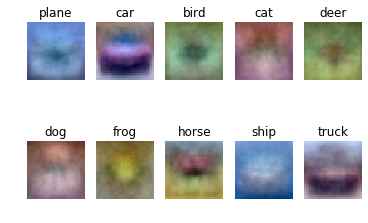

In [8]:
# Visualize the learned weights for each class
w = best_softmax.W[:-1,:] # strip out the bias
w = w.reshape(32, 32, 3, 10)

w_min, w_max = np.min(w), np.max(w)

classes = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
for i in range(10):
    plt.subplot(2, 5, i + 1)
    
    # Rescale the weights to be between 0 and 255
    wimg = 255.0 * (w[:, :, :, i].squeeze() - w_min) / (w_max - w_min)
    plt.imshow(wimg.astype('uint8'))
    plt.axis('off')
    plt.title(classes[i])